In [1]:
%load_ext autoreload
%autoreload 2

import itertools
import os

import matplotlib.pyplot as plt
import matplotlib_venn
# Third-party modules
import numpy as np
import pandas as pd

from joblib import Parallel, delayed
from tqdm import tqdm



import seaborn as sns
import scanpy


# Olga's modules
import xspecies
import binarized
import enrich

outdir_gdrive = "/home/olga/googledrive/TabulaMicrocebus/data/cross-species"
outdir_local = "/home/olga/data_lg/data_sm_copy/tabula-microcebus/data-objects/cross-species"
outdirs = outdir_local, outdir_gdrive

# Google drive figure output folder
FIGURE_FOLDER = "/home/olga/googledrive/TabulaMicrocebus/analysis/cross-species--bladder-blood-lung-muscle"
# !ls -lha $outdir_local

GDRIVE_ANALYSIS_DIR = '/home/olga/googledrive/TabulaMicrocebus/analysis/cross-species--bladder-blood-lung-muscle'

# Load data

## Lung

In [4]:
tissue = 'lung'

h5ad = os.path.join(
    outdir_local,
    f"concatenated__human-lemur-mouse_10x__one2one_orthologs__{tissue}__preprocessed.h5ad",
)
lung_adata = scanpy.read_h5ad(h5ad)
lung_adata

AnnData object with n_obs × n_vars = 84014 × 13061
    obs: 'age', 'broad_group', 'cell_barcode', 'cell_id', 'cell_id_v1', 'cell_id_v2', 'cell_ontology_class', 'cell_ontology_id', 'channel', 'compartment_group', 'free_annotation', 'individual', 'n_counts', 'n_genes', 'narrow_group', 'sequencing_run', 'sex', 'species', 'species_batch', 'species_latin', 'subtissue', 'tissue', 'compartment_broad', 'compartment_narrow', 'compartment_broad_narrow', 'compartment_species', 'compartment_narrow_species', 'log_counts', 'sqrt_counts'
    var: 'n_cells-mouse_tabula_muris_senis', 'mouse_lemur__gene_name-mouse_tabula_muris_senis', 'mouse__gene_name-mouse_tabula_muris_senis', 'mouse_lemur__gene_name-mouse_ce', 'mouse__gene_name-mouse_ce', 'mouse_lemur__gene_name-human_hlca', 'mouse__gene_name-human_hlca', 'ensembl_id-human_sapiens', 'len-human_sapiens', 'name-lemur', 'highly_variable-lemur', 'mouse_lemur__gene_name-lemur', 'mouse__gene_name-lemur', 'n_cells', 'highly_variable', 'means', 'dispersions'

In [5]:
lung_cross_species = xspecies.CrossSpeciesComparison(lung_adata, 'compartment_narrow')
lung_cross_species.make_subset_adatas(do_pca_umap=False)

compartment_narrow                    species    
endothelial: artery cell              Mouse            95
                                      Mouse lemur     143
                                      Human          1306
endothelial: capillary aerocyte cell  Mouse           512
                                      Mouse lemur     900
                                                     ... 
stromal: myofibroblast cell           Mouse lemur      50
                                      Human           221
stromal: pericyte cell                Mouse            59
                                      Mouse lemur      71
                                      Human          1350
Length: 69, dtype: int64

------- group: endothelial: artery cell -------
number of cells: 1544

------- group: endothelial: capillary aerocyte cell -------
number of cells: 5124

------- group: endothelial: capillary cell -------
number of cells: 8833

------- group: endothelial: lymphatic cell -------
number 

In [6]:
lung_cross_species_compartment = xspecies.CrossSpeciesComparison(lung_adata, 'compartment_group')
lung_cross_species_compartment.make_subset_adatas(do_pca_umap=False)

compartment_group  species    
endothelial        Mouse           2696
                   Mouse lemur     3146
                   Human          11787
epithelial         Mouse            177
                   Mouse lemur      981
                   Human           5467
lymphoid           Mouse           4467
                   Mouse lemur     6352
                   Human           8715
myeloid            Mouse           9558
                   Mouse lemur     7554
                   Human          16241
stromal            Mouse           2292
                   Mouse lemur     1435
                   Human           3146
dtype: int64

------- group: endothelial -------
number of cells: 17629

------- group: epithelial -------
number of cells: 6625

------- group: lymphoid -------
number of cells: 19534

------- group: myeloid -------
number of cells: 33353

------- group: stromal -------
number of cells: 6873

------- group: Mouse -------
number of cells: 19190

------- group: Mouse 

In [7]:
parquet = os.path.join(
    GDRIVE_ANALYSIS_DIR, f"{tissue}/binarized/binarized__{tissue}__narrow_group.parquet"
)
lung_binarized = pd.read_parquet(parquet).unstack(level=-1)
lung_binarized.head()

XKR4                    SOX17  \
species                               Mouse Mouse lemur  Human Mouse   
narrow_group                                                           
endothelial: artery cell              False       False  False  True   
endothelial: capillary aerocyte cell  False       False  False  True   
endothelial: capillary cell           False       False  False  True   
endothelial: lymphatic cell           False       False  False  True   
endothelial: vein cell                False       False  False  True   

                                                        MRPL15              \
species                              Mouse lemur  Human  Mouse Mouse lemur   
narrow_group                                                                 
endothelial: artery cell                    True   True   True       False   
endothelial: capillary aerocyte cell       False   True   True       False   
endothelial: capillary cell                 True   True   True       False   
endothelial: lymphatic cell                False  False   True       False   
endothelial: vein cell                      True   True   True       False   

                                           LYPLA1  ...   ASMT VAMP7  \
species                              Human  Mouse  ...  Human Mouse   
narrow_group                                       ...                
endothelial: artery cell              True   True  ...  False  True   
endothelial: capillary aerocyte cell  True   True  ...  False  True   
endothelial: capillary cell           True   True  ...  False  True   
endothelial: lymphatic cell           True   True  ...  False  True   
endothelial: vein cell                True   True  ...  False  True   

                                                        SPRY3              \
species                              Mouse lemur Human  Mouse Mouse lemur   
narrow_group                                                                
endothelial: artery cell                   False  True  False       False   
endothelial: capillary aerocyte cell        True  True  False       False   
endothelial: capillary cell                 True  True  False       False   
endothelial: lymphatic cell                 True  True  False       False   
endothelial: vein cell                      True  True  False       False   

                                             TMLHE                     
species                               Human  Mouse Mouse lemur  Human  
narrow_group                                                           
endothelial: artery cell              False  False       False  False  
endothelial: capillary aerocyte cell  False  False       False  False  
endothelial: capillary cell           False  False       False  False  
endothelial: lymphatic cell           False  False       False   True  
endothelial: vein cell                False  False       False  False  

[5 rows x 39162 columns]

In [8]:
lung_csv = os.path.join(GDRIVE_ANALYSIS_DIR, f'{tissue}/binarized/per_gene_categorization__{tissue}__narrow_group.csv')
lung_gene_categories = pd.read_csv(lung_csv)
lung_gene_categories.head()

,gene_name,bitscore,gene_category,tissue,celltype_group
0,A1BG,0000000000000000000010010010010010000010010010...,"Human-specific, celltype-specific",lung,narrow_group
1,A2M,0010010010010010000010000000000000000010000010...,"Human-specific, celltype-specific",lung,narrow_group
2,A3GALT2,0000000000000000100000000000000000000000000000...,"Lemur-specific, celltype-specific",lung,narrow_group
3,A4GALT,1011011011011010110110100000000000001100000010...,Other,lung,narrow_group
4,AAAS,0011010001010000110011010001000001001111110110...,Other,lung,narrow_group


## Muscle

## Blood

In [9]:
tissue = 'blood'

h5ad = os.path.join(
    outdir_local,
    f"concatenated__human-lemur-mouse_10x__one2one_orthologs__{tissue}__preprocessed.h5ad",
)
blood_adata = scanpy.read_h5ad(h5ad)
blood_adata

AnnData object with n_obs × n_vars = 33103 × 12496
    obs: 'age', 'cell_id', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'n_genes', 'sex', 'subtissue', 'tissue', 'species', 'species_latin', 'channel', 'sequencing_run', 'cell_barcode', 'n_counts', 'individual', 'narrow_group', 'broad_group', 'compartment_group', 'cell_id_v1', 'cell_id_v2', 'species_batch', 'compartment_broad', 'compartment_narrow', 'compartment_broad_narrow', 'compartment_species', 'compartment_narrow_species', 'log_counts', 'sqrt_counts'
    var: 'mouse_lemur__gene_name-human_hlca', 'mouse__gene_name-human_hlca', 'ensembl_id-human_sapiens', 'len-human_sapiens', 'mouse_lemur__gene_name-lemur', 'mouse__gene_name-lemur', 'name-lemur', 'highly_variable-lemur', 'mouse_lemur__gene_name-mouse_ce', 'mouse__gene_name-mouse_ce', 'n_cells-mouse_tabula_muris_senis', 'mouse_lemur__gene_name-mouse_tabula_muris_senis', 'mouse__gene_name-mouse_tabula_muris_senis', 'n_cells', 'highly_variable', 'means', 'dispersions'

In [10]:
blood_cross_species = xspecies.CrossSpeciesComparison(blood_adata, "compartment_narrow")
blood_cross_species.make_subset_adatas(do_pca_umap=False)

compartment_narrow             species    
lymphoid: B cell               Mouse           1834
                               Mouse lemur      674
                               Human            230
lymphoid: CD4+ T cell          Mouse            570
                               Mouse lemur     1645
                               Human           2297
lymphoid: CD8+ T cell          Mouse            467
                               Mouse lemur      153
                               Human           1942
lymphoid: natural killer cell  Mouse            535
                               Mouse lemur      374
                               Human           3698
myeloid: macrophage            Mouse            338
                               Mouse lemur       33
                               Human          13737
myeloid: monocyte              Mouse           1446
                               Mouse lemur     1292
                               Human           1838
dtype: int64

-------

In [11]:
blood_cross_species_compartment = xspecies.CrossSpeciesComparison(blood_adata, 'compartment_group')
blood_cross_species_compartment.make_subset_adatas(do_pca_umap=False)

compartment_group  species    
lymphoid           Mouse           3406
                   Mouse lemur     2846
                   Human           8167
myeloid            Mouse           1784
                   Mouse lemur     1325
                   Human          15575
dtype: int64

------- group: lymphoid -------
number of cells: 14419

------- group: myeloid -------
number of cells: 18684

------- group: Mouse -------
number of cells: 5190

------- group: Mouse lemur -------
number of cells: 4171

------- group: Human -------
number of cells: 23742


In [12]:
parquet = os.path.join(GDRIVE_ANALYSIS_DIR, f'{tissue}/binarized/binarized__{tissue}__narrow_group.parquet')
blood_binarized = pd.read_parquet(parquet).unstack(level=-1)
blood_binarized.head()

XKR4                     SOX17                    MRPL15  \
species       Mouse Mouse lemur  Human  Mouse Mouse lemur  Human  Mouse   
narrow_group                                                              
B cell        False       False  False  False       False  False   True   
CD4+ T cell   False       False  False  False       False  False   True   
CD8+ T cell   False       False  False  False       False  False   True   
macrophage    False        True  False  False       False  False   True   
monocyte      False        True  False  False       False  False   True   

                               LYPLA1  ...   ASMT  VAMP7                    \
species      Mouse lemur Human  Mouse  ...  Human  Mouse Mouse lemur Human   
narrow_group                           ...                                   
B cell             False  True   True  ...  False  False       False  True   
CD4+ T cell        False  True   True  ...  False   True       False  True   
CD8+ T cell        False  True   True  ...  False   True       False  True   
macrophage          True  True   True  ...  False   True        True  True   
monocyte           False  True   True  ...  False   True        True  True   

              SPRY3                     TMLHE                     
species       Mouse Mouse lemur  Human  Mouse Mouse lemur  Human  
narrow_group                                                      
B cell        False       False  False  False       False  False  
CD4+ T cell   False       False  False  False       False  False  
CD8+ T cell   False       False  False  False       False  False  
macrophage    False       False  False  False       False   True  
monocyte      False       False  False  False       False   True  

[5 rows x 37377 columns]

In [13]:
blood_csv = os.path.join(GDRIVE_ANALYSIS_DIR, f'{tissue}/binarized/per_gene_categorization__{tissue}__narrow_group.csv')
blood_gene_categories = pd.read_csv(blood_csv, dtype={'bitscore': str})
blood_gene_categories.head()

,gene_name,bitscore,gene_category,tissue,celltype_group
0,A1BG,001001001001001000,"Human-specific, celltype-specific",blood,narrow_group
1,A2M,000000000001001000,"Human-specific, celltype-specific",blood,narrow_group
2,A3GALT2,000000000010010000,"Lemur-specific, celltype-specific",blood,narrow_group
3,A4GALT,000000000001000000,"Human-specific, celltype-specific",blood,narrow_group
4,AAAS,101000000101000000,"Human-specific, celltype-specific",blood,narrow_group


In [14]:
blood_gene_categories.dtypes

gene_name         object
bitscore          object
gene_category     object
tissue            object
celltype_group    object
dtype: object

# Combine data

## Cross species objects

In [15]:
cross_species_objs = {"lung": lung_cross_species, "blood": blood_cross_species}
cross_species_objs

{'lung': <xspecies.CrossSpeciesComparison at 0x7fa27db47908>,
 'blood': <xspecies.CrossSpeciesComparison at 0x7fa26993a710>}

## Cross species objects

In [16]:
cross_species_compartment_objs = {"lung": lung_cross_species_compartment, "blood": blood_cross_species_compartment}
cross_species_compartment_objs

{'lung': <xspecies.CrossSpeciesComparison at 0x7fa26e966ba8>,
 'blood': <xspecies.CrossSpeciesComparison at 0x7fa250a81a58>}

## Binarized gene expression


In [17]:
binarized_dfs = {"lung": lung_binarized, "blood": blood_binarized}

## Gene category data

In [18]:
gene_categories = pd.concat(
    [blood_gene_categories, lung_gene_categories], ignore_index=True
)

In [19]:
gene_categories[
    "lemur_eq_human"
] = gene_categories.gene_category.str.contains("lemur=human")
lemur_eq_human = gene_categories.query(
    "lemur_eq_human == True"
)
lemur_eq_human

,gene_name,bitscore,gene_category,tissue,celltype_group,lemur_eq_human
7,AAK1,011111111111011111,"Expansion to constitutive in primates, lemur=h...",blood,narrow_group,True
20,ABCA9,000000000100100000,"Mouse-specific, celltype-specific, lemur=human",blood,narrow_group,True
24,ABCB9,000100100000000000,"Mouse-specific, celltype-specific, lemur=human",blood,narrow_group,True
28,ABCC4,000000000000100000,"Mouse-specific, celltype-specific, lemur=human",blood,narrow_group,True
31,ABCD2,000000000100100000,"Mouse-specific, celltype-specific, lemur=human",blood,narrow_group,True
...,...,...,...,...,...,...
19916,ZNF652,1110110110110110111110110111111110111111110110...,"Expansion to constitutive in primates, lemur=h...",lung,narrow_group,True
19942,ZNF777,0000000000000001001000000000000000000000000000...,"Mouse-specific, celltype-specific, lemur=human",lung,narrow_group,True
19954,ZNF831,0000000000000000000001000000000000000000000000...,"Mouse-specific, celltype-specific, lemur=human",lung,narrow_group,True
19971,ZRANB3,0000000000000000000000000000000000000001000000...,"Mouse-specific, celltype-specific, lemur=human",lung,narrow_group,True


In [20]:
lemur_eq_human.gene_name.nunique()

1417

In [21]:
lemur_eq_human.groupby(['tissue', 'gene_category']).gene_name.nunique()

tissue  gene_category                                      
blood   Celltype-switching, mouse!=human, lemur=human            8
        Constitutively expressed in Mouse only, lemur=human     21
        Constitutively expressed in Primates, lemur=human       12
        Contraction in primates, lemur=human                   159
        Expansion to constitutive in primates, lemur=human     136
        Expansion to primates, lemur=human                      48
        Mouse-specific, celltype-specific, lemur=human         456
lung    Celltype-switching, mouse!=human, lemur=human           10
        Constitutively expressed in Mouse only, lemur=human      2
        Constitutively expressed in Primates, lemur=human        5
        Contraction in primates, lemur=human                   106
        Expansion to constitutive in primates, lemur=human     129
        Expansion to primates, lemur=human                      23
        Mouse-specific, celltype-specific, lemur=human         447
Na

In [89]:
n_tissues = lemur_eq_human.tissue.nunique()
n_tissues

2

In [90]:
lemur_eq_human.groupby('gene_name').filter(lambda x: len(x) == n_tissues)

,gene_name,bitscore,gene_category,tissue,celltype_group,lemur_eq_human
7,AAK1,011111111111011111,"Expansion to constitutive in primates, lemur=h...",blood,narrow_group,True
31,ABCD2,000000000100100000,"Mouse-specific, celltype-specific, lemur=human",blood,narrow_group,True
43,ABHD13,011011011111111111,"Expansion to constitutive in primates, lemur=h...",blood,narrow_group,True
66,ACAD11,000000000100000000,"Mouse-specific, celltype-specific, lemur=human",blood,narrow_group,True
189,AGMO,000000000100000000,"Mouse-specific, celltype-specific, lemur=human",blood,narrow_group,True
...,...,...,...,...,...,...
19855,ZNF394,0110110110110110110111111111111111110111110111...,"Expansion to constitutive in primates, lemur=h...",lung,narrow_group,True
19865,ZNF436,0001001000001000001000000000000000000000000000...,"Mouse-specific, celltype-specific, lemur=human",lung,narrow_group,True
19916,ZNF652,1110110110110110111110110111111110111111110110...,"Expansion to constitutive in primates, lemur=h...",lung,narrow_group,True
19942,ZNF777,0000000000000001001000000000000000000000000000...,"Mouse-specific, celltype-specific, lemur=human",lung,narrow_group,True


In [91]:
lemur_eq_human__blood_lung_match = lemur_eq_human.groupby("gene_name").filter(
    lambda x: len(x) == n_tissues and x["gene_category"].nunique() == 1
)
lemur_eq_human__blood_lung_match.head()

,gene_name,bitscore,gene_category,tissue,celltype_group,lemur_eq_human
7,AAK1,011111111111011111,"Expansion to constitutive in primates, lemur=h...",blood,narrow_group,True
31,ABCD2,000000000100100000,"Mouse-specific, celltype-specific, lemur=human",blood,narrow_group,True
43,ABHD13,011011011111111111,"Expansion to constitutive in primates, lemur=h...",blood,narrow_group,True
66,ACAD11,000000000100000000,"Mouse-specific, celltype-specific, lemur=human",blood,narrow_group,True
189,AGMO,000000000100000000,"Mouse-specific, celltype-specific, lemur=human",blood,narrow_group,True


In [92]:
lemur_eq_human__blood_lung_match.groupby('gene_category').gene_name.nunique()

gene_category
Constitutively expressed in Mouse only, lemur=human     6
Constitutively expressed in Primates, lemur=human       3
Contraction in primates, lemur=human                    2
Expansion to constitutive in primates, lemur=human     49
Mouse-specific, celltype-specific, lemur=human         54
Name: gene_name, dtype: int64

## Dotplots of primate-enriched genes by binary analyses

In [93]:
gene_category_n_genes = lemur_eq_human__blood_lung_match.groupby('gene_category').gene_name.nunique()
gene_category_n_genes

gene_category
Constitutively expressed in Mouse only, lemur=human     6
Constitutively expressed in Primates, lemur=human       3
Contraction in primates, lemur=human                    2
Expansion to constitutive in primates, lemur=human     49
Mouse-specific, celltype-specific, lemur=human         54
Name: gene_name, dtype: int64

In [94]:
def sanitize(name):
    sanitized = name.lower().replace(' ', '_').replace(',', '_').replace('=', '-eq-')
    return sanitized

gene_category_n_genes.index.map(xspecies.sanitize)

Index(['constitutively_expressed_in_mouse_only__lemur-eq-human',
       'constitutively_expressed_in_primates__lemur-eq-human',
       'contraction_in_primates__lemur-eq-human',
       'expansion_to_constitutive_in_primates__lemur-eq-human',
       'mouse-specific__celltype-specific__lemur-eq-human'],
      dtype='object', name='gene_category')

In [95]:
FIGURE_FOLDER

'/home/olga/googledrive/TabulaMicrocebus/analysis/cross-species--bladder-blood-lung-muscle'

In [96]:
figure_folder = os.path.join(FIGURE_FOLDER, 'binarized_combined_tissues')
# os.makedirs(figure_folder)
figure_folder

'/home/olga/googledrive/TabulaMicrocebus/analysis/cross-species--bladder-blood-lung-muscle/binarized_combined_tissues'

In [97]:
! mkdir -p $figure_folder

In [98]:
type(figure_folder)

str

In [99]:
figure_folder_as_realpath = os.path.realpath(figure_folder)
figure_folder_as_realpath

'/home/olga/googledrive/TabulaMicrocebus/analysis/cross-species--bladder-blood-lung-muscle/binarized_combined_tissues'

In [100]:
type(figure_folder_as_realpath)

str

In [101]:
scanpy.settings.figdir = os.path.realpath(figure_folder)
scanpy._settings.ScanpyConfig.figdir = os.path.realpath(figure_folder)

In [102]:
sns.set_context('paper')

--- gene_category: Constitutively expressed in Mouse only, lemur=human ---
	--- tissue: blood ---
		--- bitscore: 100100100100100100 ---
['GABPB2' 'HNRNPH2' 'PTCD2' 'RPGRIP1' 'TTC4' 'TXNDC5']
gene subset #1

------- group: lymphoid -------


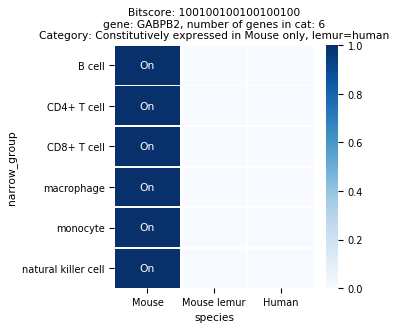

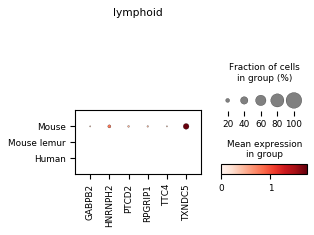


------- group: myeloid -------


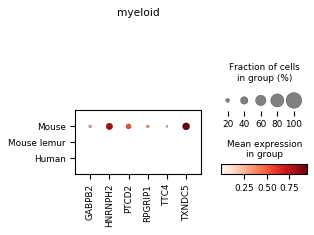

	--- tissue: lung ---
		--- bitscore: 100100100100100100100100100100100100100100100100100100100100100100100 ---
['HNRNPH2' 'RPGRIP1']
gene subset #1

------- group: endothelial -------


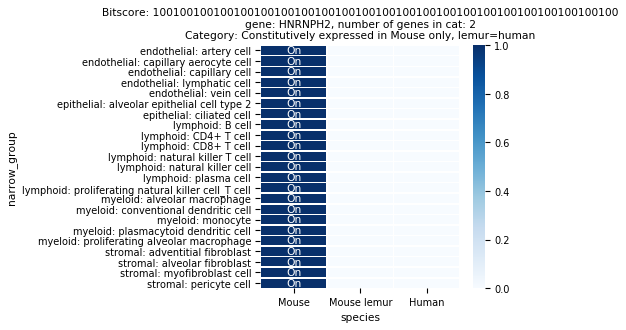

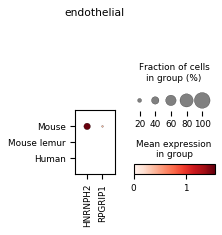


------- group: epithelial -------


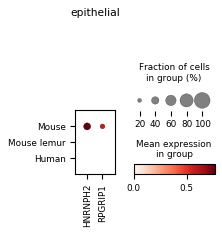


------- group: lymphoid -------


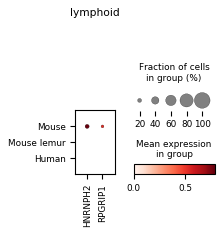


------- group: myeloid -------


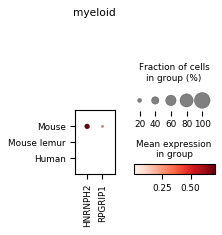


------- group: stromal -------


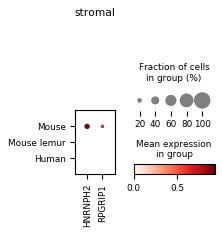

		--- bitscore: 100100100100100100100100100100100100100100100100100100101100100100100 ---
['PTCD2']
gene subset #1

------- group: endothelial -------


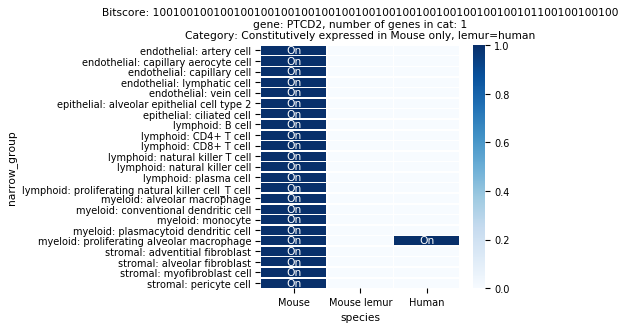

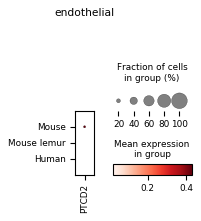


------- group: epithelial -------


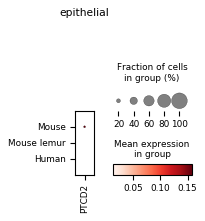


------- group: lymphoid -------


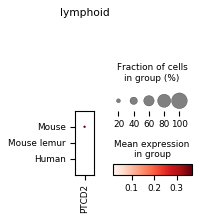


------- group: myeloid -------


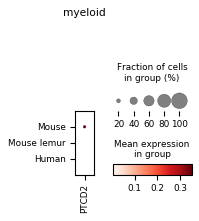


------- group: stromal -------


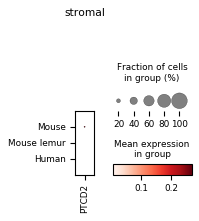

		--- bitscore: 100100100100100100101100100100100100100100100100100100101100100100100 ---
['GABPB2']
gene subset #1

------- group: endothelial -------


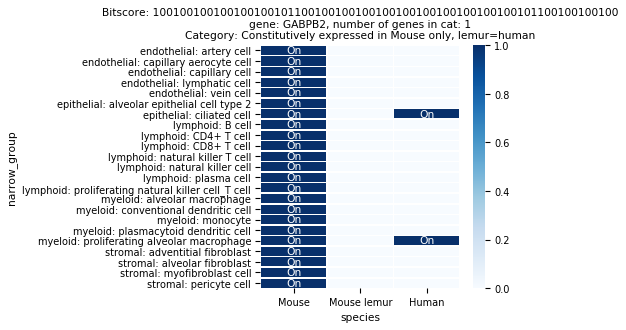

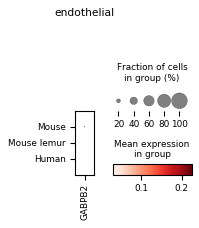


------- group: epithelial -------


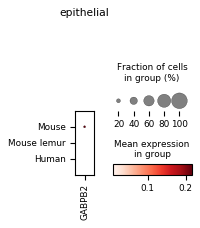


------- group: lymphoid -------


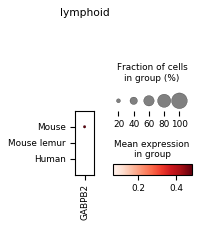


------- group: myeloid -------


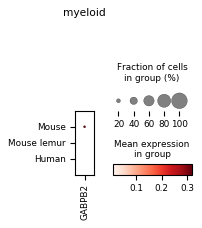


------- group: stromal -------


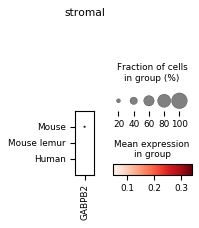

		--- bitscore: 100100100100100110100100100100100100100110110100100100110100100100100 ---
['TTC4']
gene subset #1

------- group: endothelial -------


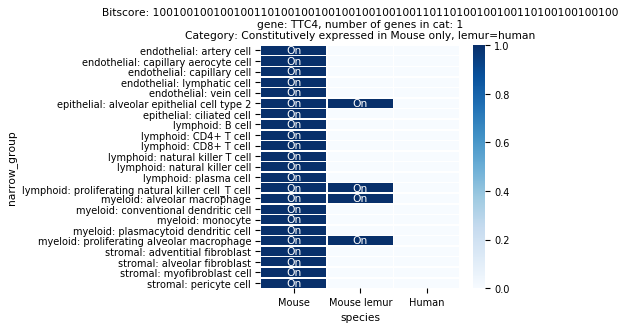

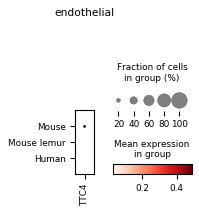


------- group: epithelial -------


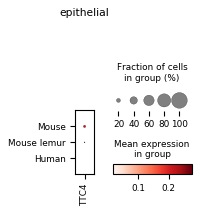


------- group: lymphoid -------


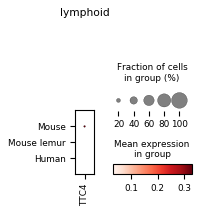


------- group: myeloid -------


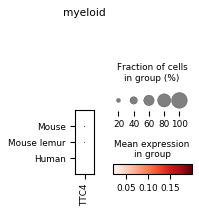


------- group: stromal -------


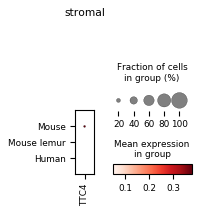

		--- bitscore: 110100100100110110100100100100100100110110110110100100110110110100100 ---
['TXNDC5']
gene subset #1

------- group: endothelial -------


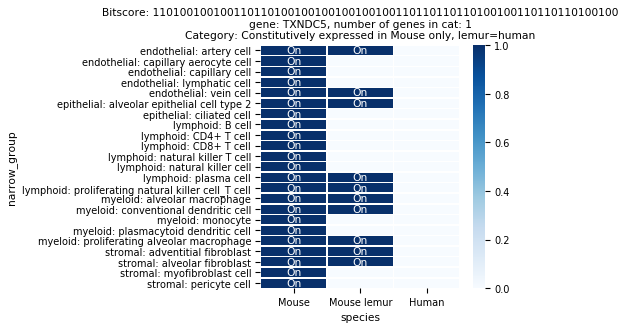

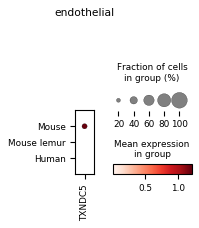


------- group: epithelial -------


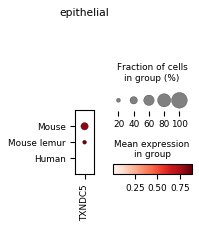


------- group: lymphoid -------


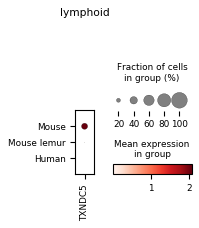


------- group: myeloid -------


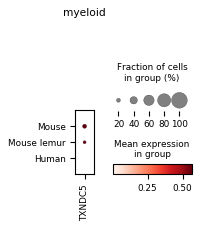


------- group: stromal -------


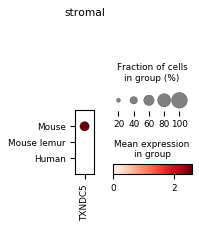

--- gene_category: Constitutively expressed in Primates, lemur=human ---
	--- tissue: blood ---
		--- bitscore: 011011011011011011 ---
['ATP6V0C' 'HNRNPA1' 'TYMP']
gene subset #1

------- group: lymphoid -------


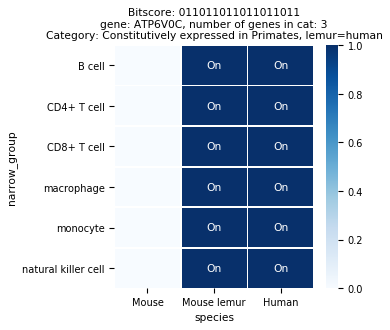

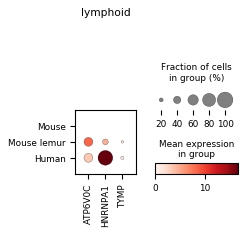


------- group: myeloid -------


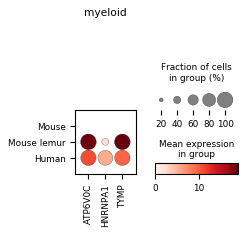

	--- tissue: lung ---
		--- bitscore: 011011011011011011011011011011011011011011011011011011011011011011011 ---
['ATP6V0C' 'HNRNPA1' 'TYMP']
gene subset #1

------- group: endothelial -------


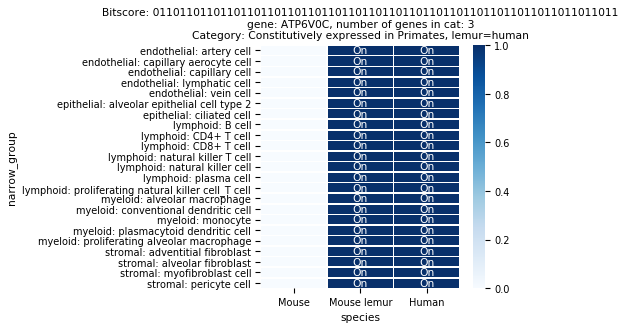

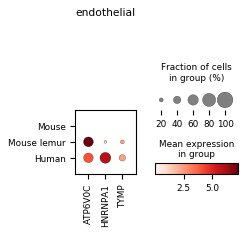


------- group: epithelial -------


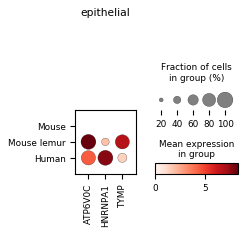


------- group: lymphoid -------


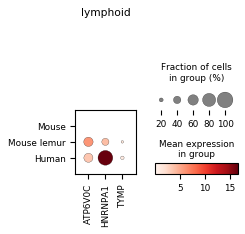


------- group: myeloid -------


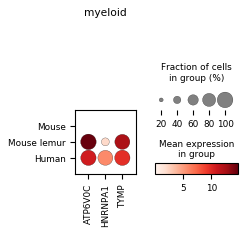


------- group: stromal -------


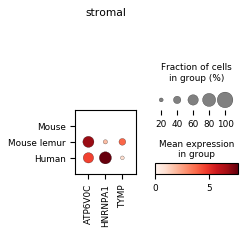

--- gene_category: Contraction in primates, lemur=human ---
	--- tissue: blood ---
		--- bitscore: 000111111000000100 ---
['CD28']
gene subset #1

------- group: lymphoid -------


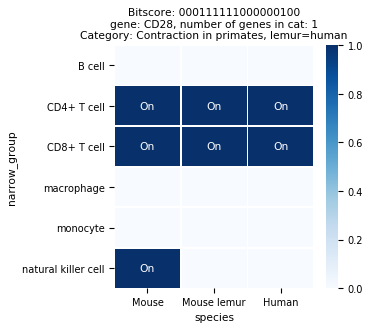

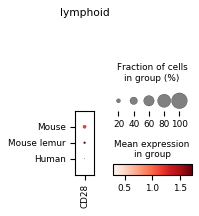


------- group: myeloid -------


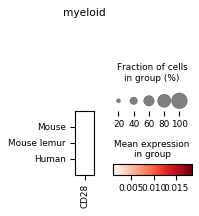

		--- bitscore: 111000000100000000 ---
['MS4A1']
gene subset #1

------- group: lymphoid -------


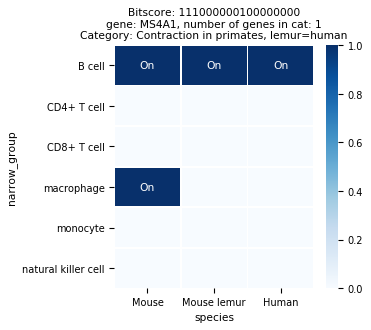

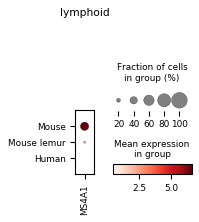


------- group: myeloid -------


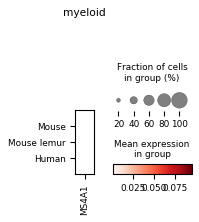

	--- tissue: lung ---
		--- bitscore: 000000000000000000000000111111100100100111000000000100000000000000000 ---
['CD28']
gene subset #1

------- group: endothelial -------


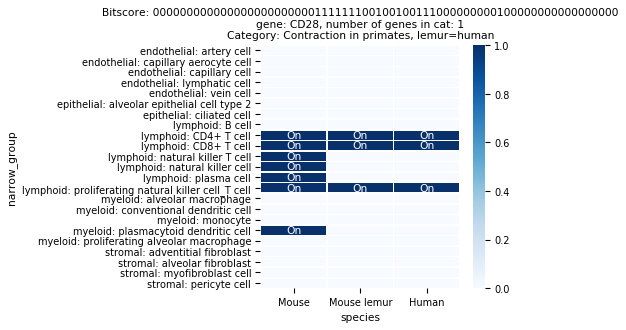

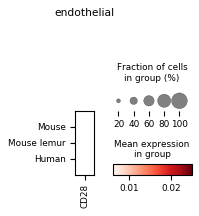


------- group: epithelial -------


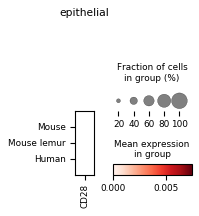


------- group: lymphoid -------


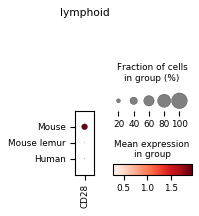


------- group: myeloid -------


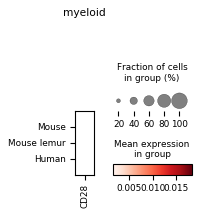


------- group: stromal -------


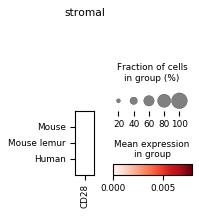

		--- bitscore: 000000000000000000000111000000000000100000000000000000000000000000000 ---
['MS4A1']
gene subset #1

------- group: endothelial -------


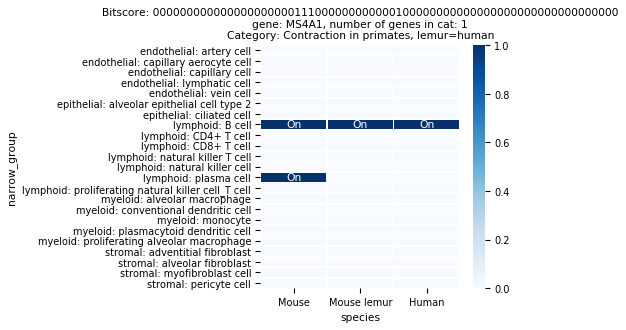

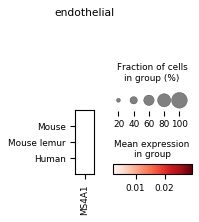


------- group: epithelial -------


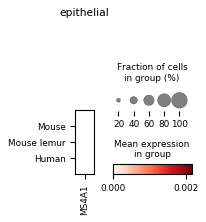


------- group: lymphoid -------


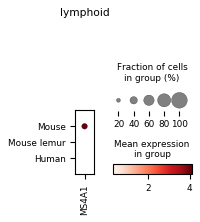


------- group: myeloid -------


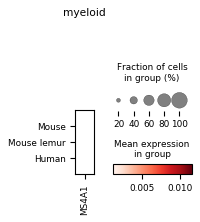


------- group: stromal -------


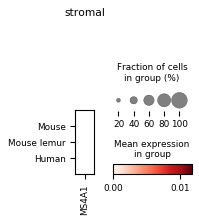

--- gene_category: Expansion to constitutive in primates, lemur=human ---
	--- tissue: blood ---
		--- bitscore: 011011011011111111 ---
['FKBP5']
gene subset #1

------- group: lymphoid -------


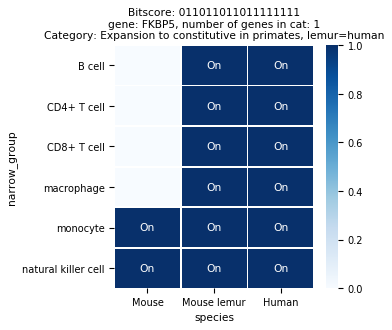

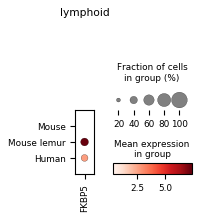


------- group: myeloid -------


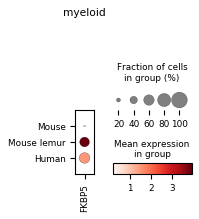

		--- bitscore: 011011011111011011 ---
['CD63' 'COIL' 'GNL3L' 'NDUFS5' 'RPL30' 'ZNF652']
gene subset #1

------- group: lymphoid -------


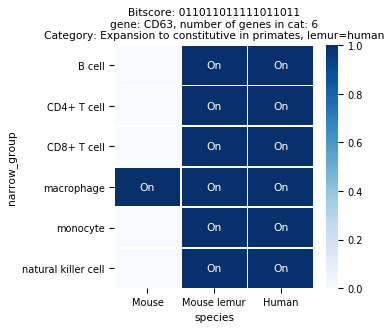

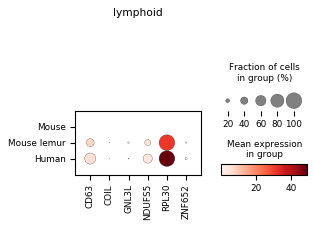


------- group: myeloid -------


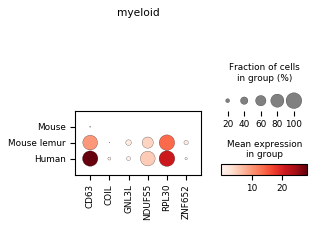

		--- bitscore: 011011011111011111 ---
['IP6K2']
gene subset #1

------- group: lymphoid -------


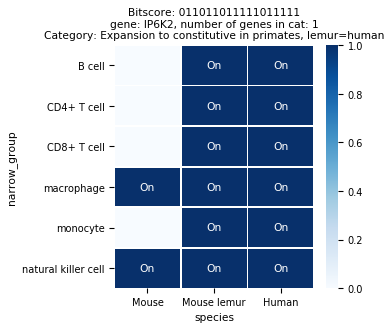

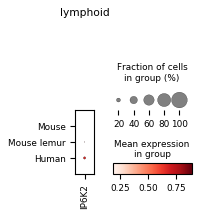


------- group: myeloid -------


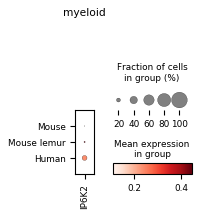

		--- bitscore: 011011011111111011 ---
['DPP7' 'MRPL47' 'MRPS2' 'NMRAL1' 'TMEM205' 'VPS13C' 'ZNF394']
gene subset #1

------- group: lymphoid -------


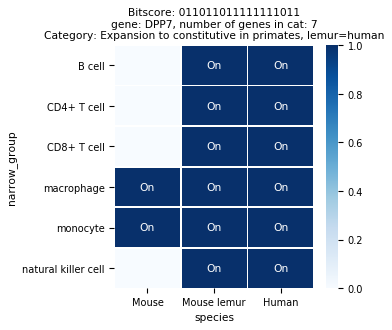

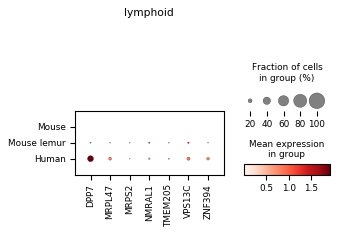


------- group: myeloid -------


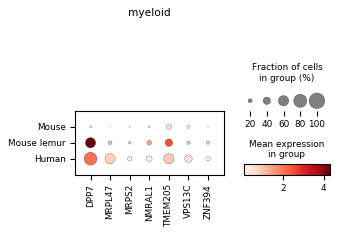

		--- bitscore: 011011011111111111 ---
['ABHD13' 'PLIN2' 'SEC14L1' 'SMC5']
gene subset #1

------- group: lymphoid -------


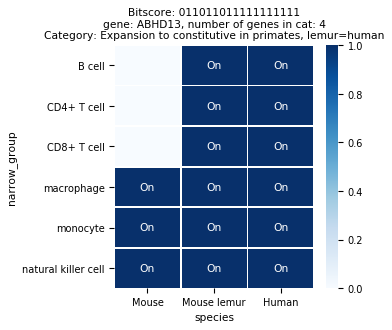

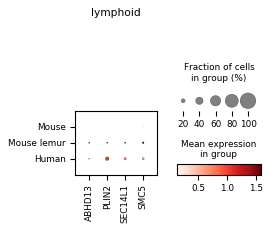


------- group: myeloid -------


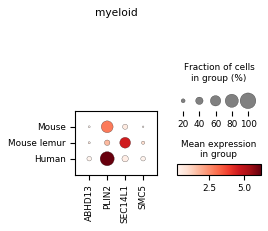

		--- bitscore: 011011111111011011 ---
['HNRNPUL1']
gene subset #1

------- group: lymphoid -------


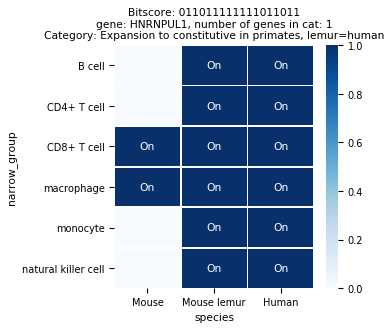

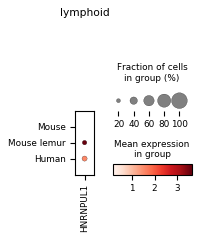


------- group: myeloid -------


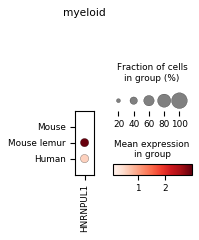

		--- bitscore: 011011111111111011 ---
['IARS2' 'TMEM126B']
gene subset #1

------- group: lymphoid -------


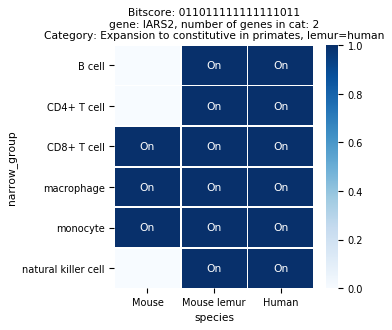

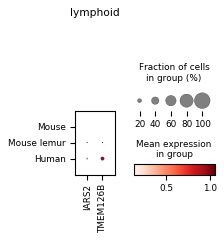


------- group: myeloid -------


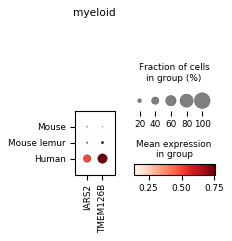

		--- bitscore: 011011111111111111 ---
['CCT6A' 'XRN1']
gene subset #1

------- group: lymphoid -------


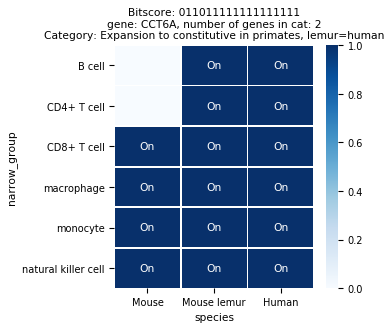

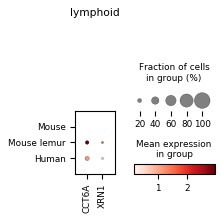


------- group: myeloid -------


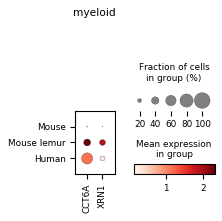

		--- bitscore: 011111011111111011 ---
['CEP350']
gene subset #1

------- group: lymphoid -------


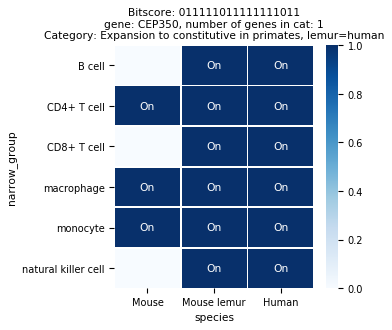

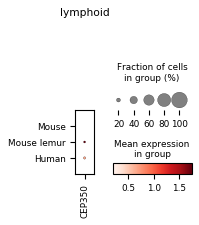


------- group: myeloid -------


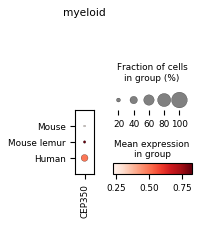

		--- bitscore: 011111111111011111 ---
['AAK1']
gene subset #1

------- group: lymphoid -------


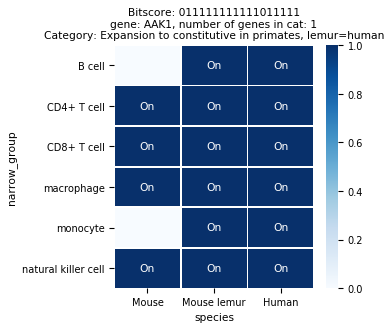

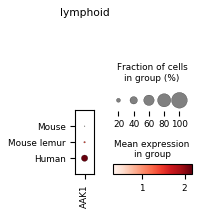


------- group: myeloid -------


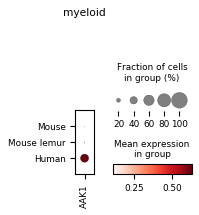

		--- bitscore: 111011011111111011 ---
['MGST3' 'TMEM50B']
gene subset #1

------- group: lymphoid -------


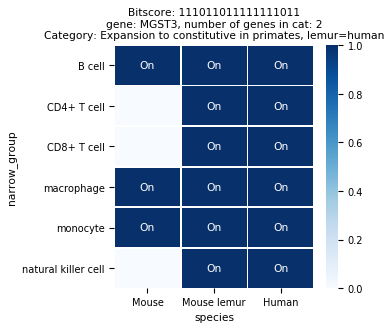

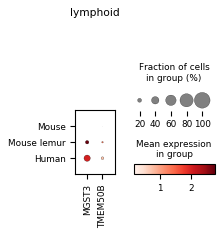


------- group: myeloid -------


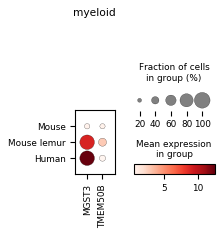

		--- bitscore: 111011011111111111 ---
['ANXA1' 'CCNC' 'DUSP22' 'GOPC' 'MTMR14' 'RNF216' 'TOR3A']
gene subset #1

------- group: lymphoid -------


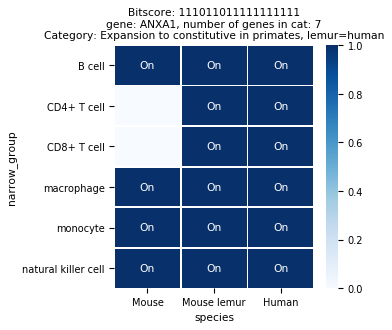

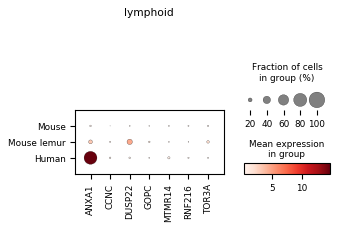


------- group: myeloid -------


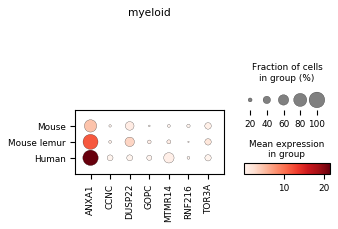

		--- bitscore: 111011111111011111 ---
['SCAPER']
gene subset #1

------- group: lymphoid -------


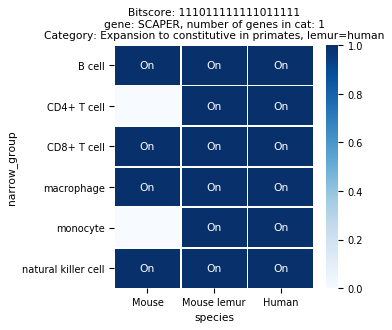

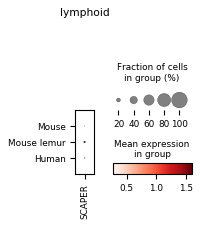


------- group: myeloid -------


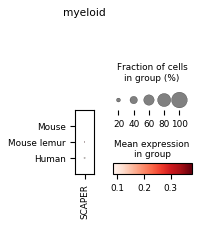

		--- bitscore: 111011111111111011 ---
['GGPS1']
gene subset #1

------- group: lymphoid -------


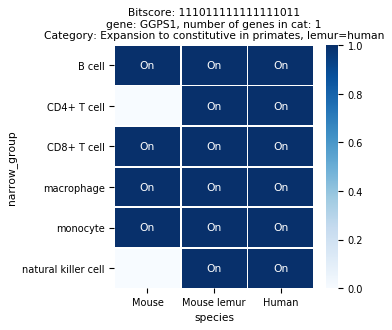

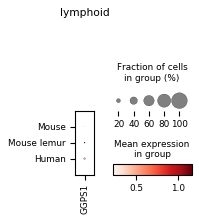


------- group: myeloid -------


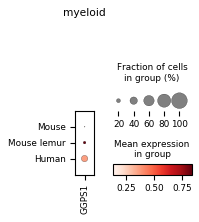

		--- bitscore: 111011111111111111 ---
['CREBZF' 'CWF19L2' 'EML3' 'GSTO1' 'METTL5' 'MPG' 'PAIP1' 'SECISBP2'
 'SREK1IP1']
gene subset #1

------- group: lymphoid -------


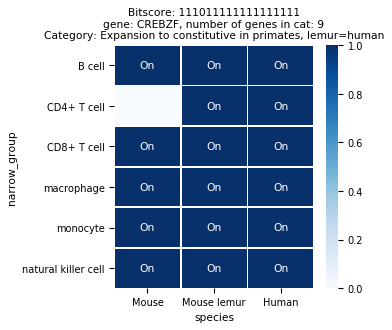

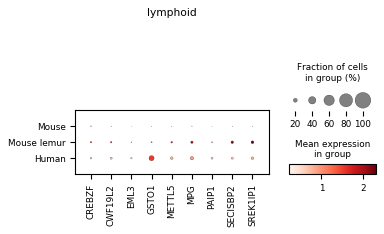


------- group: myeloid -------


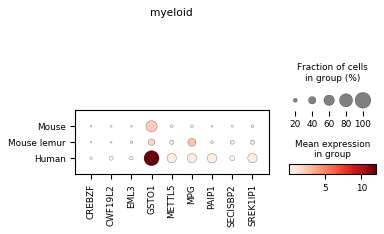

		--- bitscore: 111111011111011111 ---
['ZBTB20']
gene subset #1

------- group: lymphoid -------


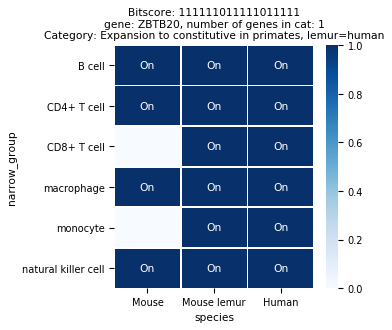

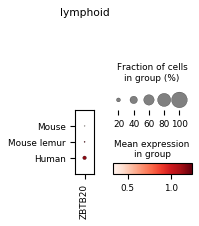


------- group: myeloid -------


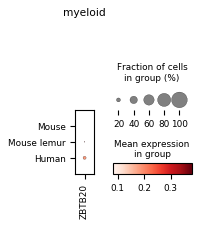

		--- bitscore: 111111011111111011 ---
['PRDX4']
gene subset #1

------- group: lymphoid -------


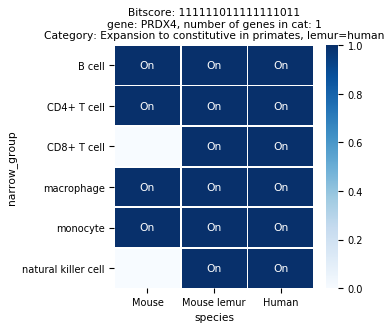

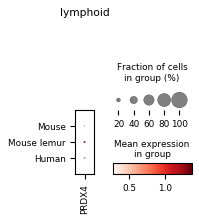


------- group: myeloid -------


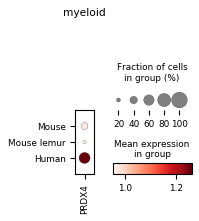

		--- bitscore: 111111011111111111 ---
['ARIH2']
gene subset #1

------- group: lymphoid -------


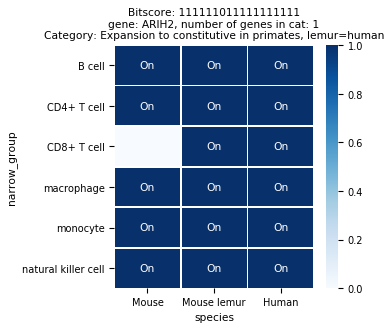

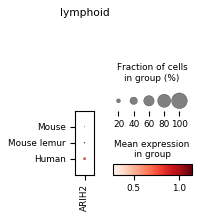


------- group: myeloid -------


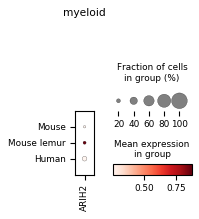

	--- tissue: lung ---
		--- bitscore: 011011011011011011011011011011011011111111011111111111111111011011011 ---
['NMRAL1']
gene subset #1

------- group: endothelial -------


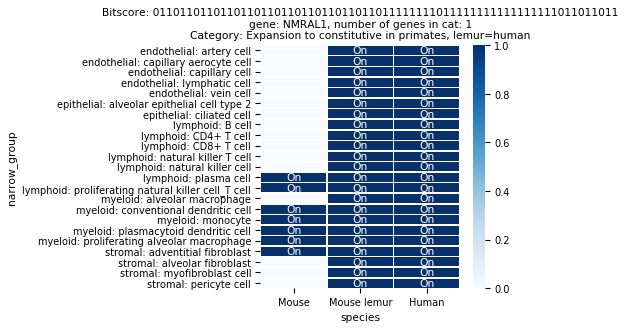

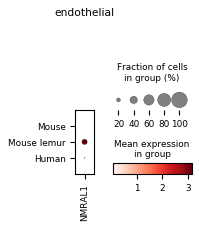


------- group: epithelial -------


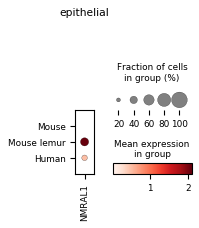


------- group: lymphoid -------


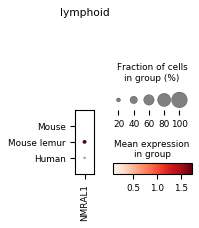


------- group: myeloid -------


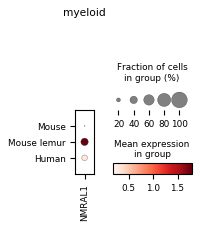


------- group: stromal -------


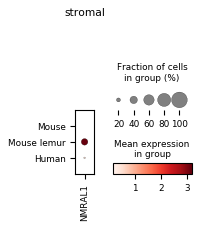

		--- bitscore: 011011011011011011011111111111111111011111011111011111111011011011111 ---
['ZNF394']
gene subset #1

------- group: endothelial -------


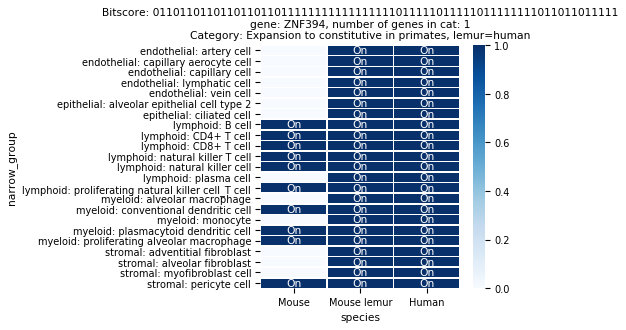

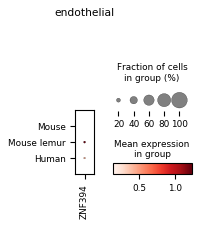


------- group: epithelial -------


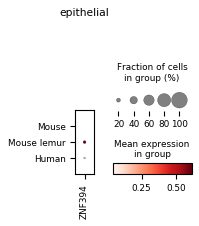


------- group: lymphoid -------


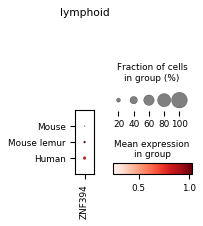


------- group: myeloid -------


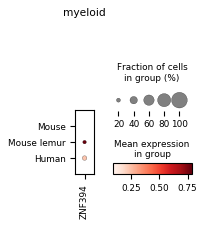


------- group: stromal -------


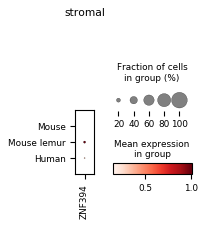

		--- bitscore: 011111011011011111011011011011011011111011111111011111111011011011111 ---
['MRPS2']
gene subset #1

------- group: endothelial -------


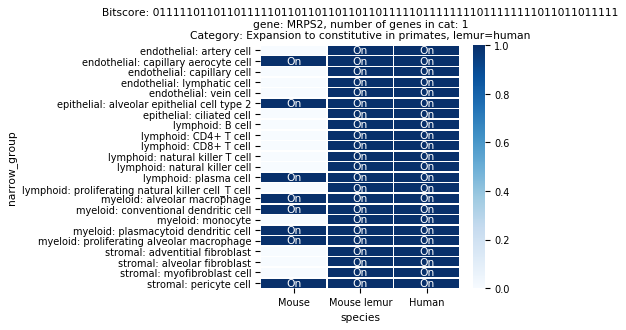

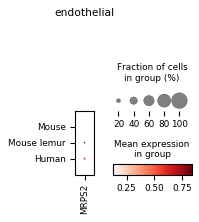


------- group: epithelial -------


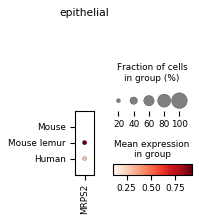


------- group: lymphoid -------


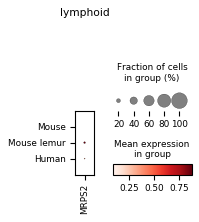


------- group: myeloid -------


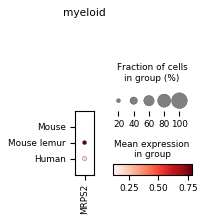


------- group: stromal -------


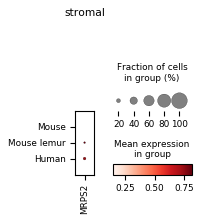

		--- bitscore: 011111011111111011111011011011011011111111011011011011011011011011011 ---
['COIL']
gene subset #1

------- group: endothelial -------


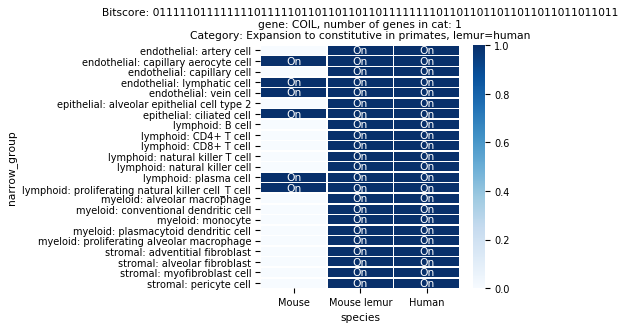

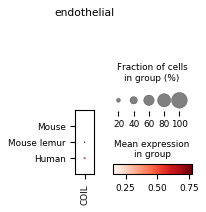


------- group: epithelial -------


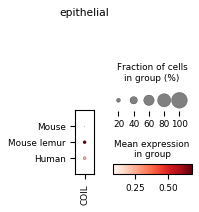


------- group: lymphoid -------


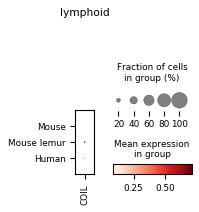


------- group: myeloid -------


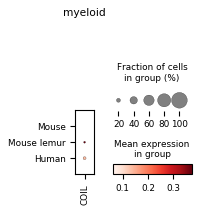


------- group: stromal -------


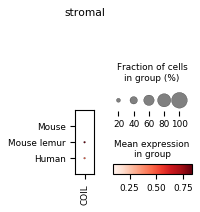

		--- bitscore: 011111111011011111111011011011111011111111011011011111011111111011111 ---
['TMEM126B']
gene subset #1

------- group: endothelial -------


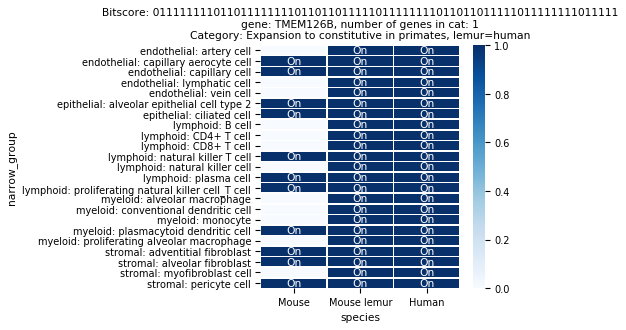

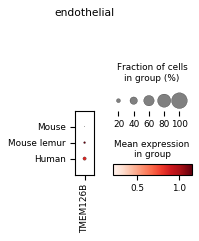


------- group: epithelial -------


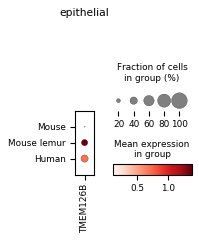


------- group: lymphoid -------


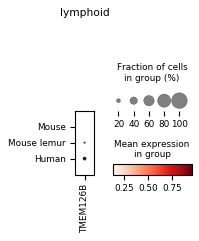


------- group: myeloid -------


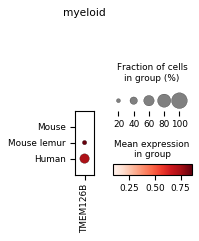


------- group: stromal -------


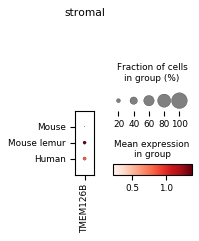

		--- bitscore: 011111111011111111111011011111111111111111111111111011111111111111111 ---
['SMC5']
gene subset #1

------- group: endothelial -------


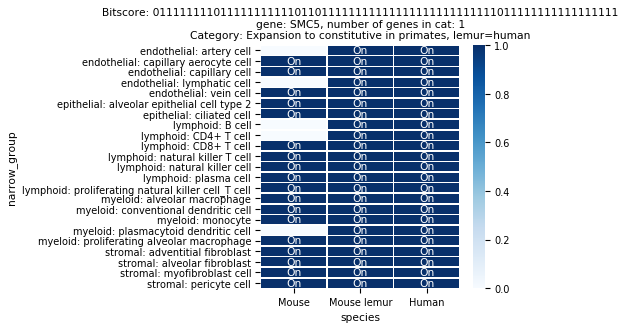

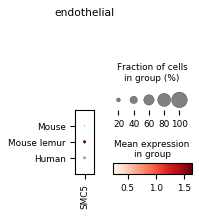


------- group: epithelial -------


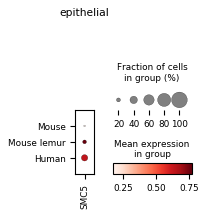


------- group: lymphoid -------


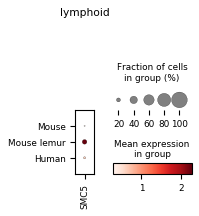


------- group: myeloid -------


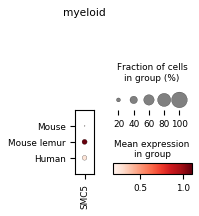


------- group: stromal -------


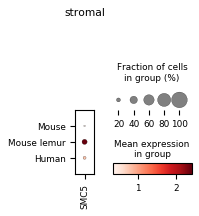

		--- bitscore: 011111111011111111111111111111111111111111011111111111011011011011011 ---
['SECISBP2']
gene subset #1

------- group: endothelial -------


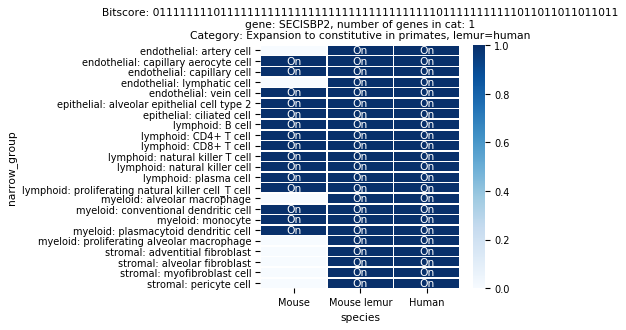

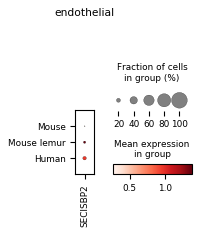


------- group: epithelial -------


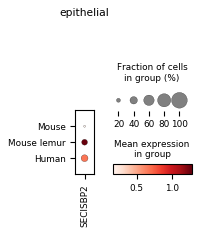


------- group: lymphoid -------


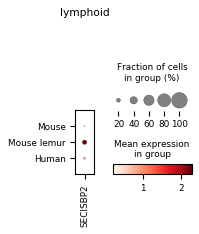


------- group: myeloid -------


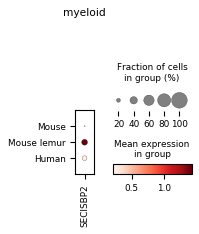


------- group: stromal -------


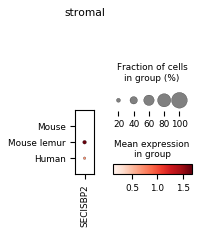

		--- bitscore: 011111111111111011111011011011011011011111111111011111111111111111111 ---
['DPP7']
gene subset #1

------- group: endothelial -------


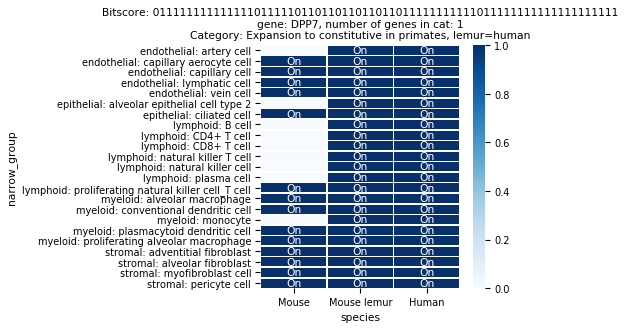

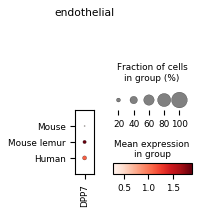


------- group: epithelial -------


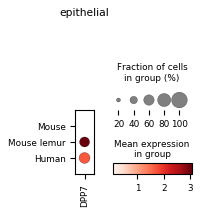


------- group: lymphoid -------


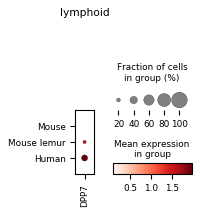


------- group: myeloid -------


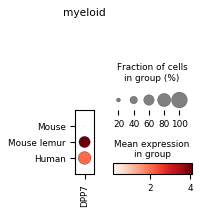


------- group: stromal -------


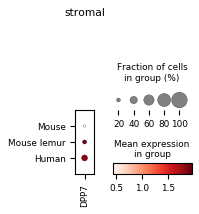

		--- bitscore: 011111111111111111111111111111111111111111111111111111111111111111111 ---
['AAK1']
gene subset #1

------- group: endothelial -------


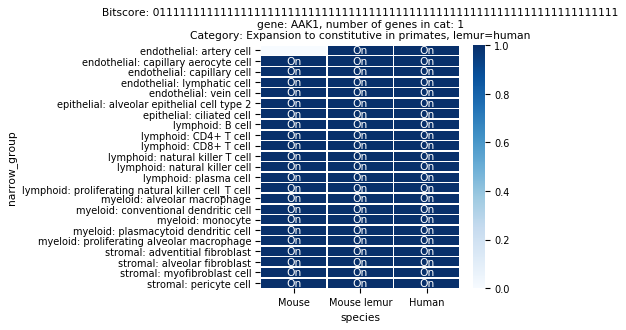

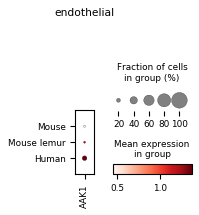


------- group: epithelial -------


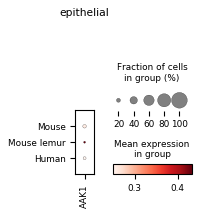


------- group: lymphoid -------


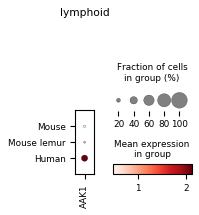


------- group: myeloid -------


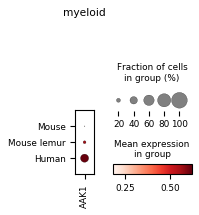


------- group: stromal -------


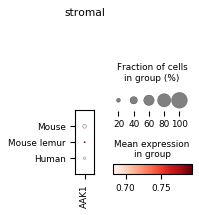

		--- bitscore: 111011011011011011111011011111111011111111011011011011011011011011011 ---
['ZNF652']
gene subset #1

------- group: endothelial -------


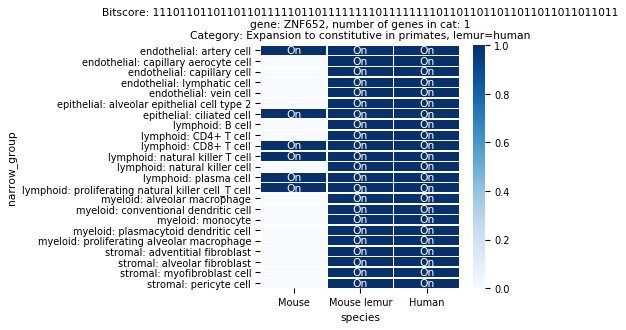

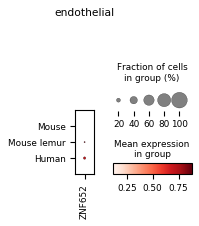


------- group: epithelial -------


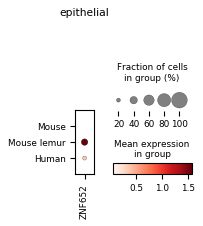


------- group: lymphoid -------


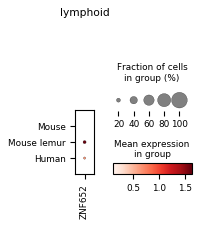


------- group: myeloid -------


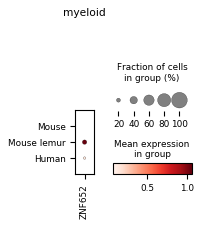


------- group: stromal -------


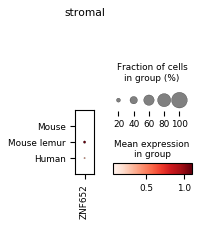

		--- bitscore: 111011011011111111111111111111111111111111111111111111111111111111011 ---
['RPL30']
gene subset #1

------- group: endothelial -------


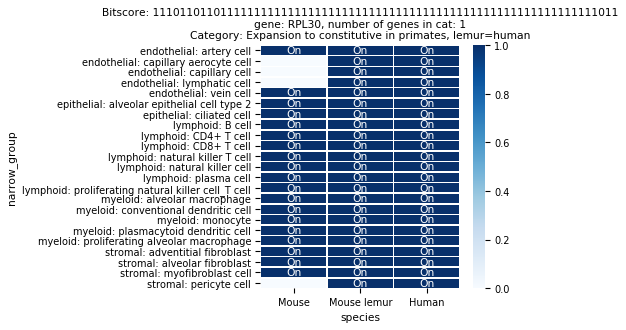

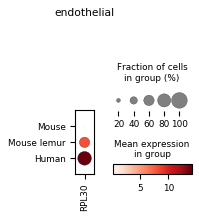


------- group: epithelial -------


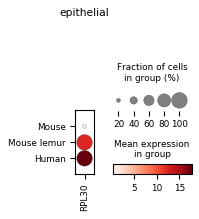


------- group: lymphoid -------


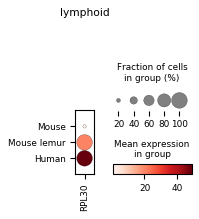


------- group: myeloid -------


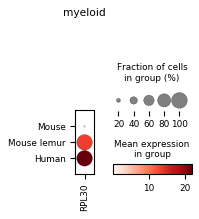


------- group: stromal -------


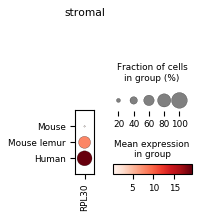

		--- bitscore: 111011011011111111111111111111111111111111111111111111111111111111111 ---
['GSTO1']
gene subset #1

------- group: endothelial -------


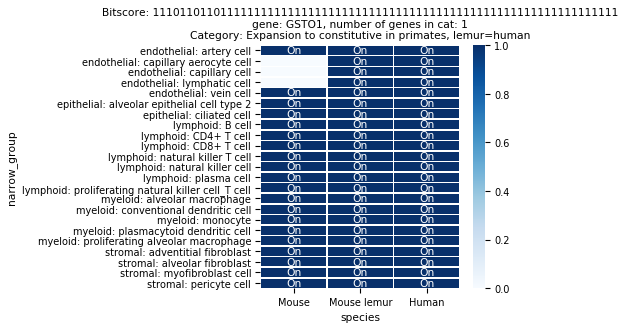

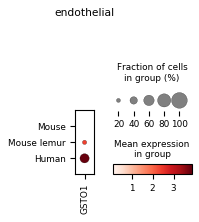


------- group: epithelial -------


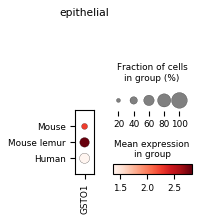


------- group: lymphoid -------


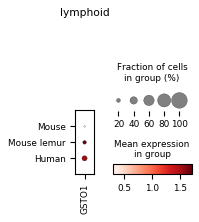


------- group: myeloid -------


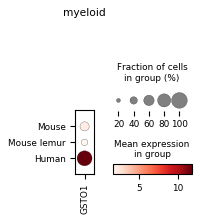


------- group: stromal -------


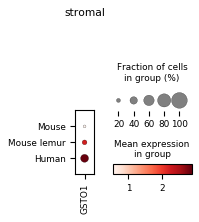

		--- bitscore: 111011011111111011111111111111111111111111111111111111111111111111111 ---
['FKBP5']
gene subset #1

------- group: endothelial -------


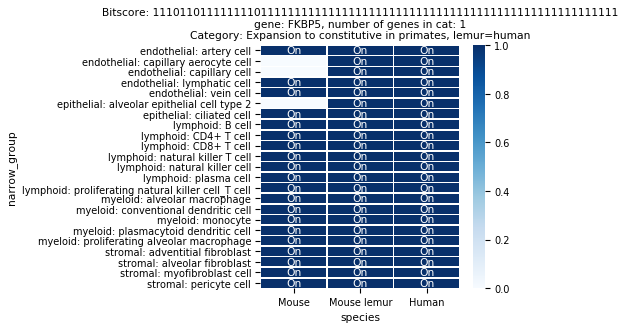

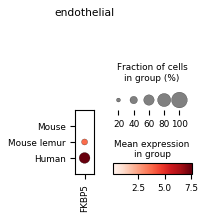


------- group: epithelial -------


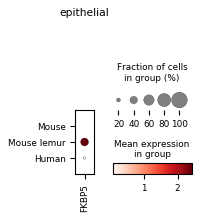


------- group: lymphoid -------


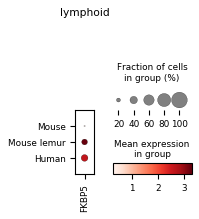


------- group: myeloid -------


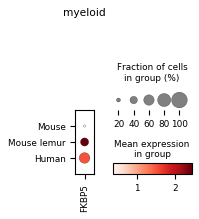


------- group: stromal -------


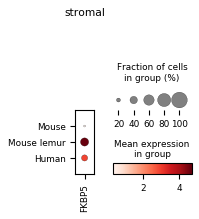

		--- bitscore: 111011011111111111111111111111111111011111111111111111111111111111111 ---
['ANXA1']
gene subset #1

------- group: endothelial -------


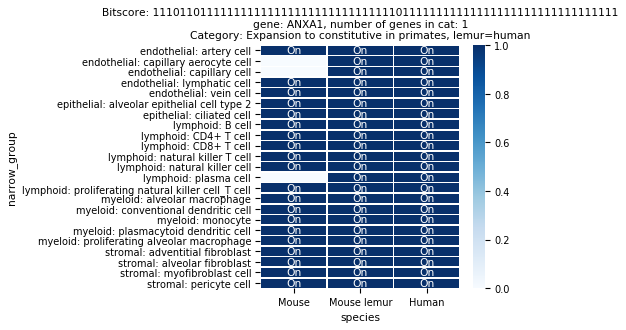

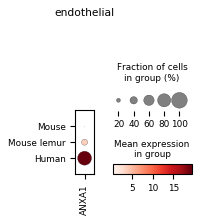


------- group: epithelial -------


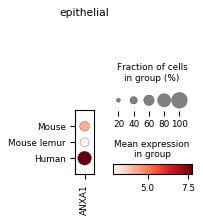


------- group: lymphoid -------


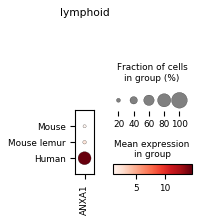


------- group: myeloid -------


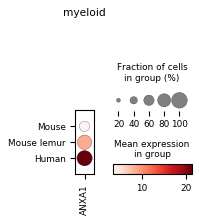


------- group: stromal -------


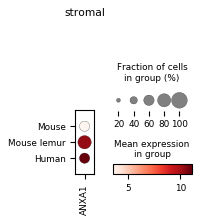

		--- bitscore: 111111011111111111111111011111111111111111111111011111111111111111111 ---
['GNL3L']
gene subset #1

------- group: endothelial -------


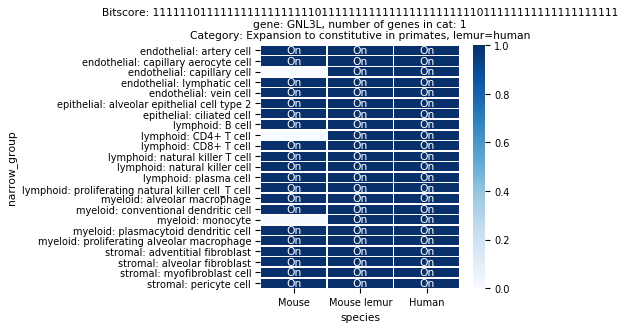

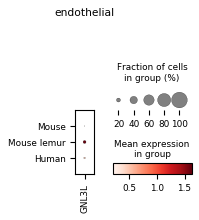


------- group: epithelial -------


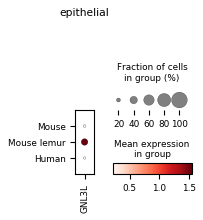


------- group: lymphoid -------


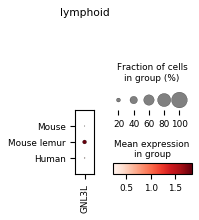


------- group: myeloid -------


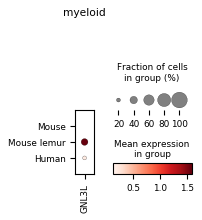


------- group: stromal -------


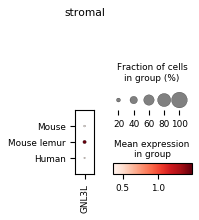

		--- bitscore: 111111111011111111111011011111011011111111111111111111111111111111111 ---
['ABHD13']
gene subset #1

------- group: endothelial -------


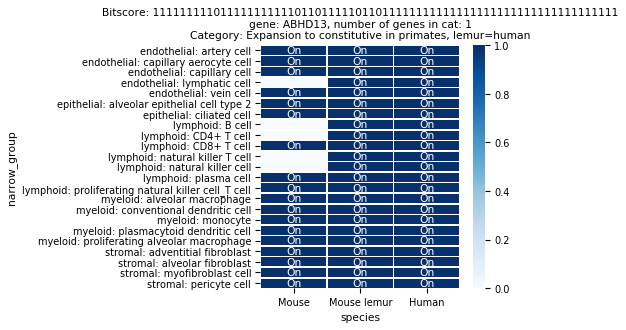

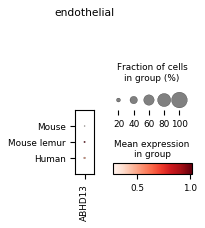


------- group: epithelial -------


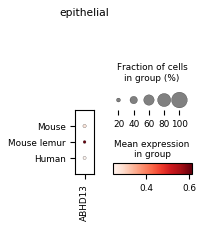


------- group: lymphoid -------


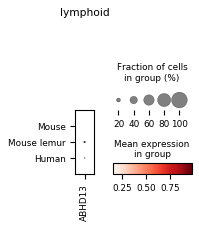


------- group: myeloid -------


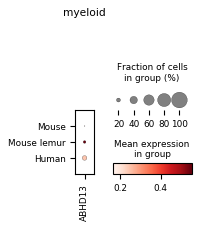


------- group: stromal -------


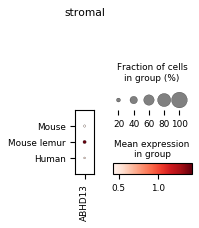

		--- bitscore: 111111111011111111111011111011011011011111011111011111111111111111111 ---
['IP6K2']
gene subset #1

------- group: endothelial -------


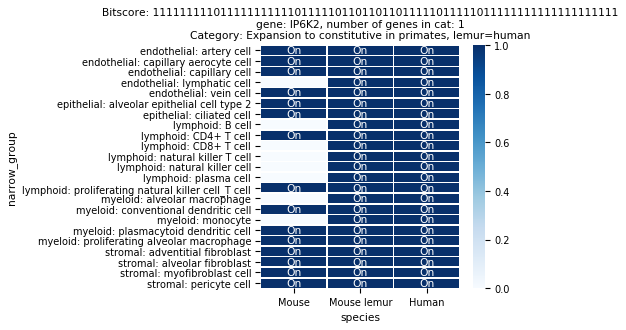

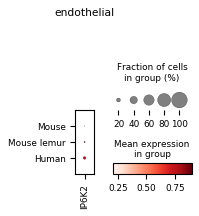


------- group: epithelial -------


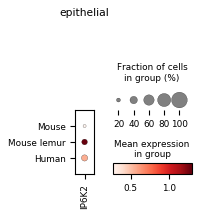


------- group: lymphoid -------


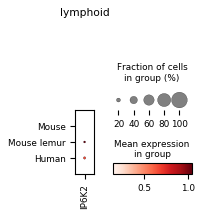


------- group: myeloid -------


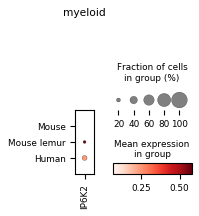


------- group: stromal -------


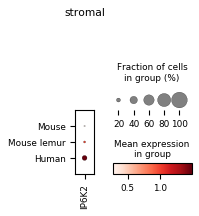

		--- bitscore: 111111111011111111111111011011011011111111011111011111111111111111111 ---
['MRPL47']
gene subset #1

------- group: endothelial -------


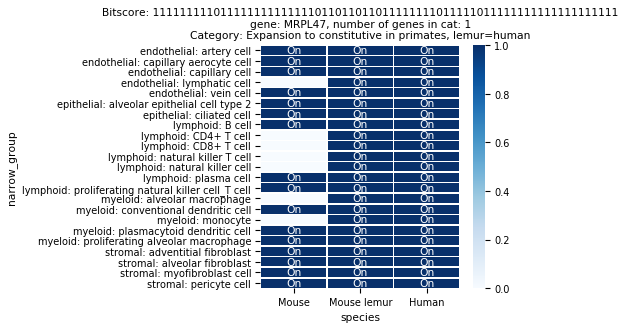

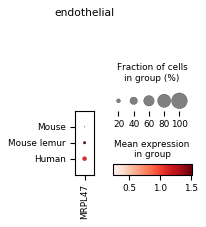


------- group: epithelial -------


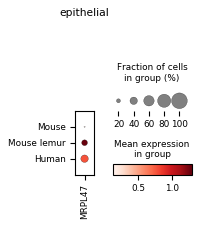


------- group: lymphoid -------


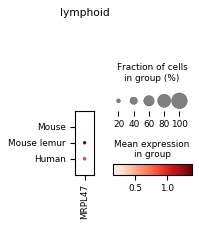


------- group: myeloid -------


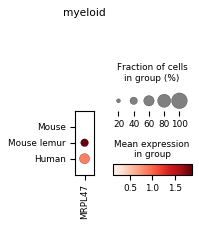


------- group: stromal -------


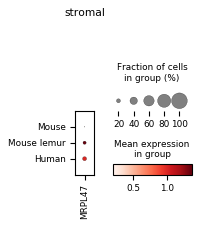

		--- bitscore: 111111111011111111111111011111011111111111111111011111011111111111111 ---
['NDUFS5']
gene subset #1

------- group: endothelial -------


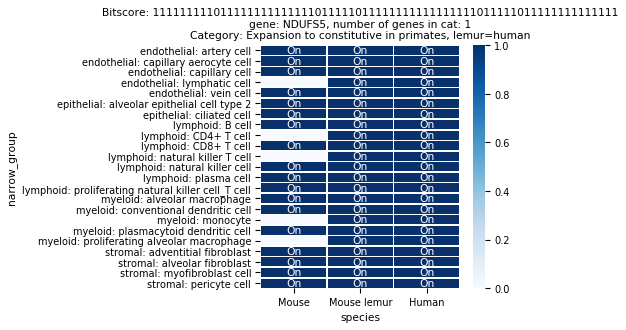

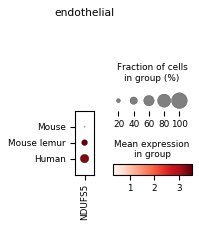


------- group: epithelial -------


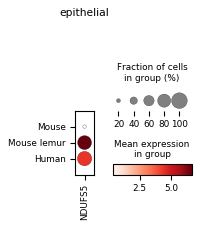


------- group: lymphoid -------


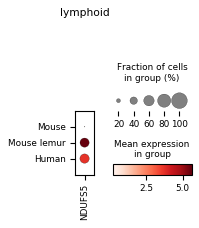


------- group: myeloid -------


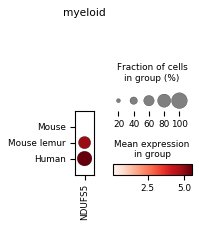


------- group: stromal -------


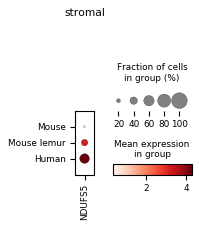

		--- bitscore: 111111111011111111111111011111111111111111111111111111111011111011011 ---
['HNRNPUL1']
gene subset #1

------- group: endothelial -------


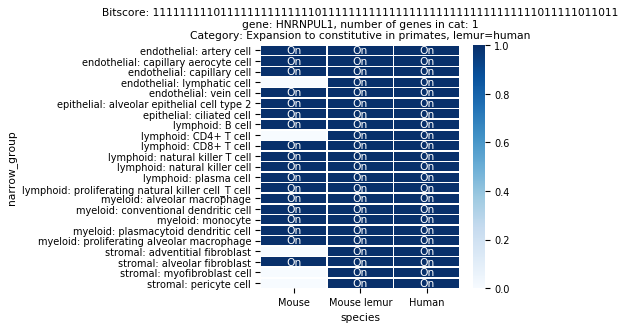

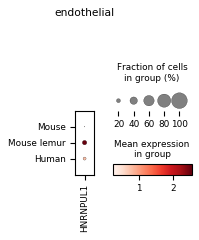


------- group: epithelial -------


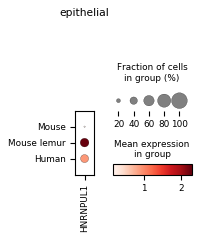


------- group: lymphoid -------


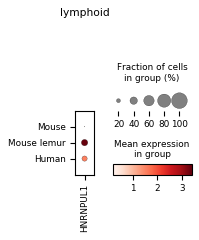


------- group: myeloid -------


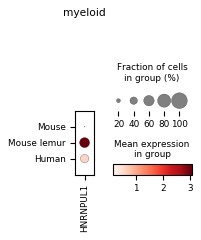


------- group: stromal -------


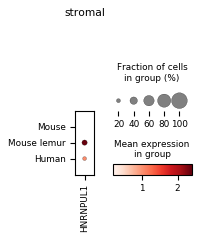

		--- bitscore: 111111111011111111111111111111011111111111111111111111111111111111111 ---
['MTMR14']
gene subset #1

------- group: endothelial -------


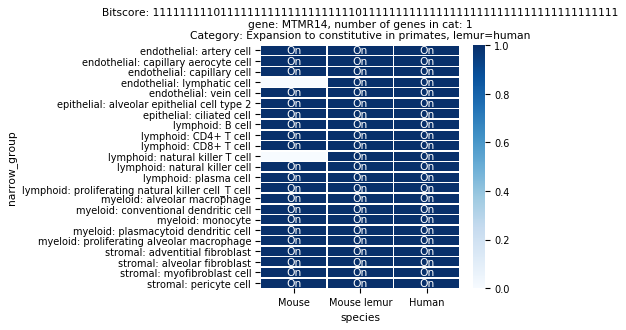

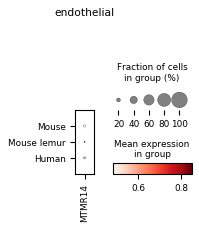


------- group: epithelial -------


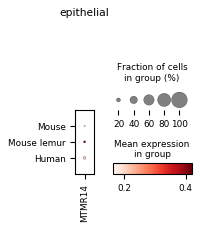


------- group: lymphoid -------


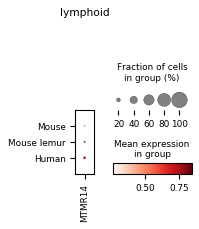


------- group: myeloid -------


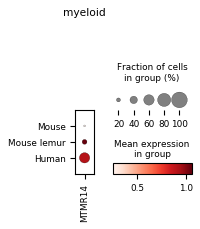


------- group: stromal -------


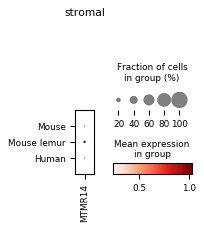

		--- bitscore: 111111111011111111111111111111111111011111111111011111111111111011011 ---
['SCAPER']
gene subset #1

------- group: endothelial -------


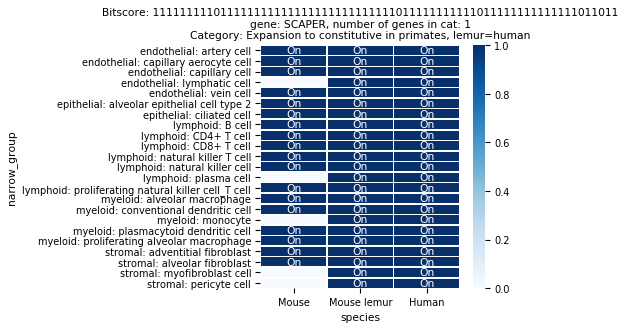

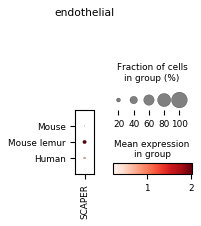


------- group: epithelial -------


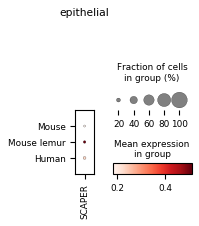


------- group: lymphoid -------


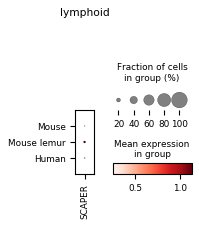


------- group: myeloid -------


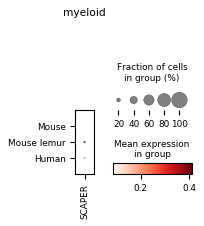


------- group: stromal -------


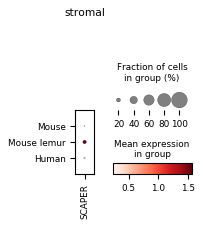

		--- bitscore: 111111111011111111111111111111111111111111111111111111111111111111111 ---
['GOPC' 'MPG']
gene subset #1

------- group: endothelial -------


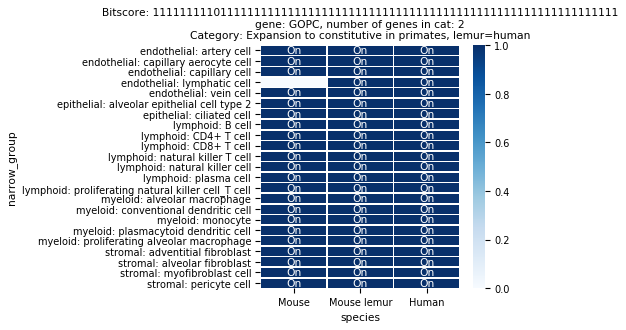

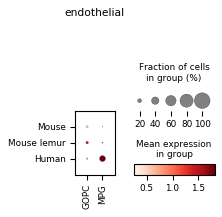


------- group: epithelial -------


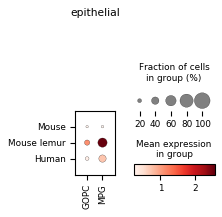


------- group: lymphoid -------


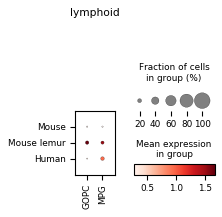


------- group: myeloid -------


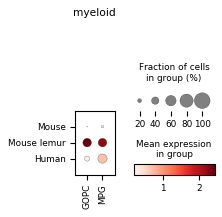


------- group: stromal -------


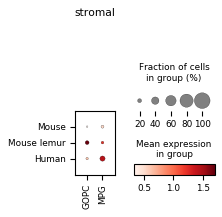

		--- bitscore: 111111111111111011111111011011011111111111111111111111111111111111111 ---
['DUSP22']
gene subset #1

------- group: endothelial -------


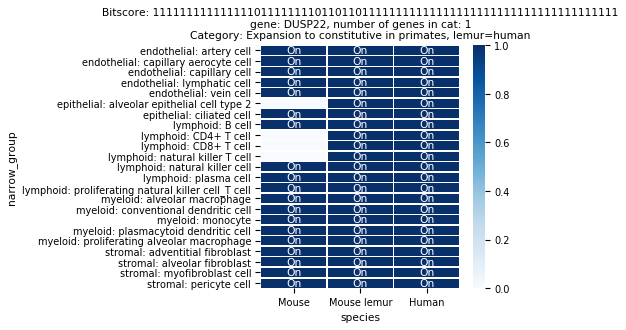

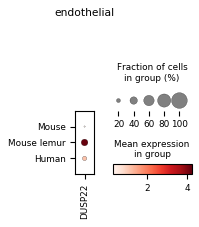


------- group: epithelial -------


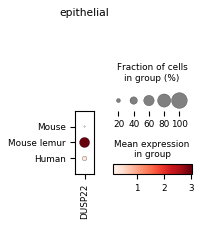


------- group: lymphoid -------


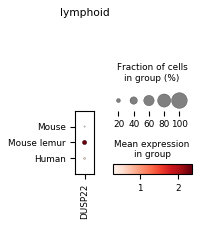


------- group: myeloid -------


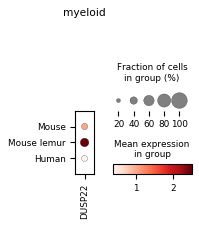


------- group: stromal -------


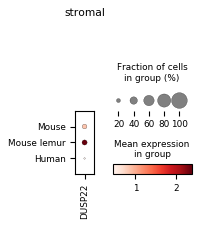

		--- bitscore: 111111111111111011111111111111111111111111011111111111011111011011111 ---
['CCT6A']
gene subset #1

------- group: endothelial -------


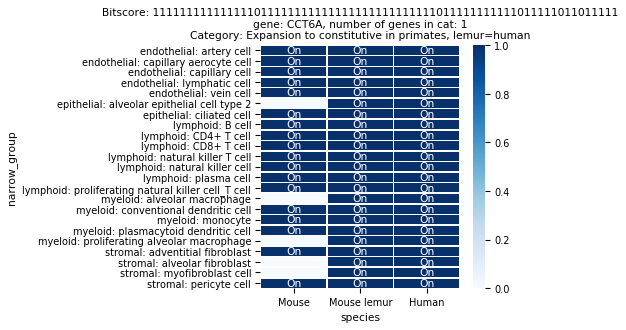

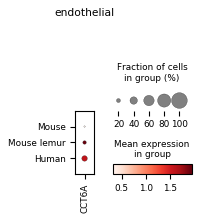


------- group: epithelial -------


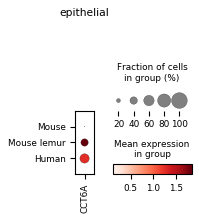


------- group: lymphoid -------


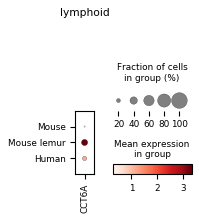


------- group: myeloid -------


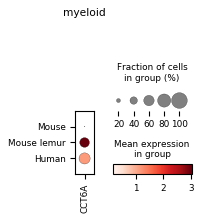


------- group: stromal -------


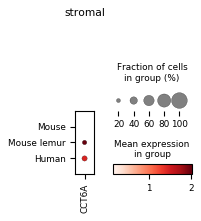

		--- bitscore: 111111111111111011111111111111111111111111011111111111111111111111011 ---
['GGPS1']
gene subset #1

------- group: endothelial -------


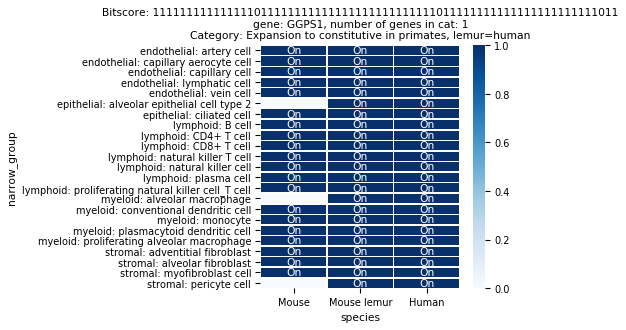

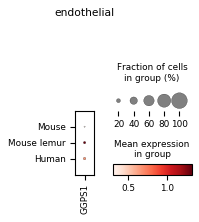


------- group: epithelial -------


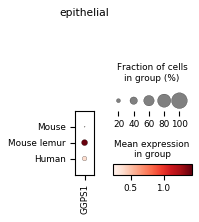


------- group: lymphoid -------


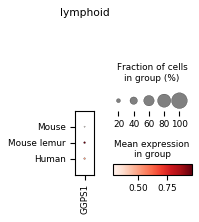


------- group: myeloid -------


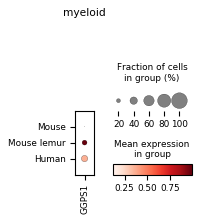


------- group: stromal -------


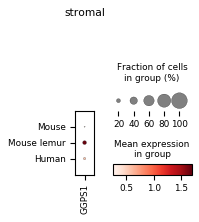

		--- bitscore: 111111111111111011111111111111111111111111111111111111011111111111111 ---
['XRN1']
gene subset #1

------- group: endothelial -------


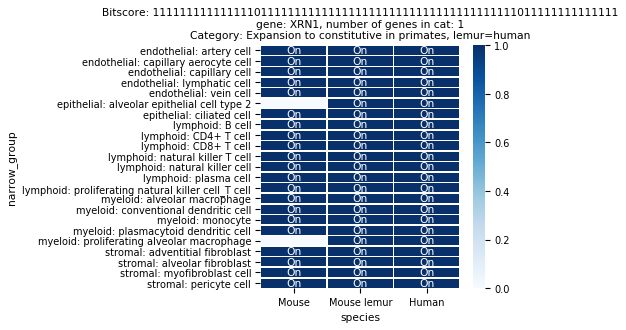

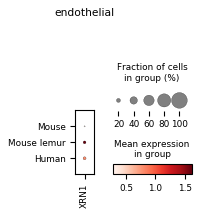


------- group: epithelial -------


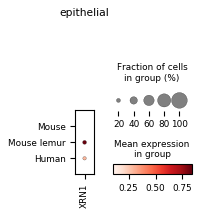


------- group: lymphoid -------


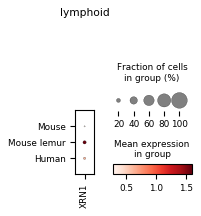


------- group: myeloid -------


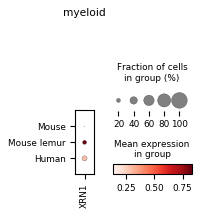


------- group: stromal -------


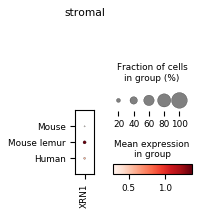

		--- bitscore: 111111111111111111011011011111011011111011111111111111111111111111111 ---
['VPS13C']
gene subset #1

------- group: endothelial -------


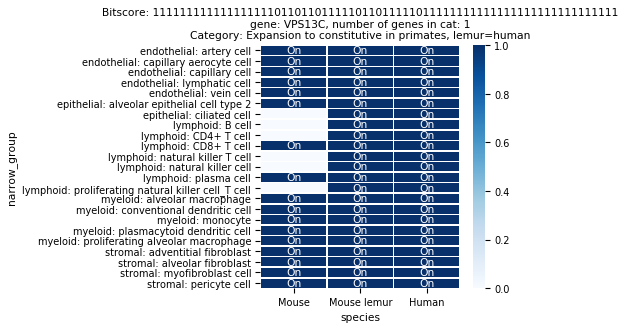

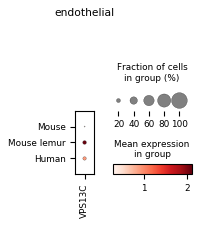


------- group: epithelial -------


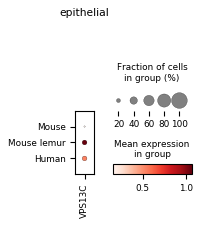


------- group: lymphoid -------


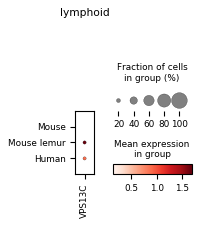


------- group: myeloid -------


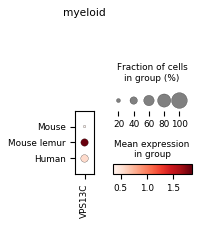


------- group: stromal -------


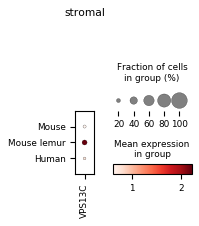

		--- bitscore: 111111111111111111111011011011011011111011111111111111111111111111111 ---
['TMEM205']
gene subset #1

------- group: endothelial -------


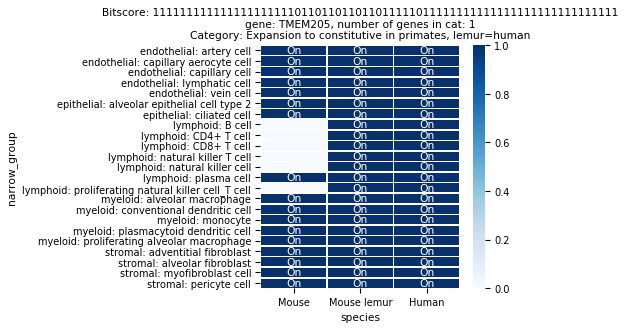

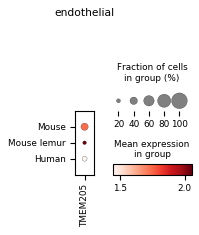


------- group: epithelial -------


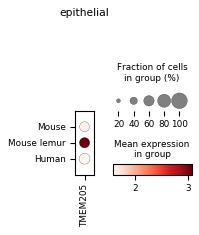


------- group: lymphoid -------


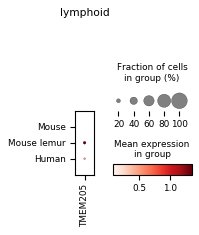


------- group: myeloid -------


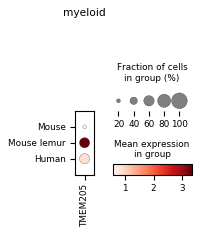


------- group: stromal -------


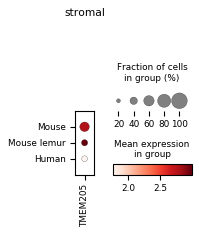

		--- bitscore: 111111111111111111111011011011011111111011111111011011111111111111111 ---
['CD63']
gene subset #1

------- group: endothelial -------


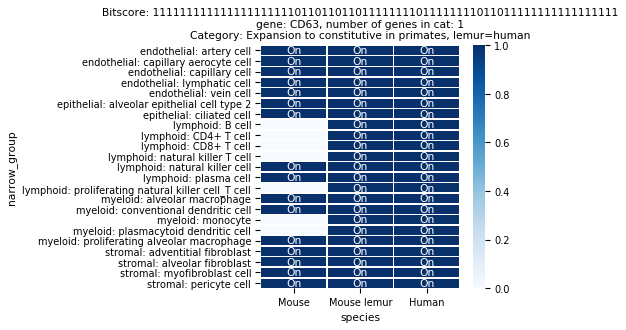

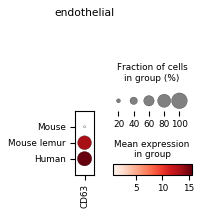


------- group: epithelial -------


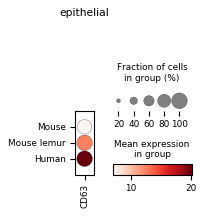


------- group: lymphoid -------


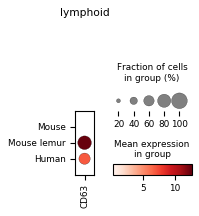


------- group: myeloid -------


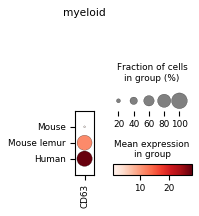


------- group: stromal -------


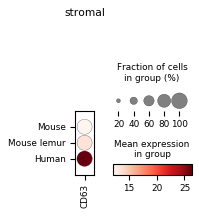

		--- bitscore: 111111111111111111111011111111111111111111111111111111111111111111111 ---
['METTL5']
gene subset #1

------- group: endothelial -------


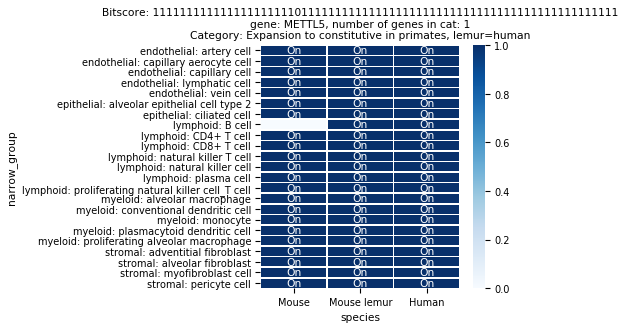

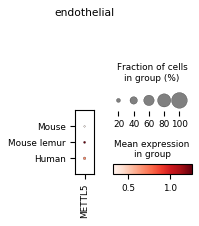


------- group: epithelial -------


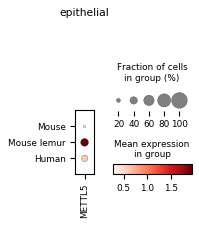


------- group: lymphoid -------


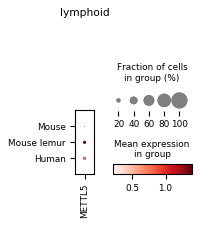


------- group: myeloid -------


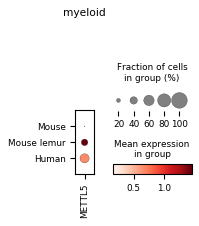


------- group: stromal -------


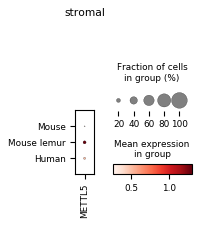

		--- bitscore: 111111111111111111111111011011011011111111111111111111111111111111111 ---
['MGST3' 'TMEM50B']
gene subset #1

------- group: endothelial -------


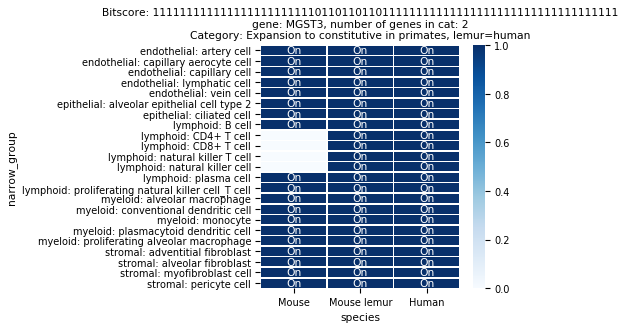

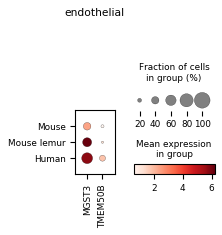


------- group: epithelial -------


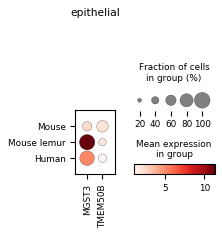


------- group: lymphoid -------


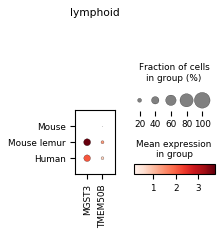


------- group: myeloid -------


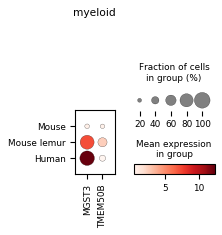


------- group: stromal -------


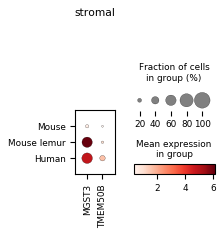

		--- bitscore: 111111111111111111111111011111011111111111111111111111111111111111111 ---
['IARS2']
gene subset #1

------- group: endothelial -------


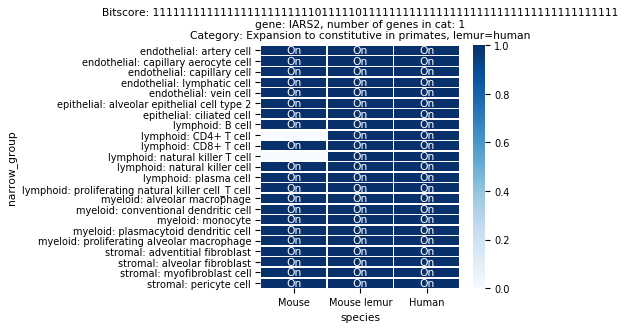

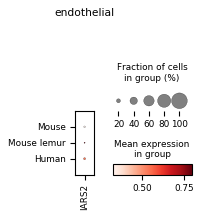


------- group: epithelial -------


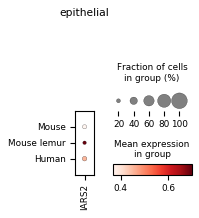


------- group: lymphoid -------


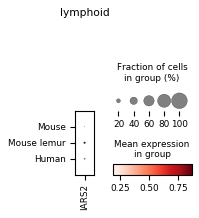


------- group: myeloid -------


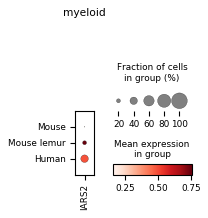


------- group: stromal -------


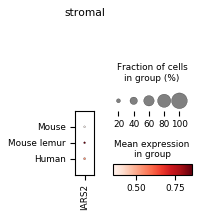

		--- bitscore: 111111111111111111111111011111111111111111111111111111111111111111111 ---
['PAIP1']
gene subset #1

------- group: endothelial -------


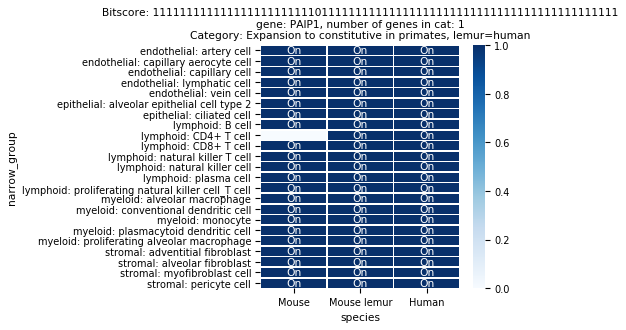

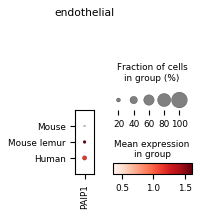


------- group: epithelial -------


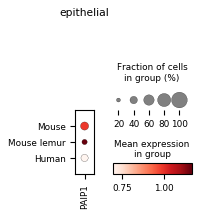


------- group: lymphoid -------


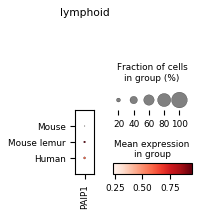


------- group: myeloid -------


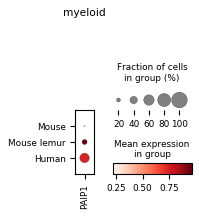


------- group: stromal -------


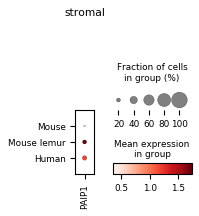

		--- bitscore: 111111111111111111111111111011111111111111111111111111111111111111111 ---
['PLIN2' 'RNF216' 'SEC14L1' 'SREK1IP1']
gene subset #1

------- group: endothelial -------


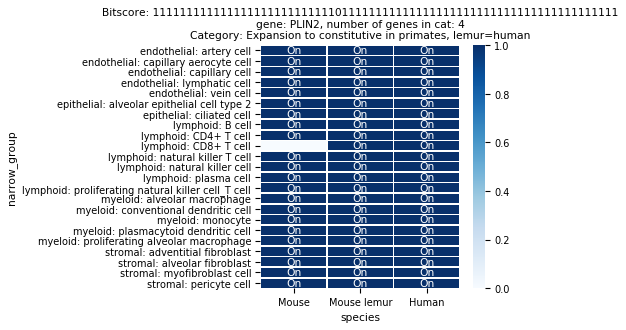

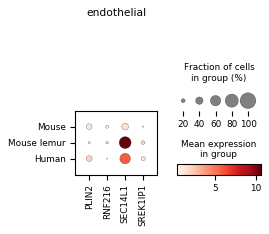


------- group: epithelial -------


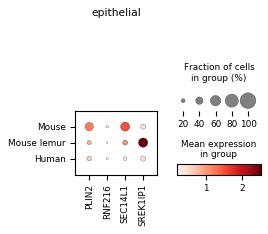


------- group: lymphoid -------


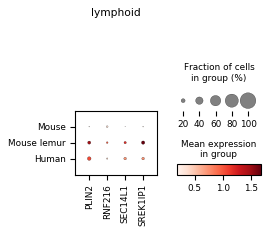


------- group: myeloid -------


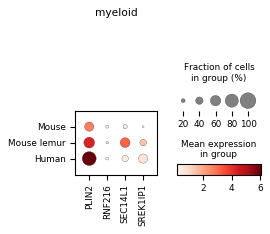


------- group: stromal -------


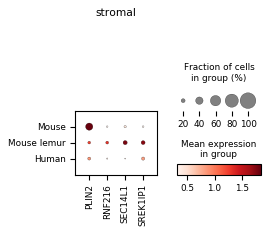

		--- bitscore: 111111111111111111111111111111011011111111111111111111111111111111111 ---
['PRDX4']
gene subset #1

------- group: endothelial -------


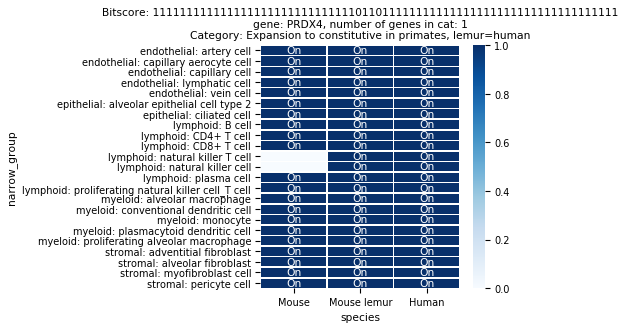

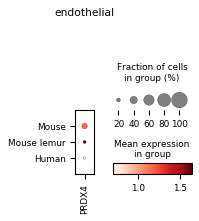


------- group: epithelial -------


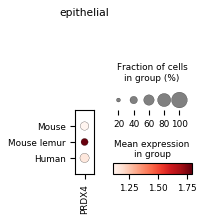


------- group: lymphoid -------


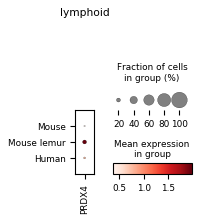


------- group: myeloid -------


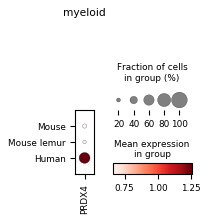


------- group: stromal -------


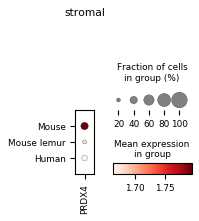

		--- bitscore: 111111111111111111111111111111011111111011011111011111011111111111111 ---
['ZBTB20']
gene subset #1

------- group: endothelial -------


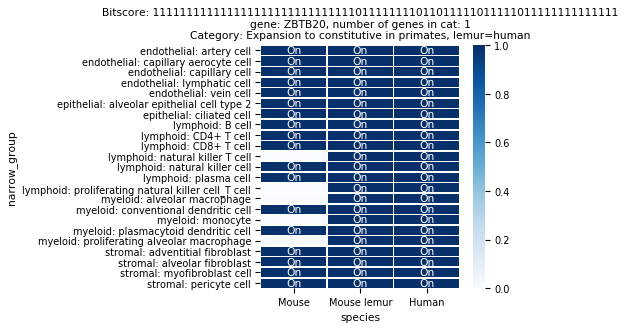

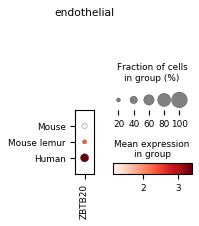


------- group: epithelial -------


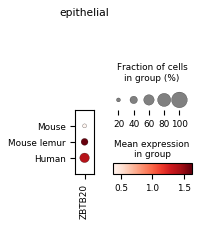


------- group: lymphoid -------


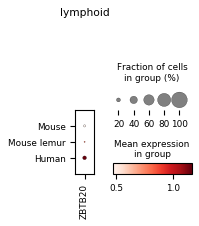


------- group: myeloid -------


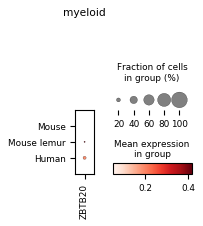


------- group: stromal -------


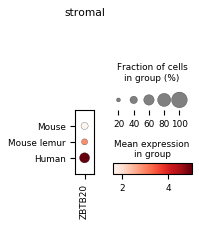

		--- bitscore: 111111111111111111111111111111111111111011111111111111111111111111111 ---
['CCNC' 'CWF19L2' 'TOR3A']
gene subset #1

------- group: endothelial -------


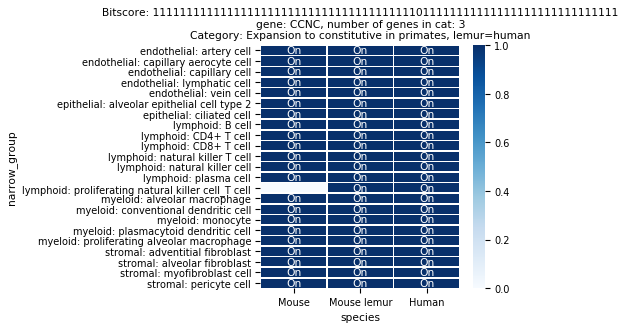

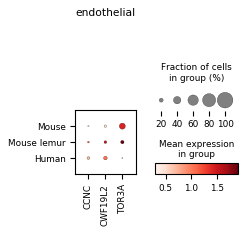


------- group: epithelial -------


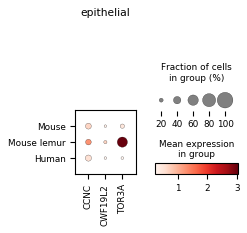


------- group: lymphoid -------


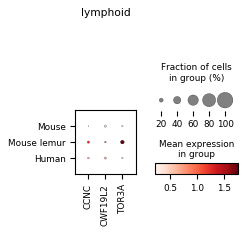


------- group: myeloid -------


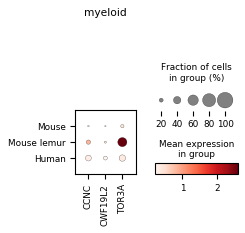


------- group: stromal -------


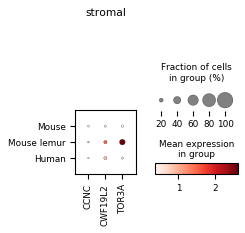

		--- bitscore: 111111111111111111111111111111111111111111111111011111111111111111111 ---
['CREBZF']
gene subset #1

------- group: endothelial -------


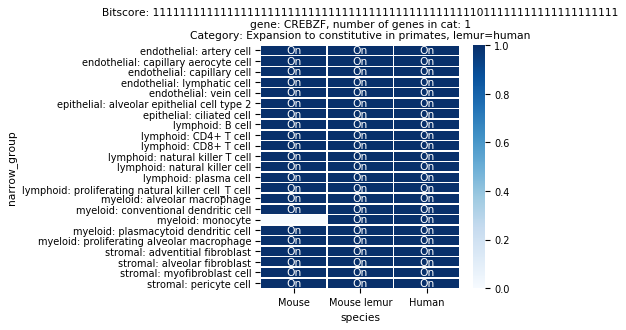

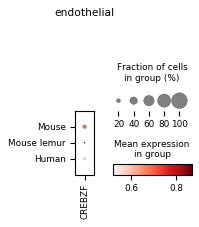


------- group: epithelial -------


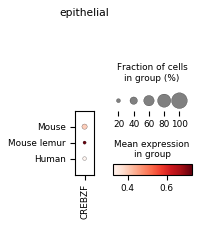


------- group: lymphoid -------


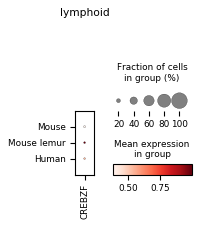


------- group: myeloid -------


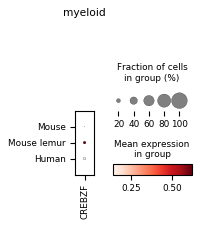


------- group: stromal -------


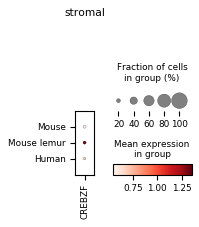

		--- bitscore: 111111111111111111111111111111111111111111111111111111111111111011111 ---
['ARIH2' 'EML3']
gene subset #1

------- group: endothelial -------


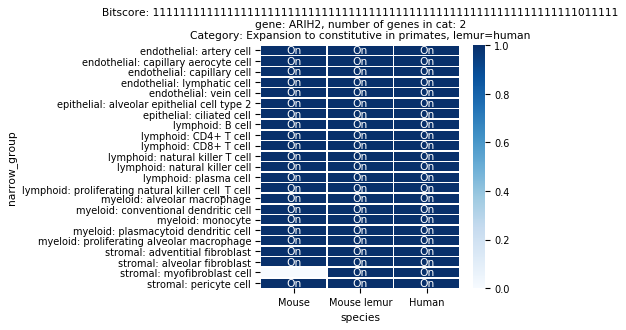

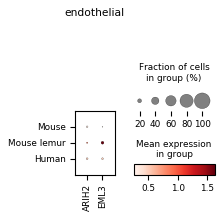


------- group: epithelial -------


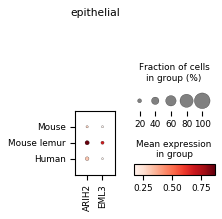


------- group: lymphoid -------


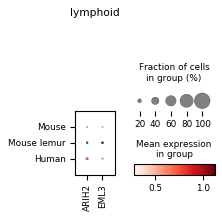


------- group: myeloid -------


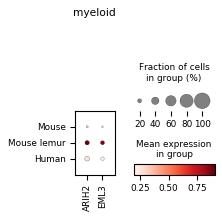


------- group: stromal -------


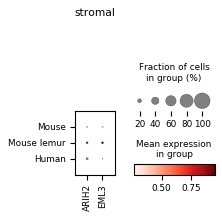

		--- bitscore: 111111111111111111111111111111111111111111111111111111111111111111011 ---
['CEP350']
gene subset #1

------- group: endothelial -------


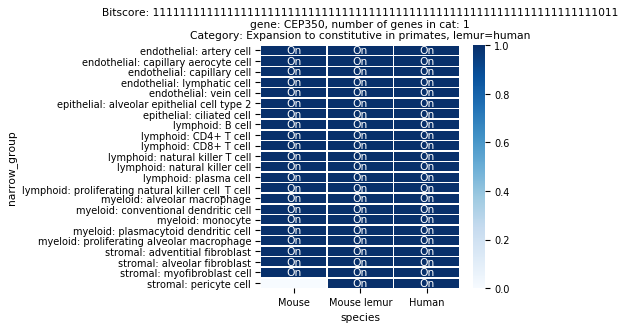

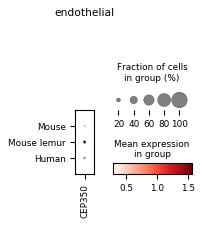


------- group: epithelial -------


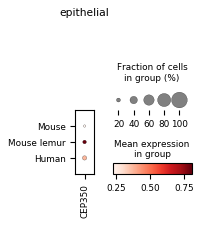


------- group: lymphoid -------


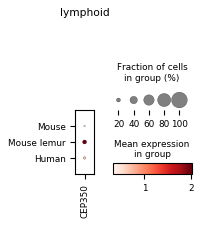


------- group: myeloid -------


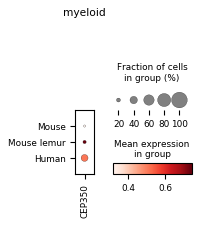


------- group: stromal -------


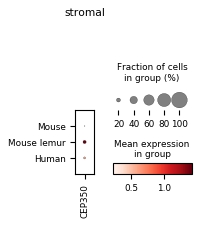

--- gene_category: Mouse-specific, celltype-specific, lemur=human ---
	--- tissue: blood ---
		--- bitscore: 000000000000000100 ---
['C1QTNF6' 'GP1BB' 'INSL6' 'KCNIP3' 'MAG' 'QRFP' 'ZFPM1']
gene subset #1

------- group: lymphoid -------


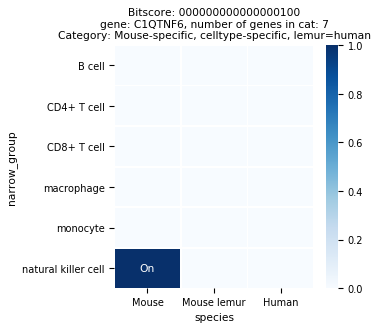

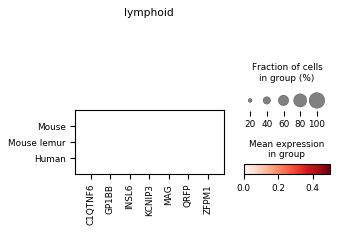


------- group: myeloid -------


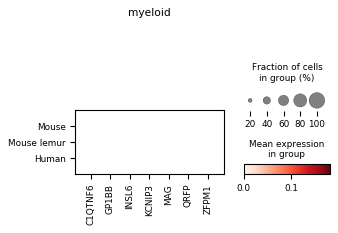

		--- bitscore: 000000000000100000 ---
['LMO1' 'RPL3L']
gene subset #1

------- group: lymphoid -------


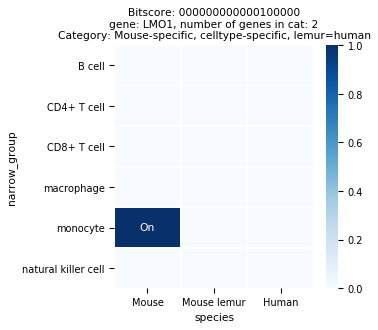

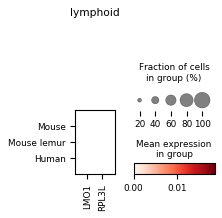


------- group: myeloid -------


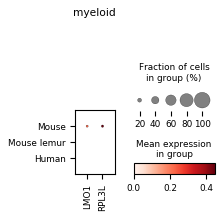

		--- bitscore: 000000000100000000 ---
['ACAD11' 'AGMO' 'ANKRD24' 'CXCL13' 'EXOC6B' 'F7' 'FAM78B' 'GARNL3'
 'LRIG2' 'LYSMD1' 'NUDT17' 'PCBP3' 'SAMD10' 'SLC24A5' 'SYP' 'ZBTB12'
 'ZNF436' 'ZNF777']
gene subset #1

------- group: lymphoid -------


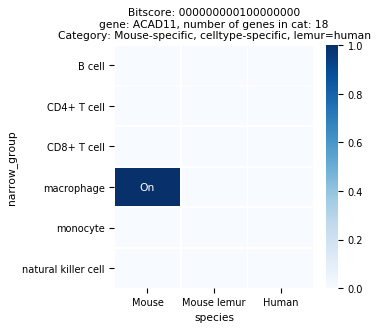

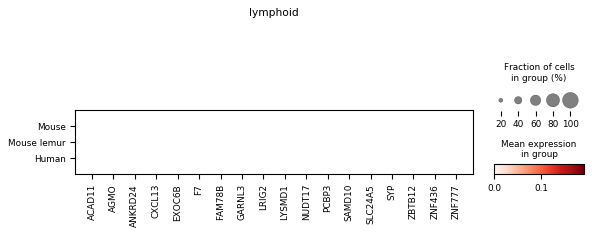


------- group: myeloid -------


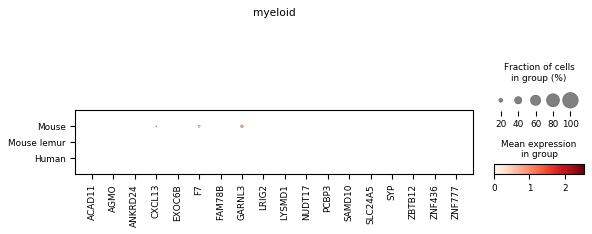

		--- bitscore: 000000000100100000 ---
['ABCD2' 'CACNA1F' 'DAND5' 'GALNT9' 'GDA' 'NEURL2' 'PPFIA4' 'PRTN3' 'TNS4']
gene subset #1

------- group: lymphoid -------


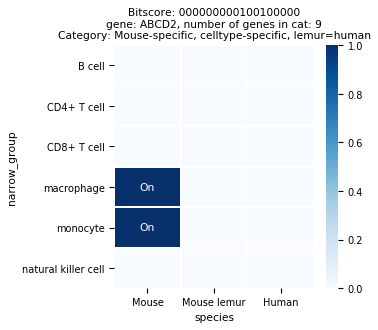

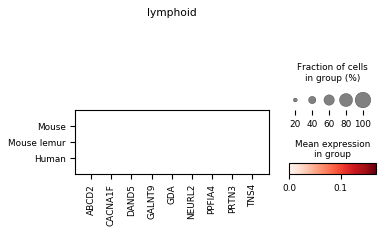


------- group: myeloid -------


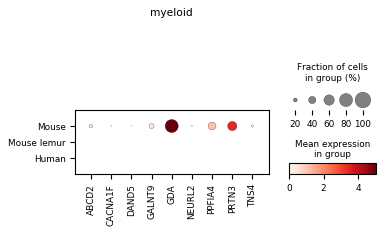

		--- bitscore: 000000000100100100 ---
['XDH']
gene subset #1

------- group: lymphoid -------


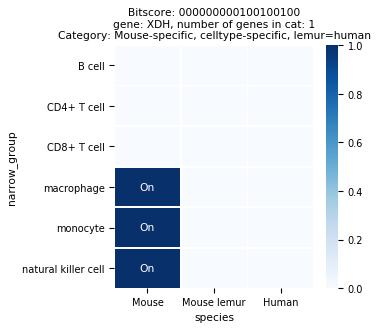

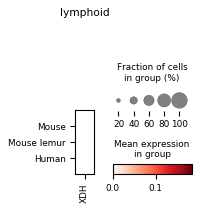


------- group: myeloid -------


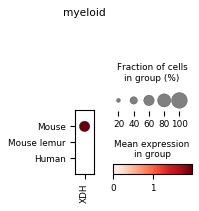

		--- bitscore: 000000100000000000 ---
['BEND4' 'UNC5CL']
gene subset #1

------- group: lymphoid -------


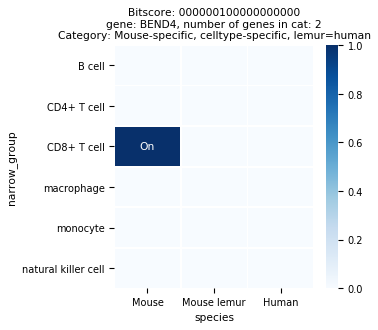

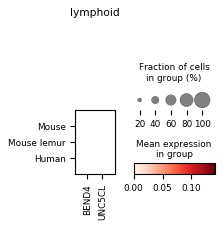


------- group: myeloid -------


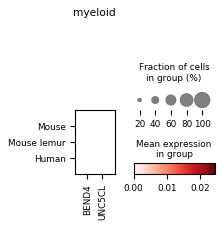

		--- bitscore: 000000100100100100 ---
['RAB19']
gene subset #1

------- group: lymphoid -------


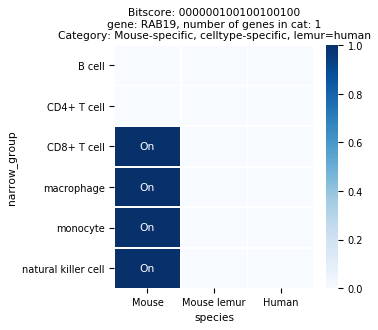

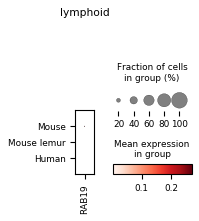


------- group: myeloid -------


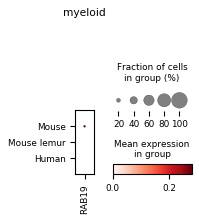

		--- bitscore: 000100000000000000 ---
['SDCBP2']
gene subset #1

------- group: lymphoid -------


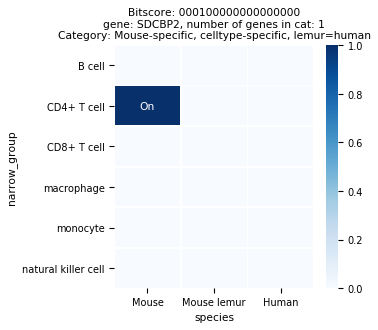

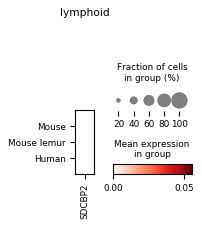


------- group: myeloid -------


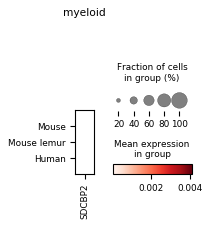

		--- bitscore: 000100100100000000 ---
['BTBD19' 'KLK8']
gene subset #1

------- group: lymphoid -------


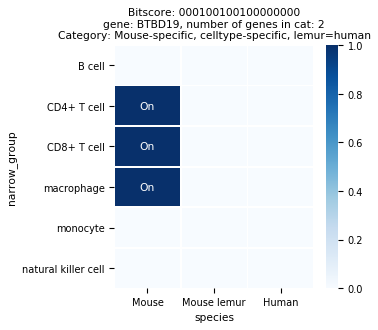

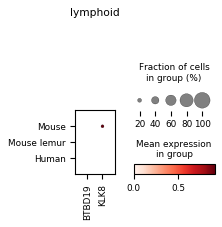


------- group: myeloid -------


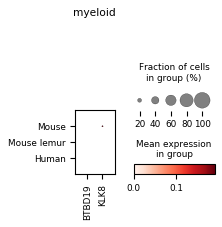

		--- bitscore: 100000000000000000 ---
['CACNA1I' 'CACNA1S' 'CNR2' 'DIRAS2' 'IL12A' 'ZNF831']
gene subset #1

------- group: lymphoid -------


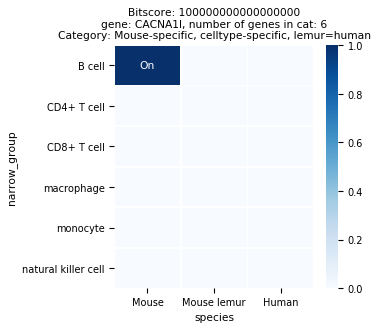

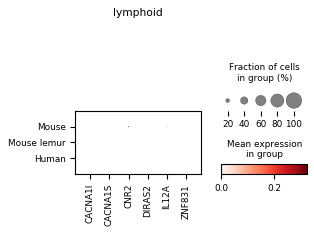


------- group: myeloid -------


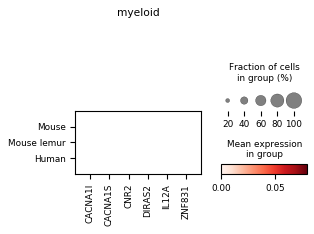

		--- bitscore: 100000000100100000 ---
['APOBEC1']
gene subset #1

------- group: lymphoid -------


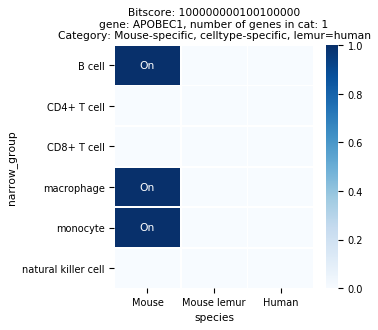

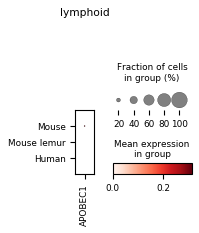


------- group: myeloid -------


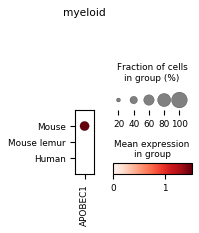

		--- bitscore: 100000100000100000 ---
['DFFB']
gene subset #1

------- group: lymphoid -------


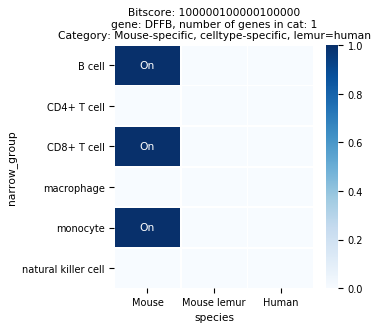

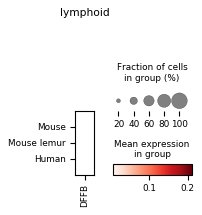


------- group: myeloid -------


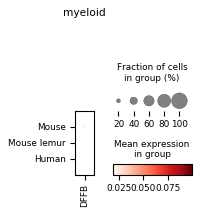

		--- bitscore: 100000100100000000 ---
['MTCP1']
gene subset #1

------- group: lymphoid -------


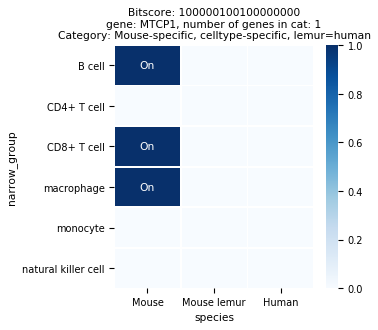

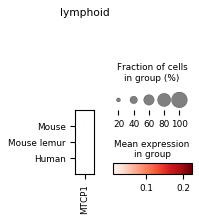


------- group: myeloid -------


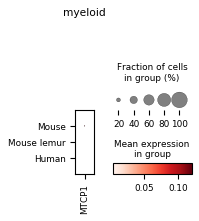

		--- bitscore: 100000100100100100 ---
['AS3MT']
gene subset #1

------- group: lymphoid -------


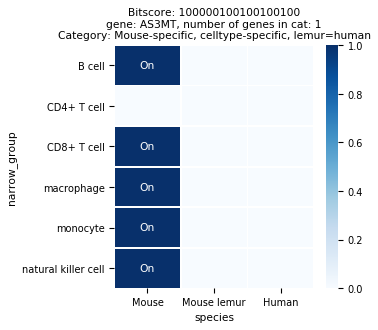

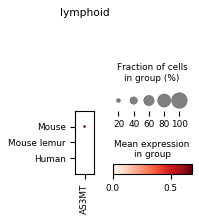


------- group: myeloid -------


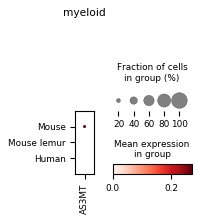

		--- bitscore: 100100100000000000 ---
['FAM169B']
gene subset #1

------- group: lymphoid -------


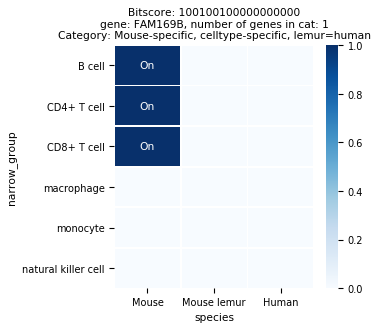

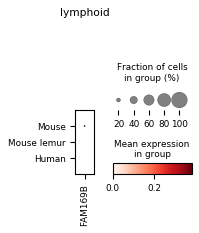


------- group: myeloid -------


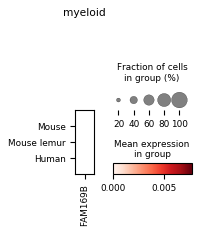

	--- tissue: lung ---
		--- bitscore: 000000000000000000000000000000000000000000000000000000000000000000100 ---
['CXCL13' 'SYP']
gene subset #1

------- group: endothelial -------


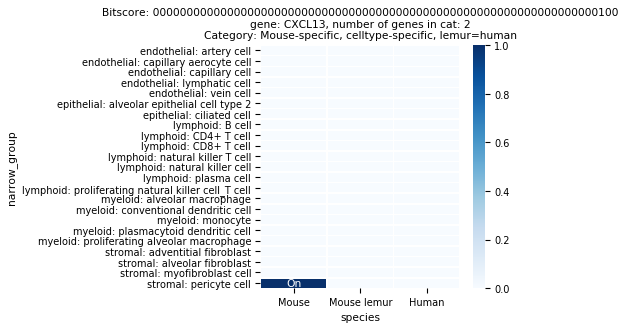

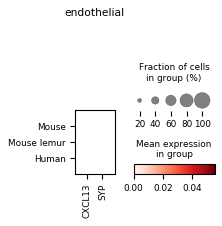


------- group: epithelial -------


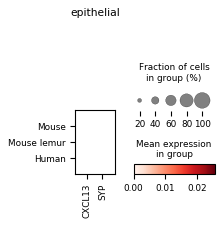


------- group: lymphoid -------


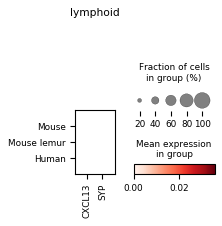


------- group: myeloid -------


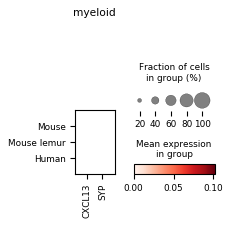


------- group: stromal -------


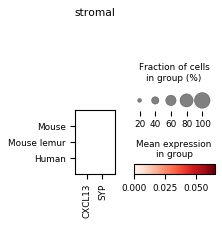

		--- bitscore: 000000000000000000000000000000000000000000000000000000100000000000000 ---
['CACNA1F']
gene subset #1

------- group: endothelial -------


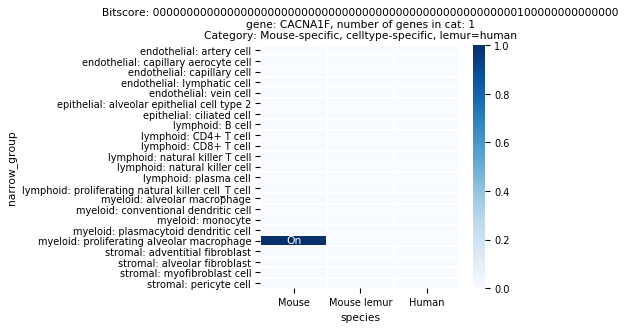

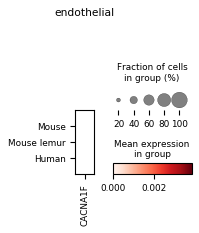


------- group: epithelial -------


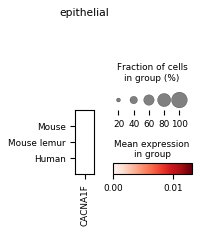


------- group: lymphoid -------


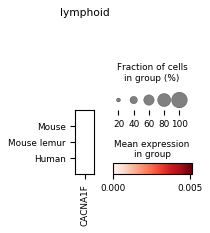


------- group: myeloid -------


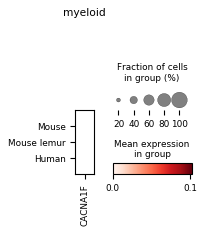


------- group: stromal -------


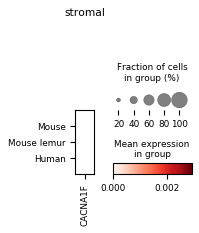

		--- bitscore: 000000000000000000000000000000000000000000000100100000000000000000000 ---
['TNS4']
gene subset #1

------- group: endothelial -------


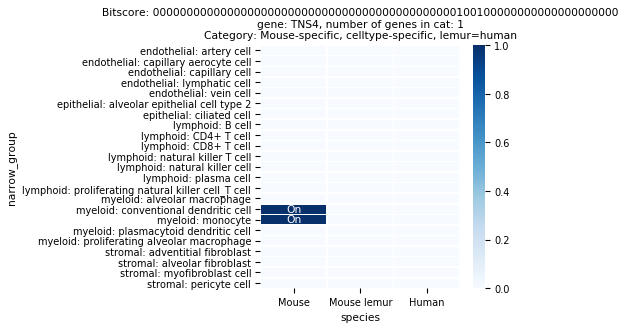

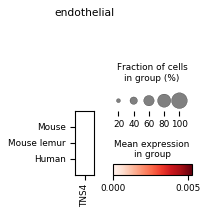


------- group: epithelial -------


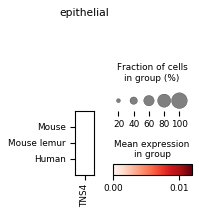


------- group: lymphoid -------


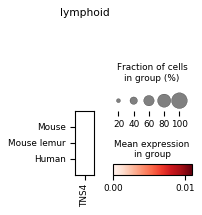


------- group: myeloid -------


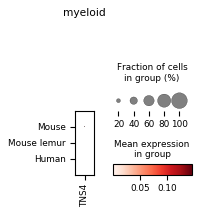


------- group: stromal -------


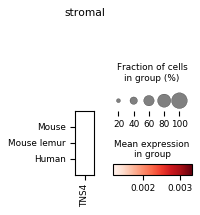

		--- bitscore: 000000000000000000000000000000000000000000000100100000000000100000000 ---
['PRTN3']
gene subset #1

------- group: endothelial -------


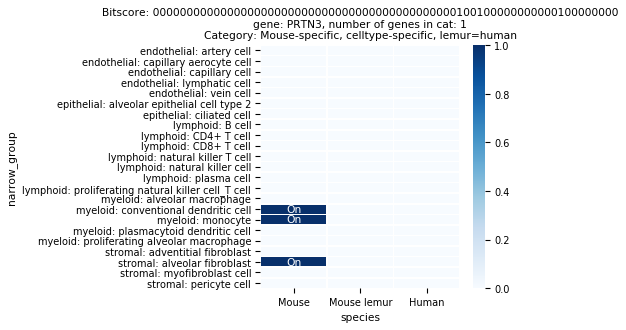

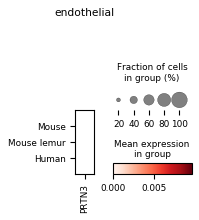


------- group: epithelial -------


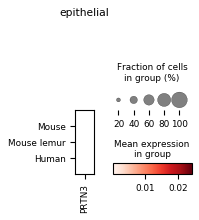


------- group: lymphoid -------


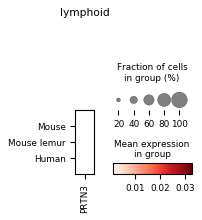


------- group: myeloid -------


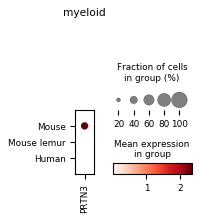


------- group: stromal -------


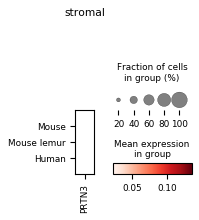

		--- bitscore: 000000000000000000000000000000000000000000100000100000100000000000000 ---
['RPL3L']
gene subset #1

------- group: endothelial -------


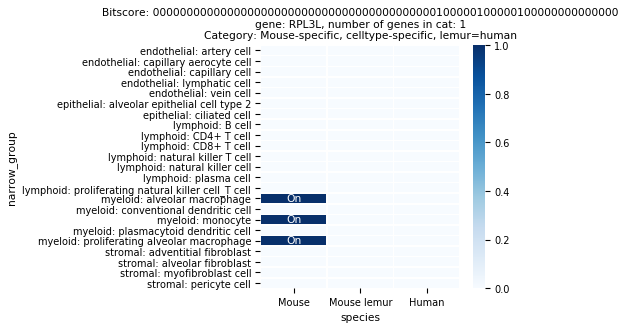

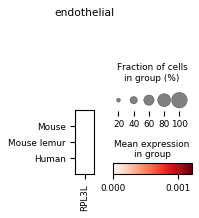


------- group: epithelial -------


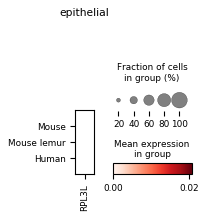


------- group: lymphoid -------


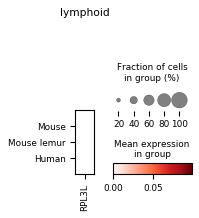


------- group: myeloid -------


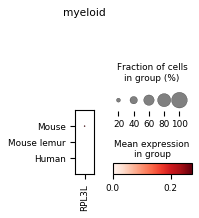


------- group: stromal -------


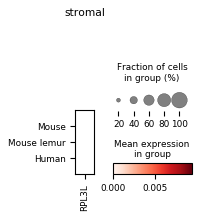

		--- bitscore: 000000000000000000000000000000000000000000100000100000100000100100000 ---
['ABCD2']
gene subset #1

------- group: endothelial -------


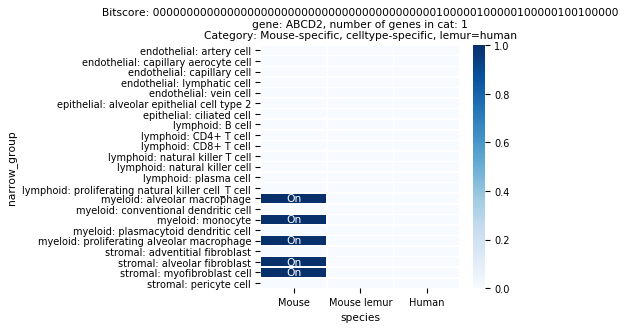

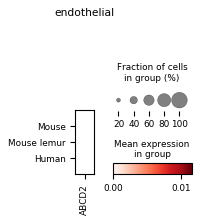


------- group: epithelial -------


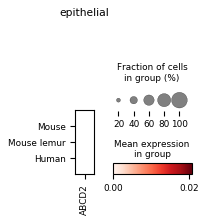


------- group: lymphoid -------


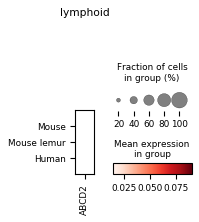


------- group: myeloid -------


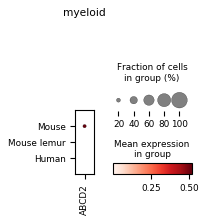


------- group: stromal -------


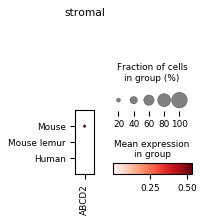

		--- bitscore: 000000000000000000000000000000000000000000100100100100100000000000100 ---
['PPFIA4']
gene subset #1

------- group: endothelial -------


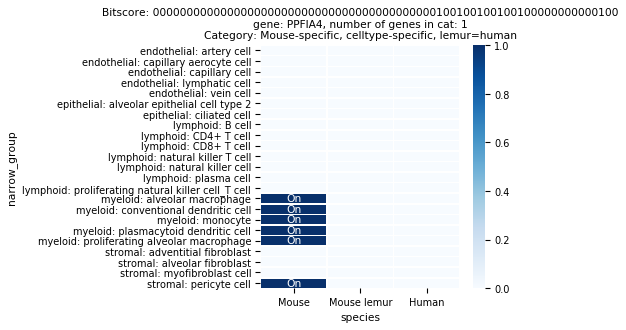

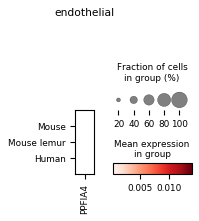


------- group: epithelial -------


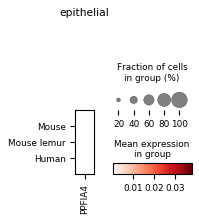


------- group: lymphoid -------


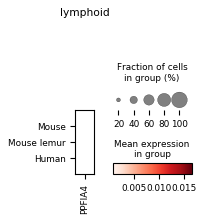


------- group: myeloid -------


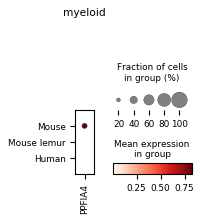


------- group: stromal -------


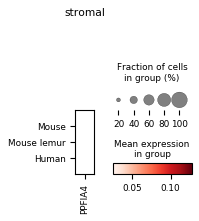

		--- bitscore: 000000000000000000000000000000000000100000000000000000000000000000100 ---
['LYSMD1']
gene subset #1

------- group: endothelial -------


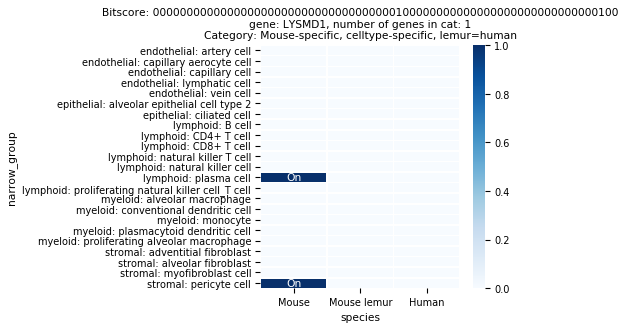

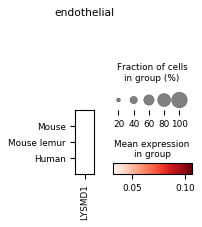


------- group: epithelial -------


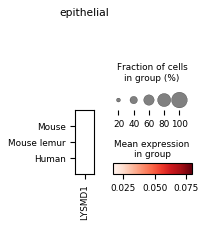


------- group: lymphoid -------


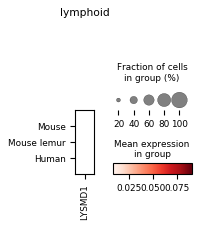


------- group: myeloid -------


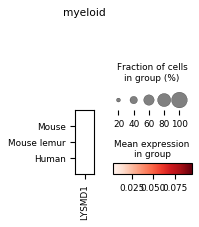


------- group: stromal -------


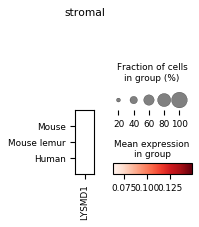

		--- bitscore: 000000000000000000000000000000000100000100000000000000000000000000000 ---
['GP1BB']
gene subset #1

------- group: endothelial -------


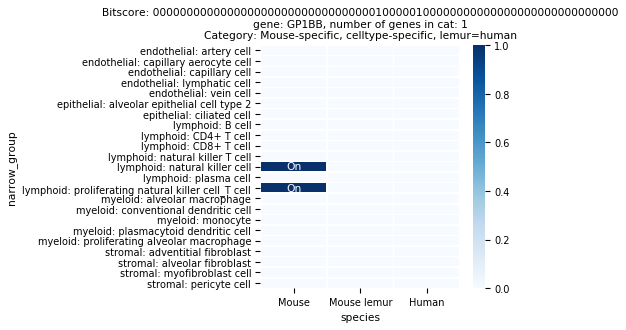

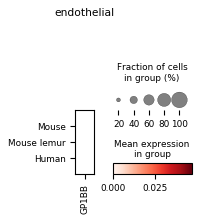


------- group: epithelial -------


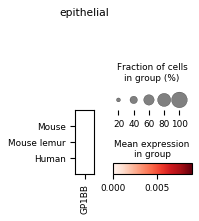


------- group: lymphoid -------


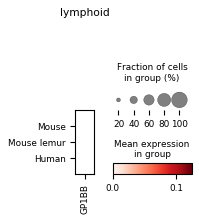


------- group: myeloid -------


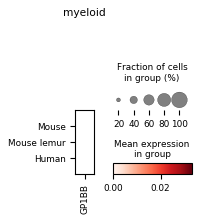


------- group: stromal -------


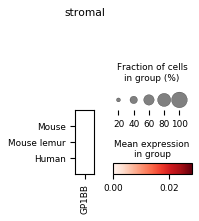

		--- bitscore: 000000000000000000000000000000000100000100000100000000000000000000100 ---
['KCNIP3']
gene subset #1

------- group: endothelial -------


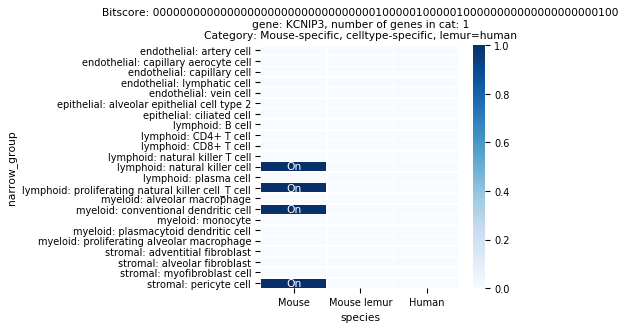

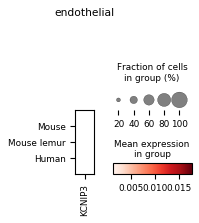


------- group: epithelial -------


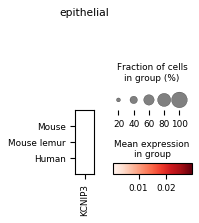


------- group: lymphoid -------


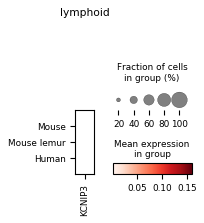


------- group: myeloid -------


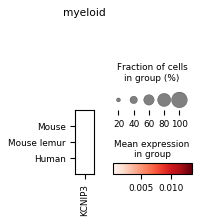


------- group: stromal -------


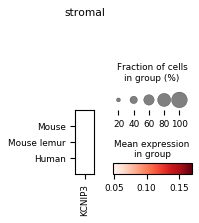

		--- bitscore: 000000000000000000000000000000000100000100100000000000100000000000000 ---
['MAG']
gene subset #1

------- group: endothelial -------


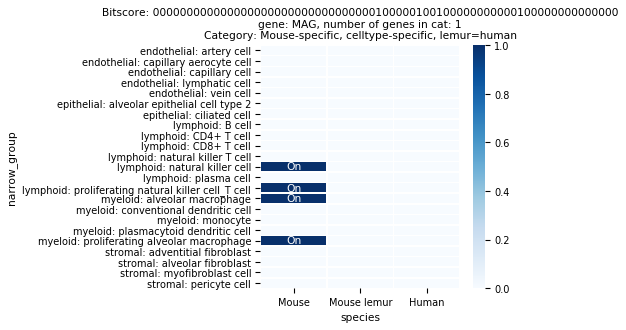

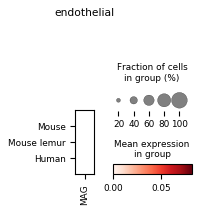


------- group: epithelial -------


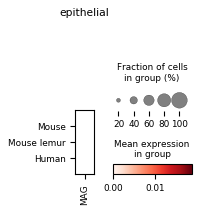


------- group: lymphoid -------


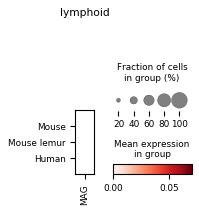


------- group: myeloid -------


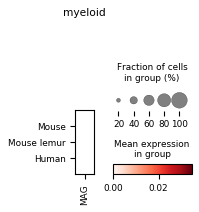


------- group: stromal -------


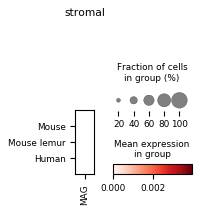

		--- bitscore: 000000000000000000000000000100000000000000000100000100000000000000000 ---
['BEND4']
gene subset #1

------- group: endothelial -------


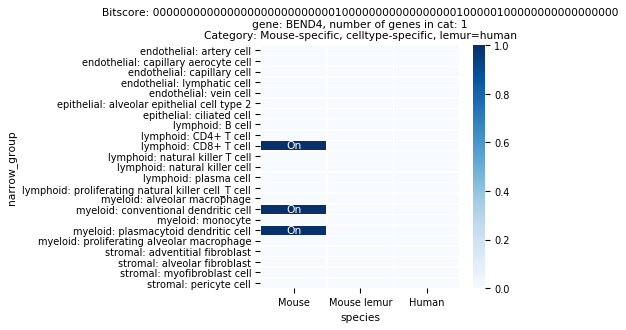

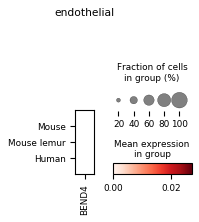


------- group: epithelial -------


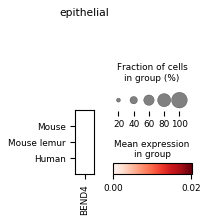


------- group: lymphoid -------


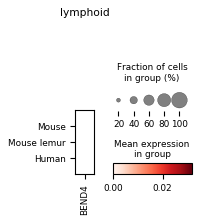


------- group: myeloid -------


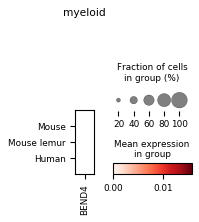


------- group: stromal -------


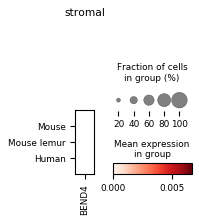

		--- bitscore: 000000000000000000000000000100000100000100000000000000000000000000000 ---
['QRFP']
gene subset #1

------- group: endothelial -------


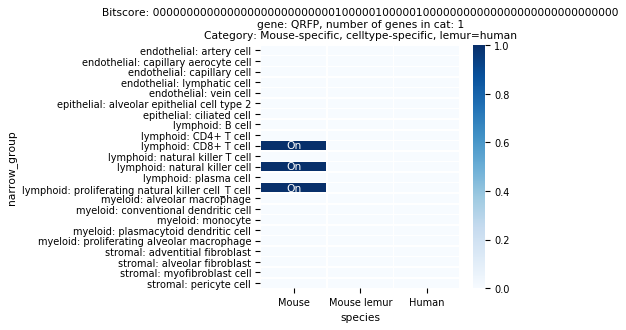

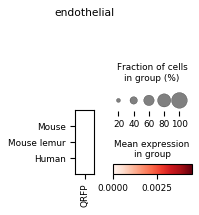


------- group: epithelial -------


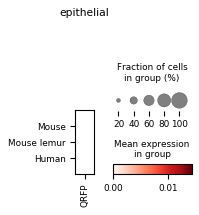


------- group: lymphoid -------


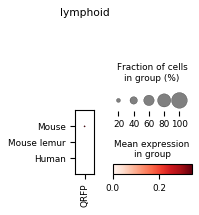


------- group: myeloid -------


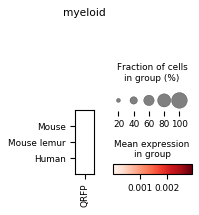


------- group: stromal -------


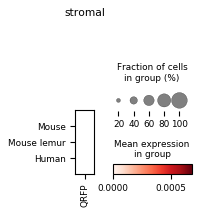

		--- bitscore: 000000000000000000000000000100100100100100000000000000000000000000000 ---
['INSL6']
gene subset #1

------- group: endothelial -------


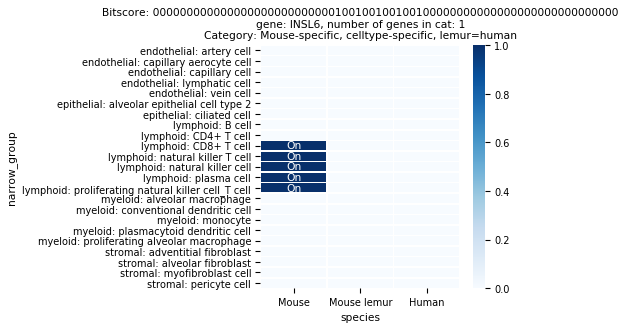

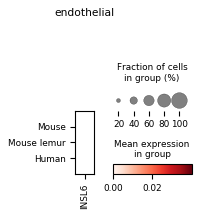


------- group: epithelial -------


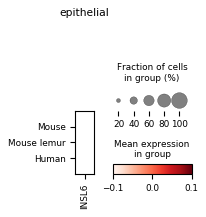


------- group: lymphoid -------


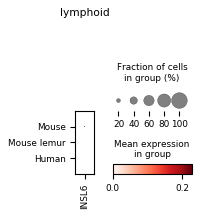


------- group: myeloid -------


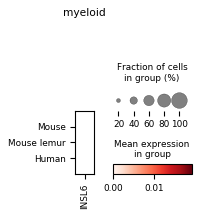


------- group: stromal -------


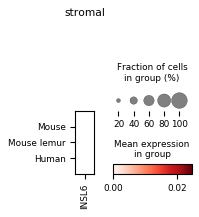

		--- bitscore: 000000000000000000000100000000000000000000000000000000000000000000000 ---
['ZNF831']
gene subset #1

------- group: endothelial -------


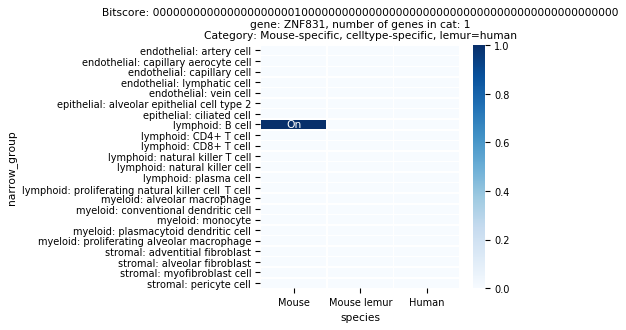

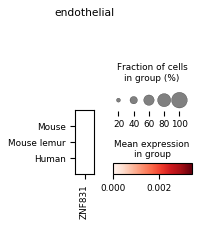


------- group: epithelial -------


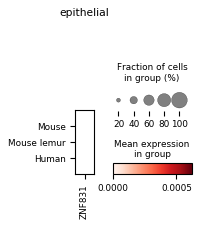


------- group: lymphoid -------


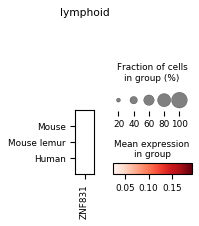


------- group: myeloid -------


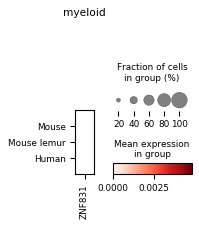


------- group: stromal -------


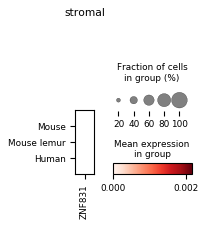

		--- bitscore: 000000000000000000000100000000000000000000000000000100000000100000100 ---
['IL12A']
gene subset #1

------- group: endothelial -------


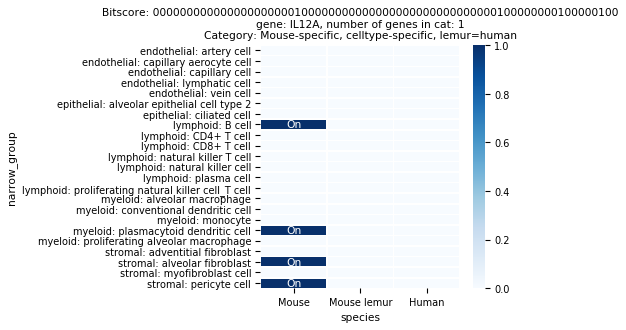

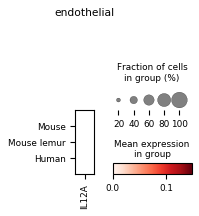


------- group: epithelial -------


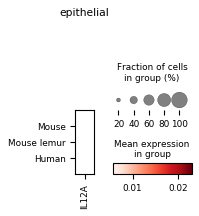


------- group: lymphoid -------


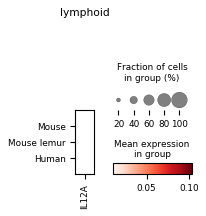


------- group: myeloid -------


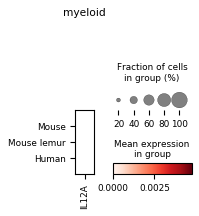


------- group: stromal -------


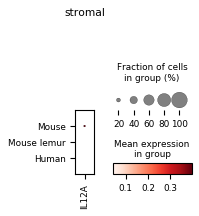

		--- bitscore: 000000000000000000000100000000000000100000000000000000000000000000000 ---
['CACNA1I']
gene subset #1

------- group: endothelial -------


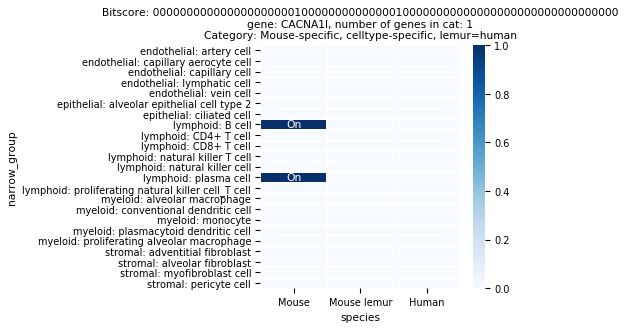

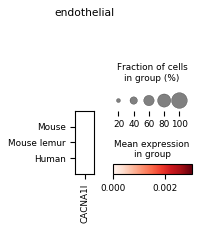


------- group: epithelial -------


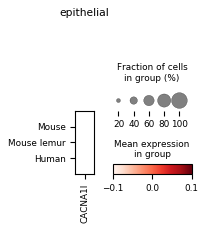


------- group: lymphoid -------


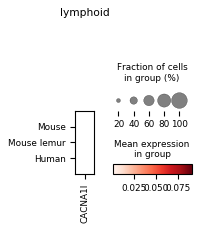


------- group: myeloid -------


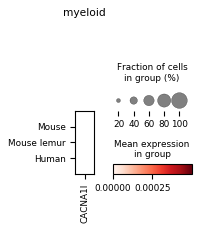


------- group: stromal -------


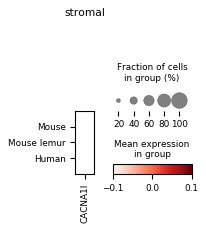

		--- bitscore: 000000000000000000000100000000000000100100100100100100100100000000100 ---
['APOBEC1']
gene subset #1

------- group: endothelial -------


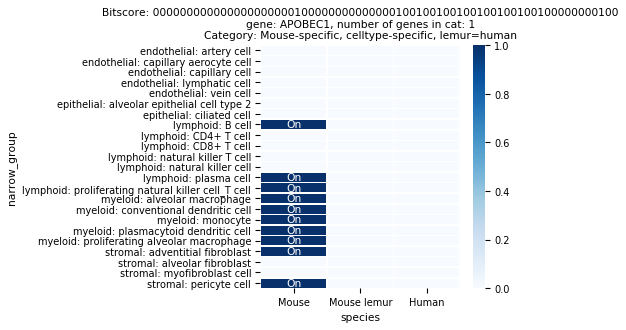

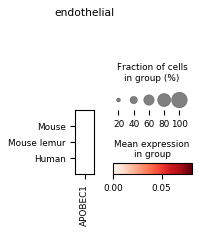


------- group: epithelial -------


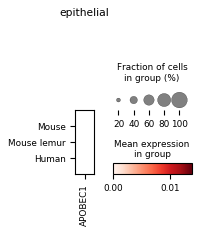


------- group: lymphoid -------


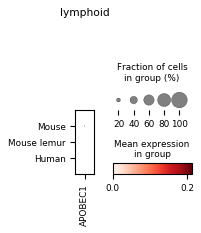


------- group: myeloid -------


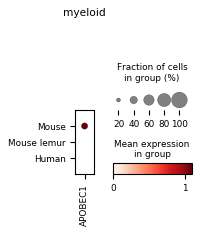


------- group: stromal -------


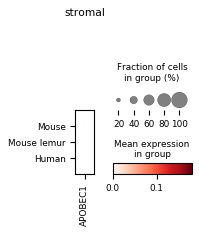

		--- bitscore: 000000000000000000000100000100000000100100000000000100000000000000000 ---
['DFFB']
gene subset #1

------- group: endothelial -------


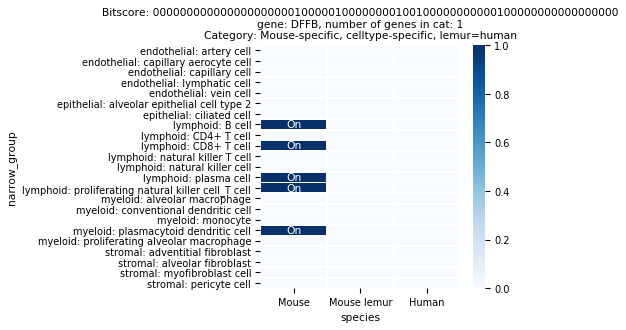

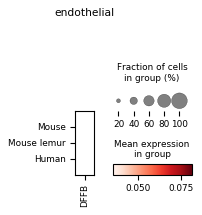


------- group: epithelial -------


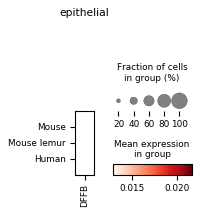


------- group: lymphoid -------


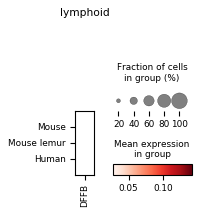


------- group: myeloid -------


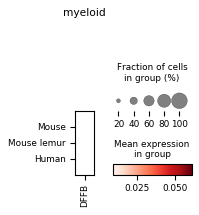


------- group: stromal -------


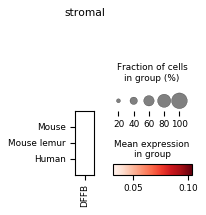

		--- bitscore: 000000000000000000000100100100100000100000000000000000000000000000000 ---
['FAM169B']
gene subset #1

------- group: endothelial -------


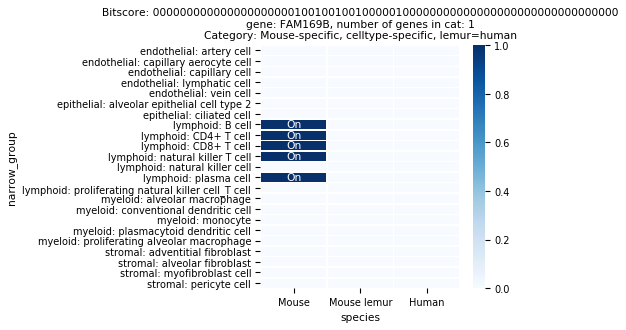

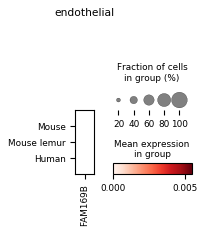


------- group: epithelial -------


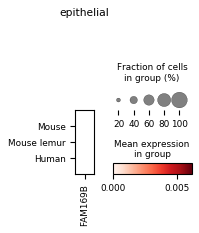


------- group: lymphoid -------


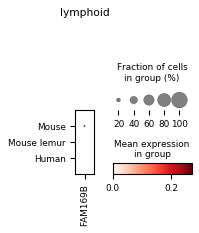


------- group: myeloid -------


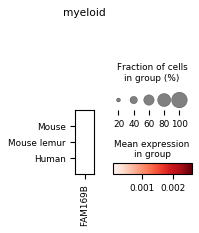


------- group: stromal -------


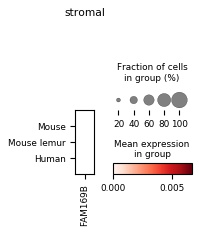

		--- bitscore: 000000000000000000100000000000000000000000000000000000000000000000000 ---
['ZBTB12']
gene subset #1

------- group: endothelial -------


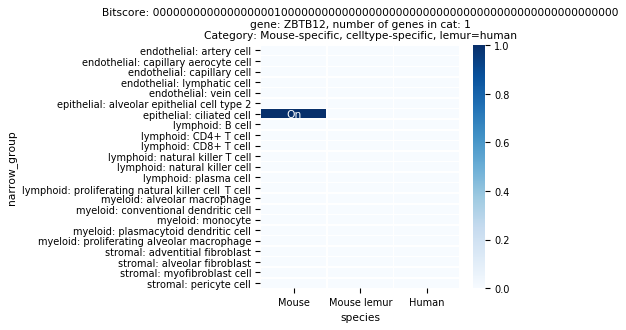

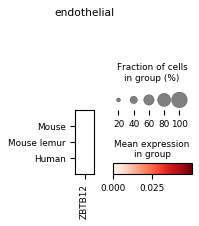


------- group: epithelial -------


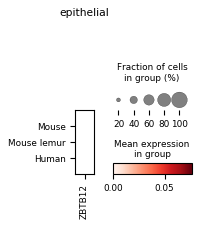


------- group: lymphoid -------


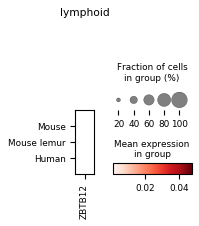


------- group: myeloid -------


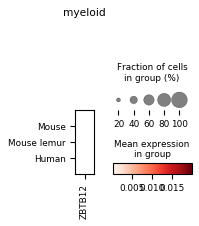


------- group: stromal -------


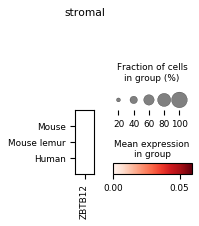

		--- bitscore: 000000000000000000100000000000000000000000000100100100000000000000000 ---
['GALNT9']
gene subset #1

------- group: endothelial -------


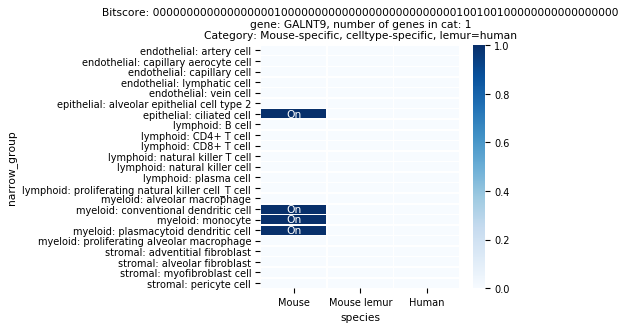

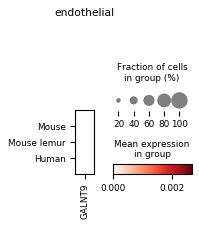


------- group: epithelial -------


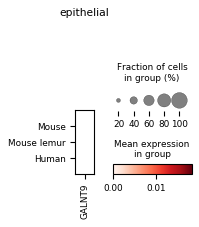


------- group: lymphoid -------


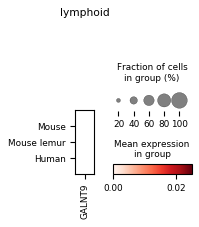


------- group: myeloid -------


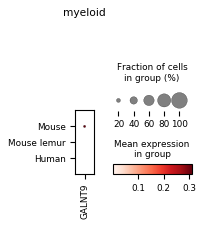


------- group: stromal -------


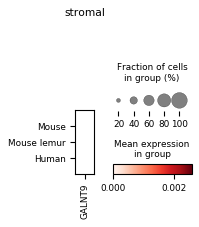

		--- bitscore: 000000000000000000100000000000000000100100000100100100000000000000000 ---
['NEURL2']
gene subset #1

------- group: endothelial -------


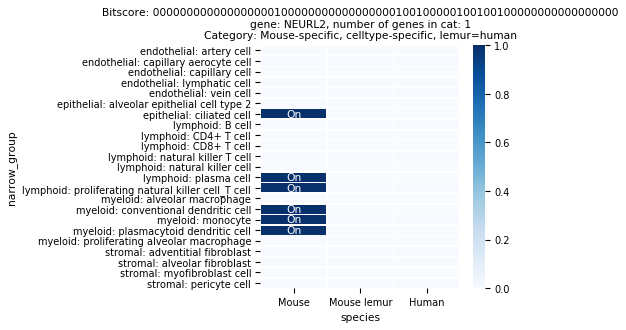

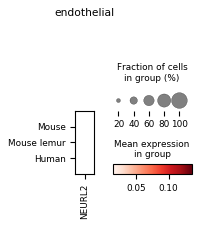


------- group: epithelial -------


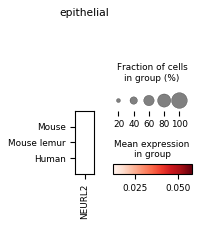


------- group: lymphoid -------


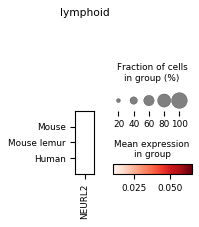


------- group: myeloid -------


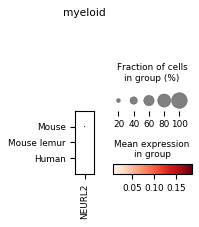


------- group: stromal -------


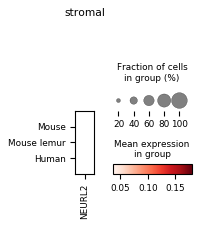

		--- bitscore: 000000000000000000100000100100100000100000000000000000000000000000000 ---
['UNC5CL']
gene subset #1

------- group: endothelial -------


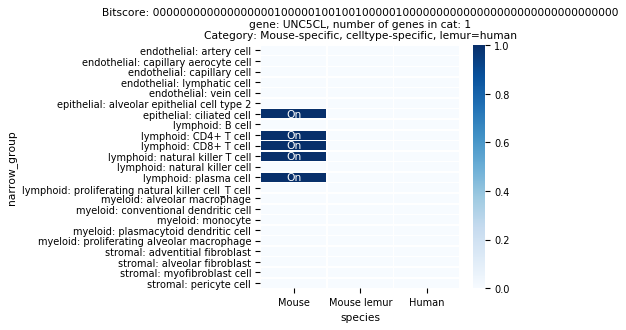

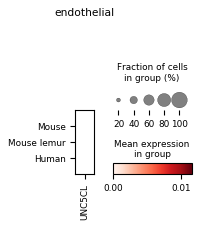


------- group: epithelial -------


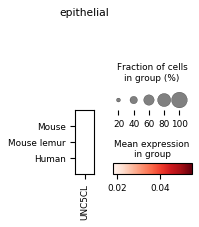


------- group: lymphoid -------


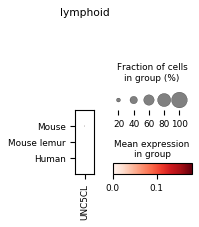


------- group: myeloid -------


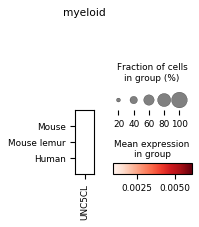


------- group: stromal -------


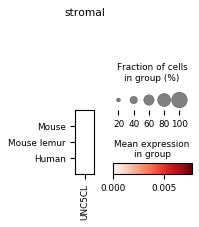

		--- bitscore: 000000000000000000100100000000000000000000000000000000000000000000100 ---
['DIRAS2']
gene subset #1

------- group: endothelial -------


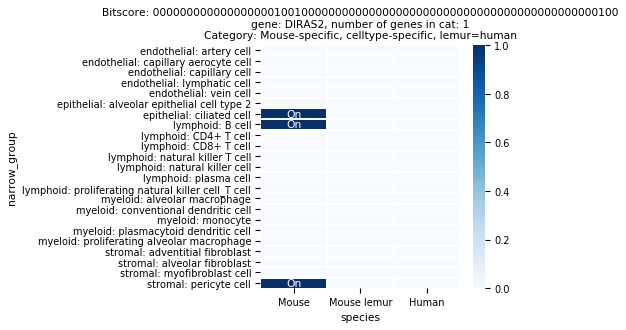

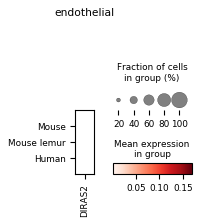


------- group: epithelial -------


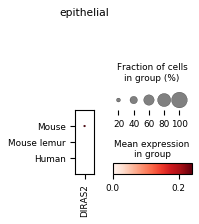


------- group: lymphoid -------


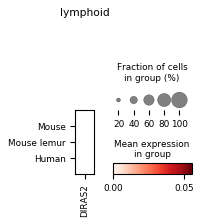


------- group: myeloid -------


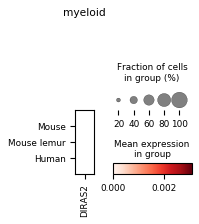


------- group: stromal -------


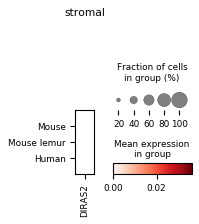

		--- bitscore: 000000000000000100000000000000000000000000100000000000100000000000000 ---
['F7']
gene subset #1

------- group: endothelial -------


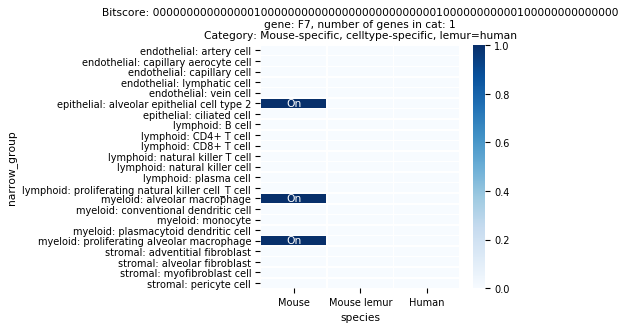

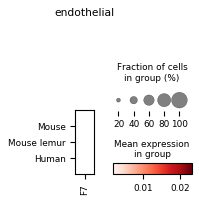


------- group: epithelial -------


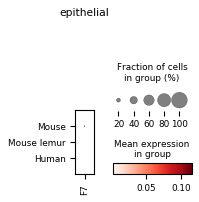


------- group: lymphoid -------


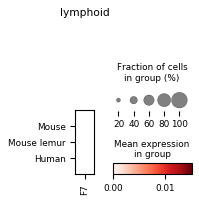


------- group: myeloid -------


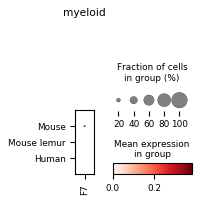


------- group: stromal -------


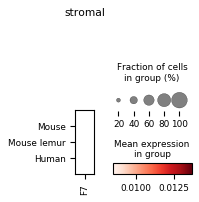

		--- bitscore: 000000000000000100100000000000000000000000000000000000000100000000000 ---
['AGMO']
gene subset #1

------- group: endothelial -------


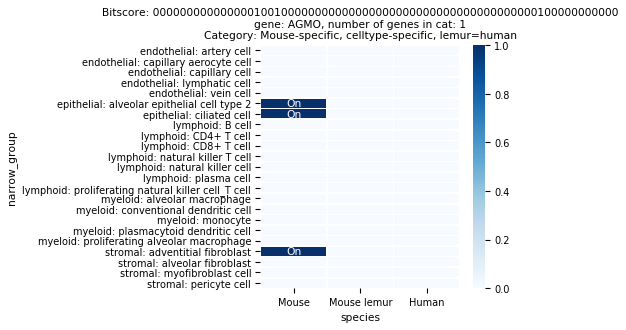

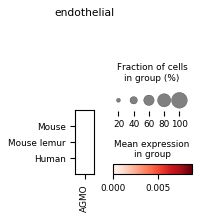


------- group: epithelial -------


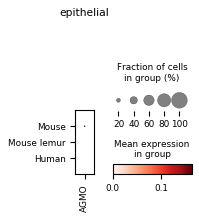


------- group: lymphoid -------


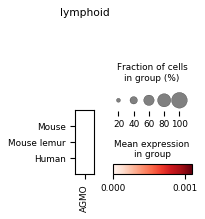


------- group: myeloid -------


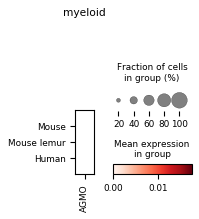


------- group: stromal -------


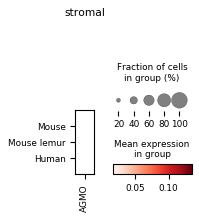

		--- bitscore: 000000000000000100100000000000000000000000000000000100000000000000000 ---
['ZNF777']
gene subset #1

------- group: endothelial -------


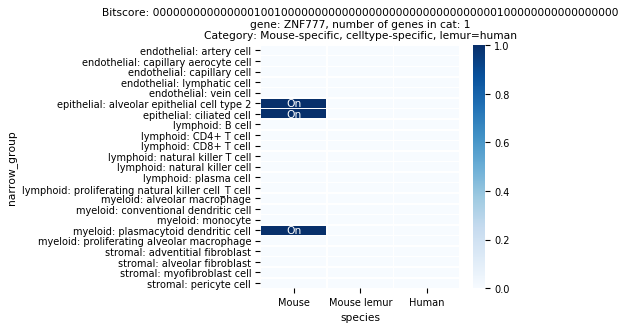

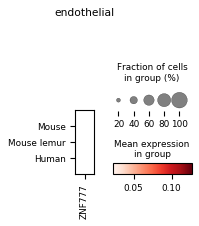


------- group: epithelial -------


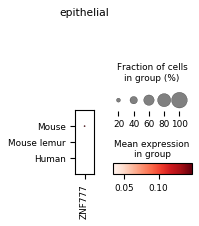


------- group: lymphoid -------


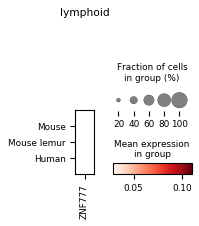


------- group: myeloid -------


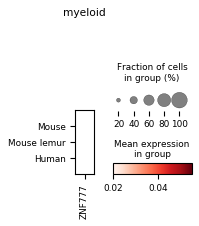


------- group: stromal -------


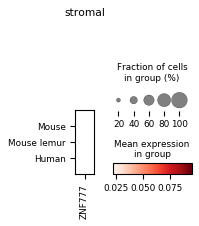

		--- bitscore: 000000000000000100100000000000000000000100000000000100100000000000000 ---
['ACAD11']
gene subset #1

------- group: endothelial -------


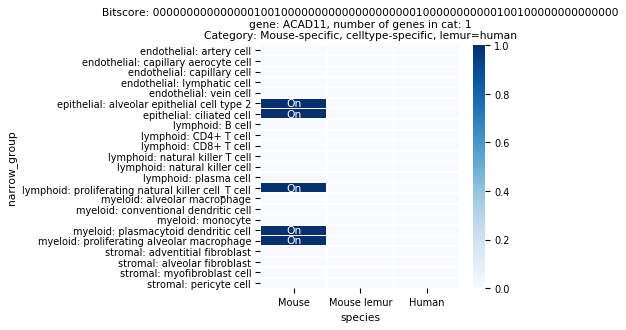

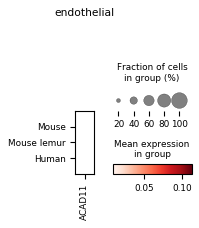


------- group: epithelial -------


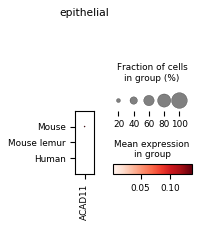


------- group: lymphoid -------


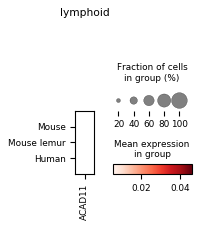


------- group: myeloid -------


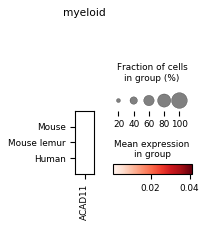


------- group: stromal -------


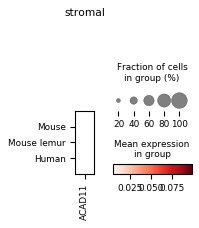

		--- bitscore: 000000000000000100100000000000000000100100000100000000100000000000000 ---
['SAMD10']
gene subset #1

------- group: endothelial -------


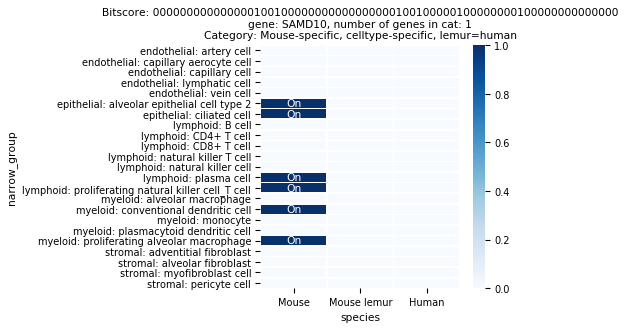

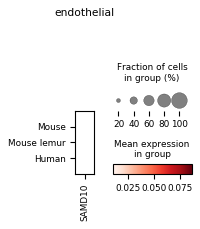


------- group: epithelial -------


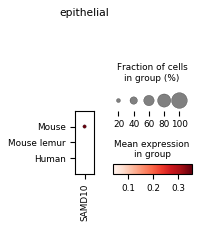


------- group: lymphoid -------


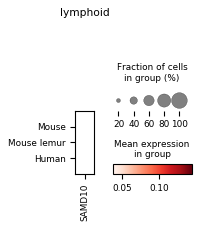


------- group: myeloid -------


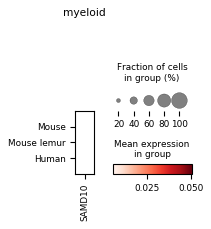


------- group: stromal -------


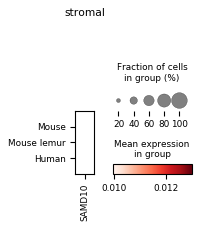

		--- bitscore: 000000000000000100100000100100100100100100100100000000000000000000000 ---
['RAB19']
gene subset #1

------- group: endothelial -------


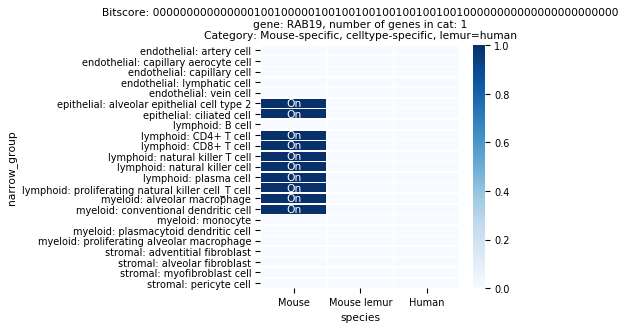

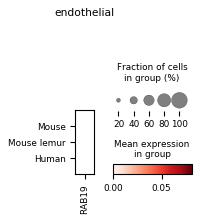


------- group: epithelial -------


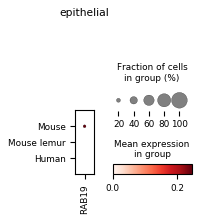


------- group: lymphoid -------


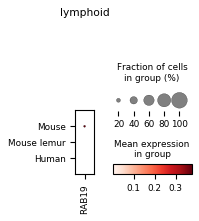


------- group: myeloid -------


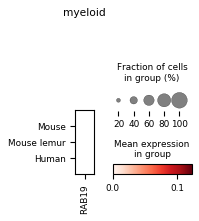


------- group: stromal -------


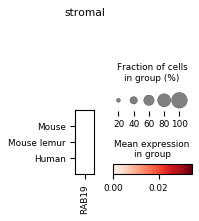

		--- bitscore: 000000000000000100100100000000000000100000000100000000000000000000000 ---
['CACNA1S']
gene subset #1

------- group: endothelial -------


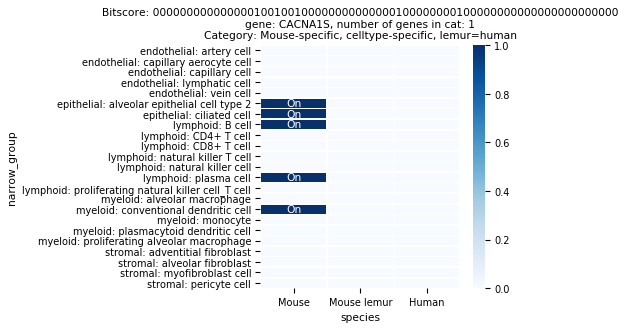

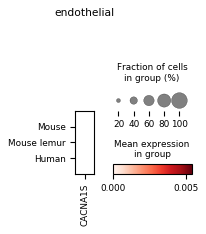


------- group: epithelial -------


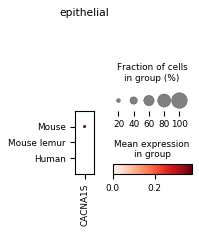


------- group: lymphoid -------


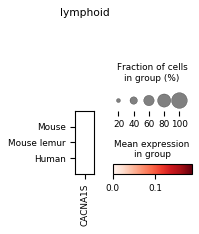


------- group: myeloid -------


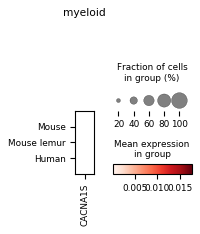


------- group: stromal -------


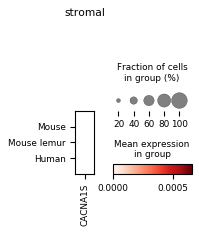

		--- bitscore: 000000000100000000000000000000000100000100000000000000000100100100100 ---
['C1QTNF6']
gene subset #1

------- group: endothelial -------


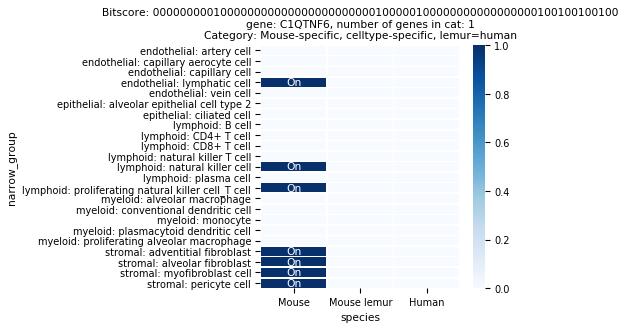

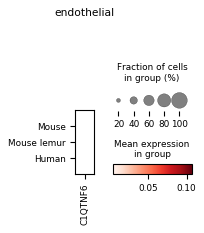


------- group: epithelial -------


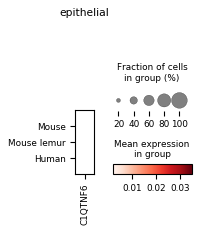


------- group: lymphoid -------


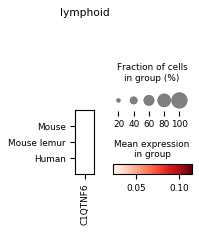


------- group: myeloid -------


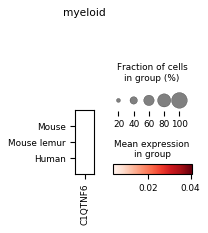


------- group: stromal -------


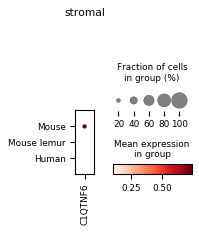

		--- bitscore: 000000000100100000100000000000000000100000000100000000000000100100100 ---
['EXOC6B']
gene subset #1

------- group: endothelial -------


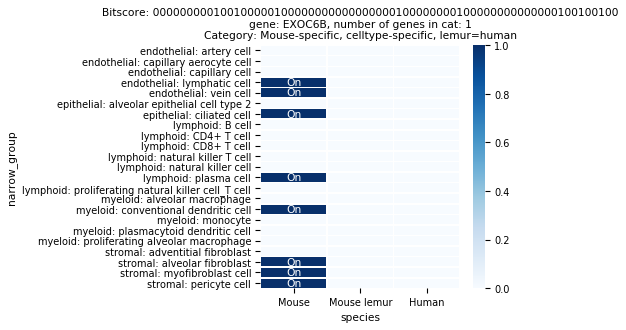

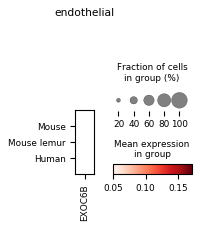


------- group: epithelial -------


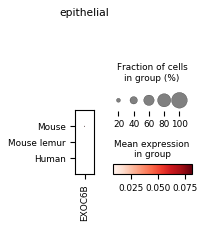


------- group: lymphoid -------


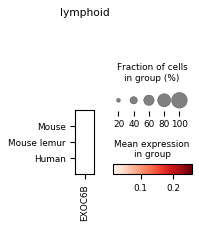


------- group: myeloid -------


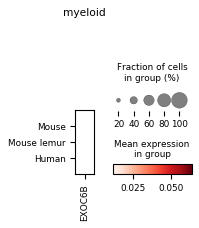


------- group: stromal -------


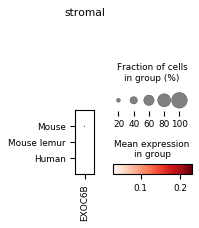

		--- bitscore: 000000100000000000000000000000000000000000000000000000000000000000000 ---
['GARNL3']
gene subset #1

------- group: endothelial -------


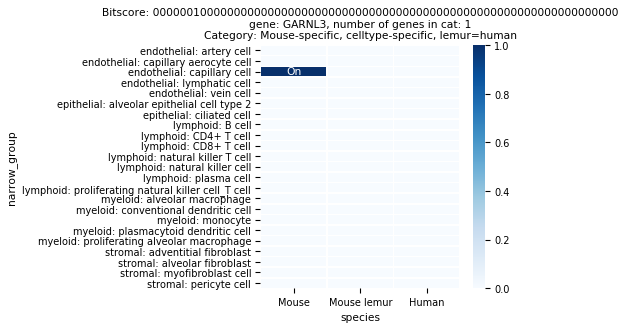

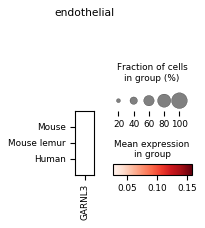


------- group: epithelial -------


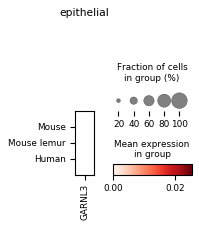


------- group: lymphoid -------


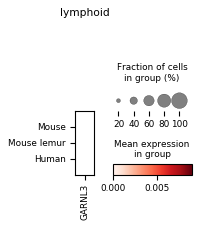


------- group: myeloid -------


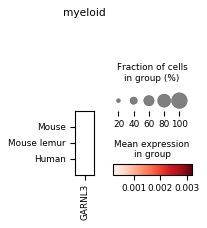


------- group: stromal -------


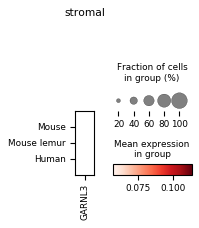

		--- bitscore: 000100000000000000000000000000000000000000000000000000000000000100000 ---
['FAM78B']
gene subset #1

------- group: endothelial -------


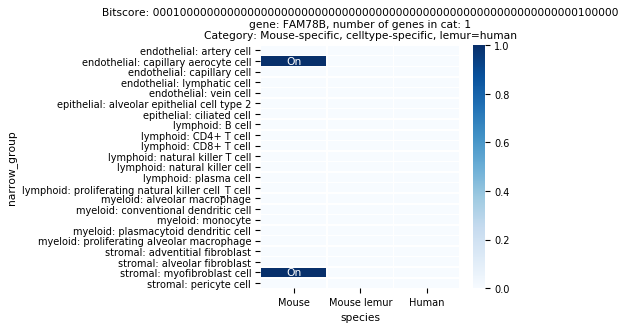

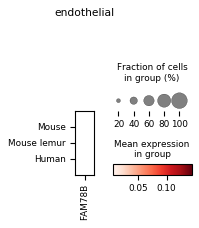


------- group: epithelial -------


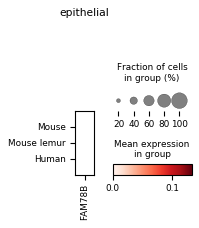


------- group: lymphoid -------


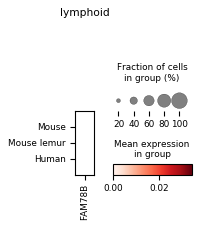


------- group: myeloid -------


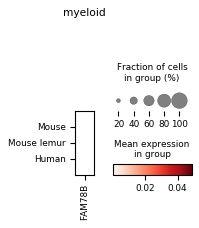


------- group: stromal -------


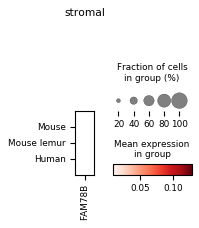

		--- bitscore: 000100000000000000000100000000000000000000100100000000100000000000000 ---
['CNR2']
gene subset #1

------- group: endothelial -------


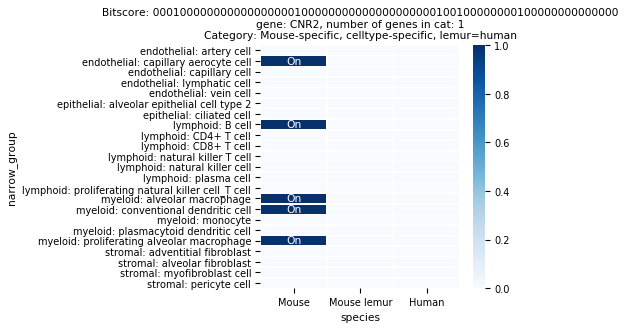

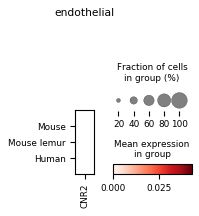


------- group: epithelial -------


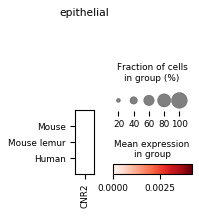


------- group: lymphoid -------


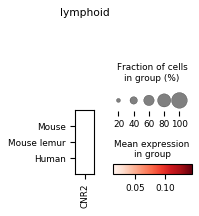


------- group: myeloid -------


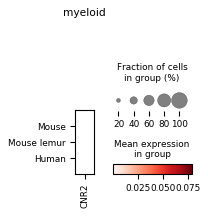


------- group: stromal -------


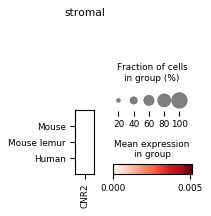

		--- bitscore: 000100100000100000000000000000000000000100000000000000000100000000100 ---
['PCBP3']
gene subset #1

------- group: endothelial -------


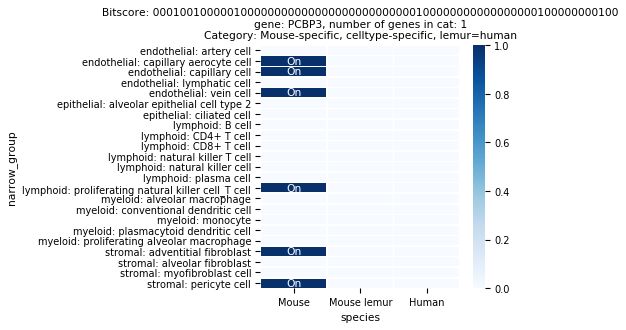

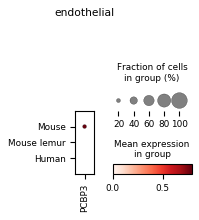


------- group: epithelial -------


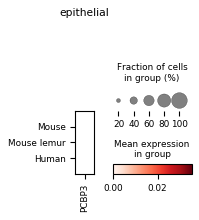


------- group: lymphoid -------


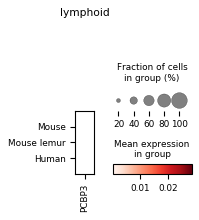


------- group: myeloid -------


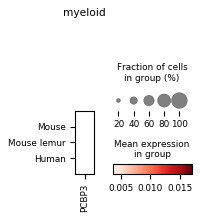


------- group: stromal -------


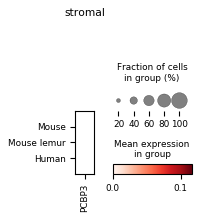

		--- bitscore: 000100100000100000100000000000000000000000000000000000100100100100100 ---
['ZNF436']
gene subset #1

------- group: endothelial -------


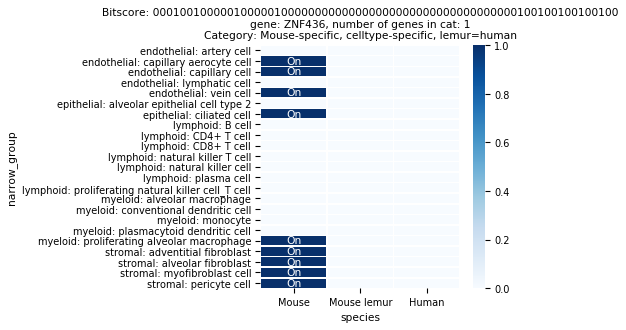

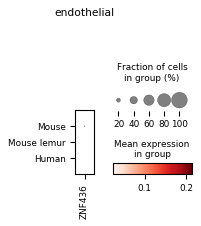


------- group: epithelial -------


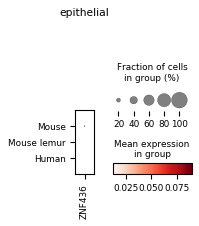


------- group: lymphoid -------


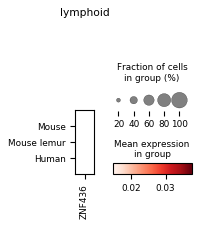


------- group: myeloid -------


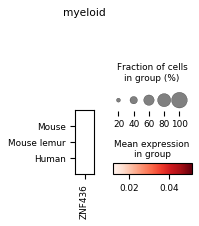


------- group: stromal -------


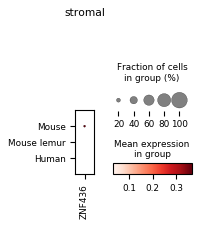

		--- bitscore: 000100100100100000100000000000000000100100000000000000000100100000100 ---
['DAND5']
gene subset #1

------- group: endothelial -------


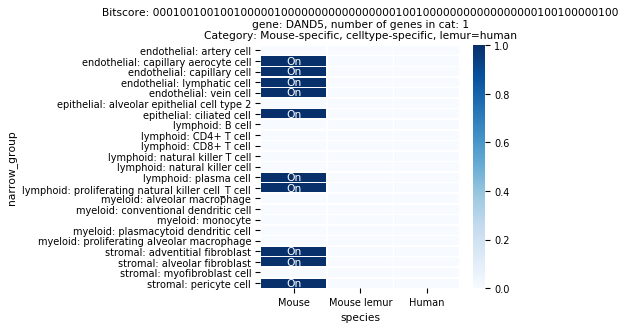

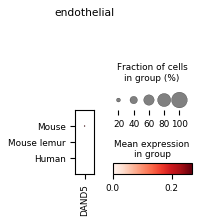


------- group: epithelial -------


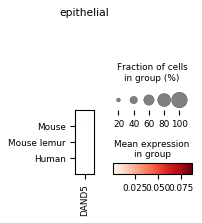


------- group: lymphoid -------


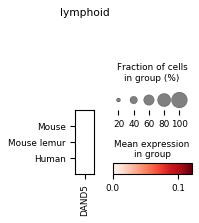


------- group: myeloid -------


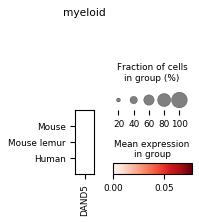


------- group: stromal -------


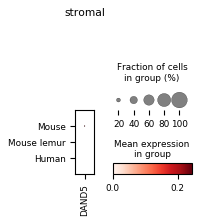

		--- bitscore: 100000000000000000000000100100100000000100100100000000100000000000000 ---
['BTBD19']
gene subset #1

------- group: endothelial -------


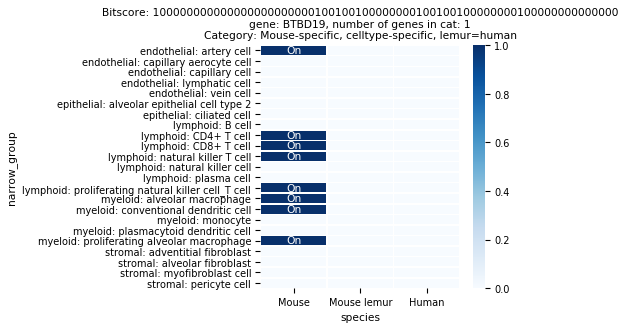

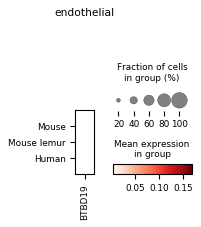


------- group: epithelial -------


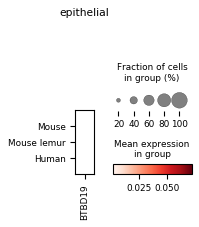


------- group: lymphoid -------


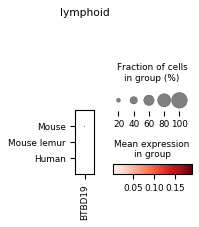


------- group: myeloid -------


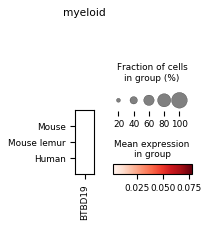


------- group: stromal -------


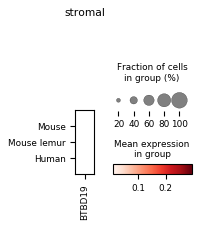

		--- bitscore: 100000000000000000100000000000000000100100000000000000000100000000000 ---
['ANKRD24']
gene subset #1

------- group: endothelial -------


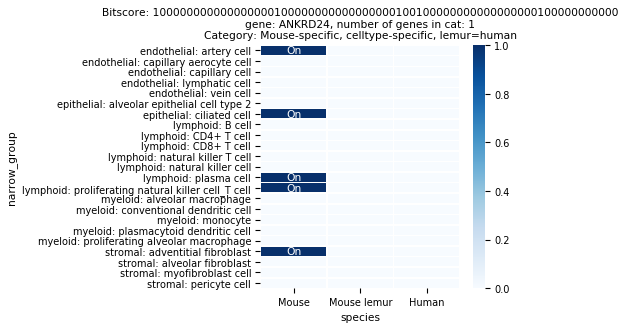

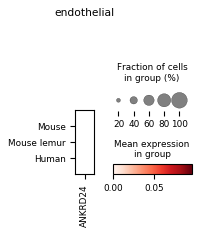


------- group: epithelial -------


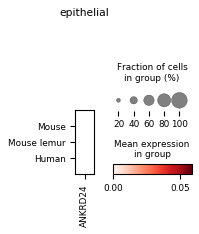


------- group: lymphoid -------


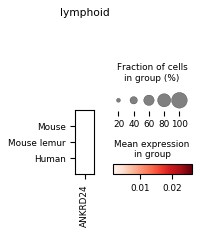


------- group: myeloid -------


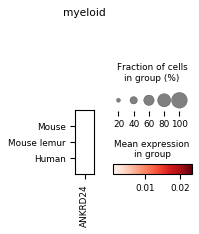


------- group: stromal -------


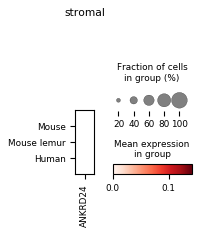

		--- bitscore: 100000000000000000100000000000100000000000000100100100000100000000000 ---
['LMO1']
gene subset #1

------- group: endothelial -------


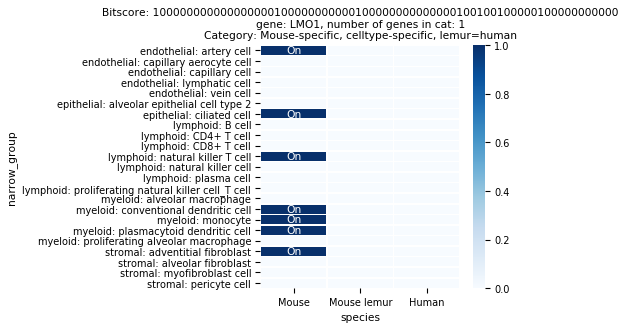

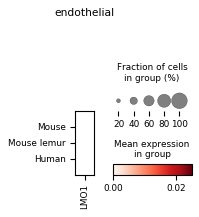


------- group: epithelial -------


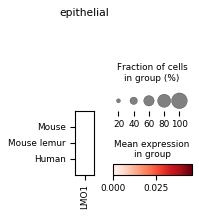


------- group: lymphoid -------


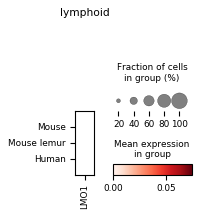


------- group: myeloid -------


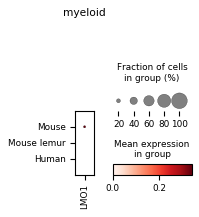


------- group: stromal -------


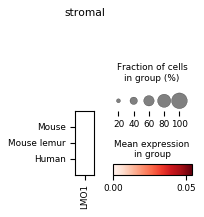

		--- bitscore: 100000000000000000100000100100100000000000000000000000000000000000000 ---
['SDCBP2']
gene subset #1

------- group: endothelial -------


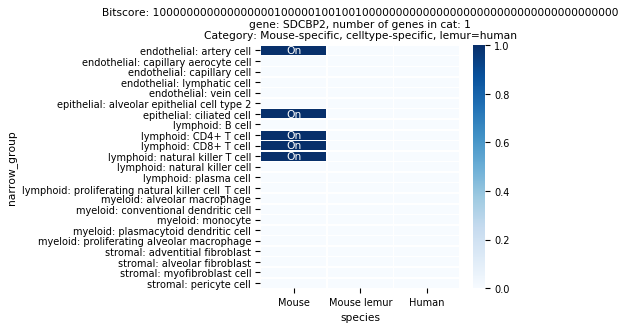

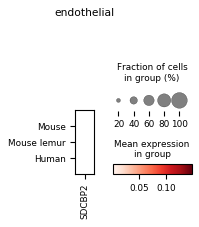


------- group: epithelial -------


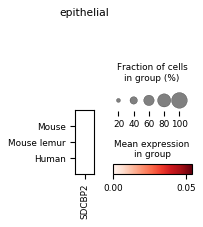


------- group: lymphoid -------


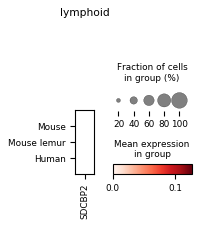


------- group: myeloid -------


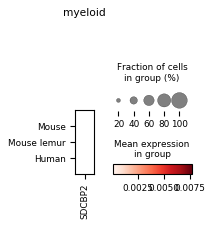


------- group: stromal -------


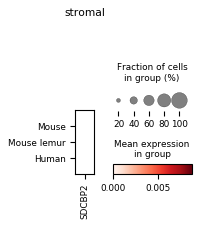

		--- bitscore: 100000000000000100100000000000000000000100000000000000000100100000000 ---
['LRIG2']
gene subset #1

------- group: endothelial -------


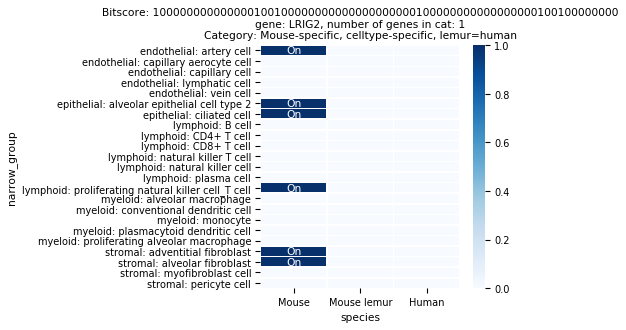

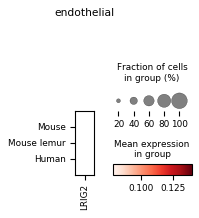


------- group: epithelial -------


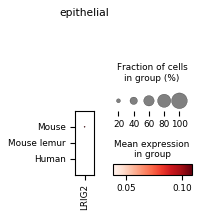


------- group: lymphoid -------


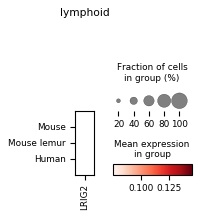


------- group: myeloid -------


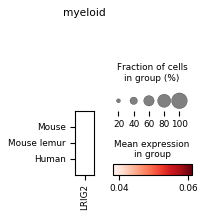


------- group: stromal -------


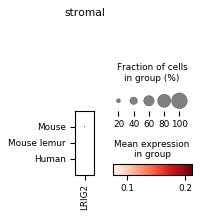

		--- bitscore: 100100000000000000000000000000000000000000000000000000000000000000000 ---
['NUDT17']
gene subset #1

------- group: endothelial -------


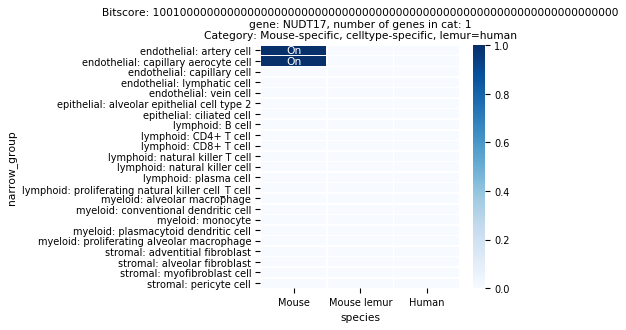

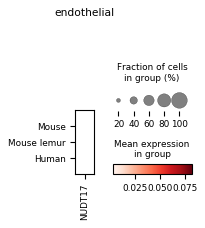


------- group: epithelial -------


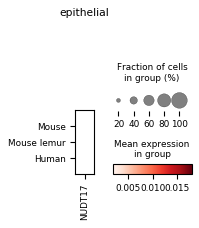


------- group: lymphoid -------


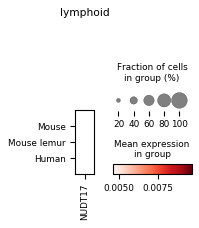


------- group: myeloid -------


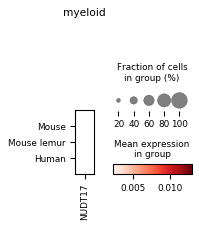


------- group: stromal -------


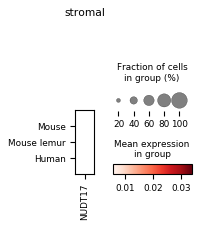

		--- bitscore: 100100000000100000100000000000000000100000100100100100100100000000000 ---
['GDA']
gene subset #1

------- group: endothelial -------


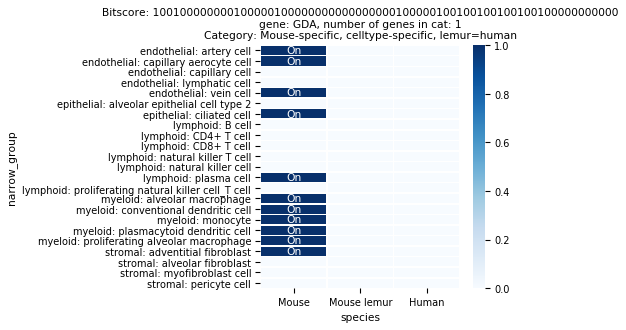

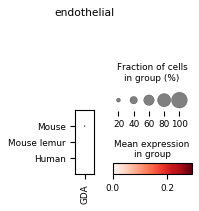


------- group: epithelial -------


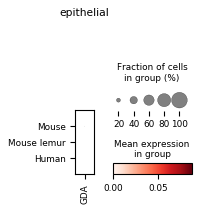


------- group: lymphoid -------


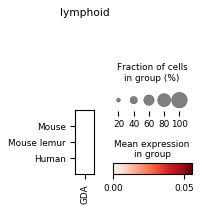


------- group: myeloid -------


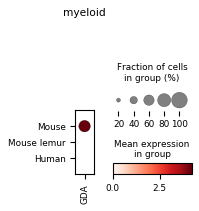


------- group: stromal -------


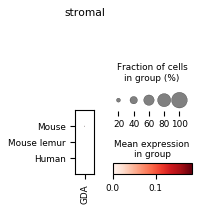

		--- bitscore: 100100100000100000000000000100100100000100000000000000000000000000000 ---
['ZFPM1']
gene subset #1

------- group: endothelial -------


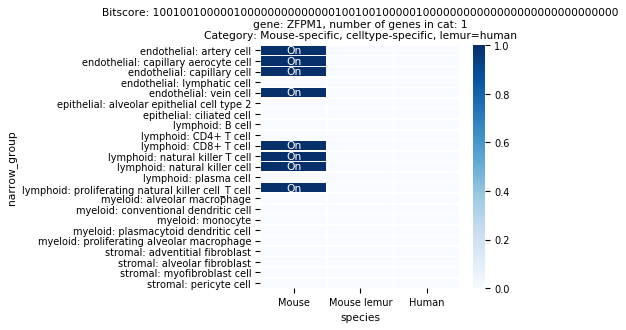

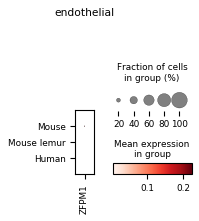


------- group: epithelial -------


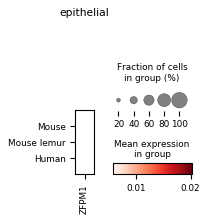


------- group: lymphoid -------


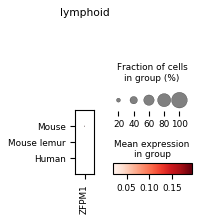


------- group: myeloid -------


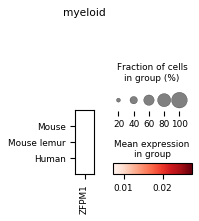


------- group: stromal -------


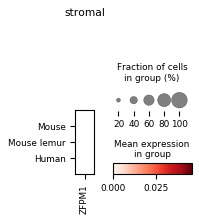

		--- bitscore: 100100100000100000000000100100100100100100100100000100100000000000000 ---
['KLK8']
gene subset #1

------- group: endothelial -------


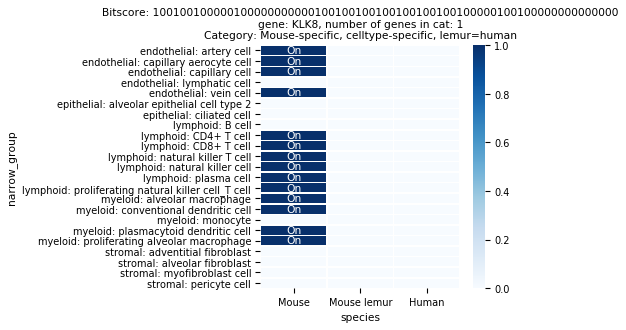

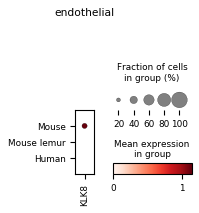


------- group: epithelial -------


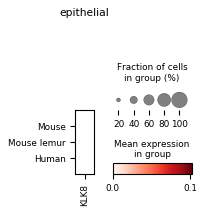


------- group: lymphoid -------


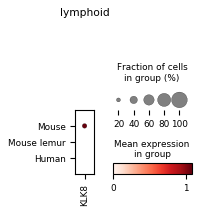


------- group: myeloid -------


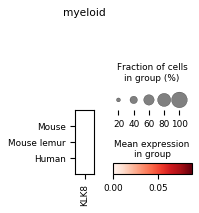


------- group: stromal -------


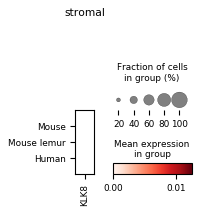

		--- bitscore: 100100100100100100000000100000100100100100100100100000100100100100100 ---
['XDH']
gene subset #1

------- group: endothelial -------


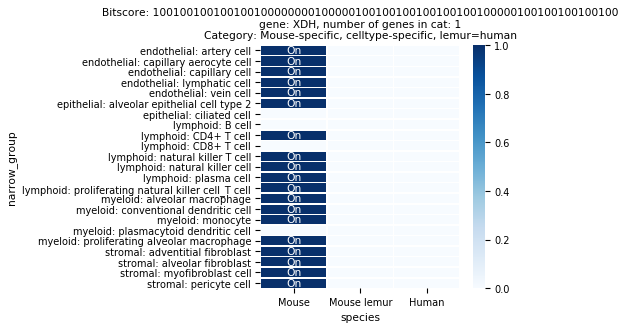

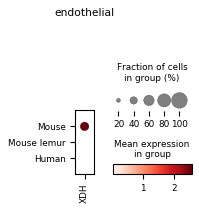


------- group: epithelial -------


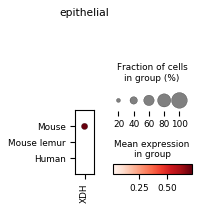


------- group: lymphoid -------


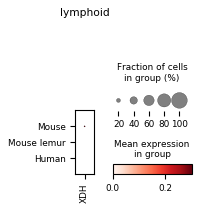


------- group: myeloid -------


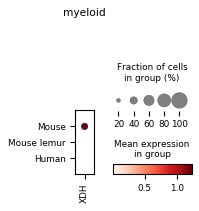


------- group: stromal -------


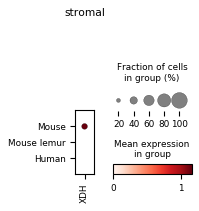

		--- bitscore: 100100100100100100000100000000000000100100000000000000100100100100000 ---
['SLC24A5']
gene subset #1

------- group: endothelial -------


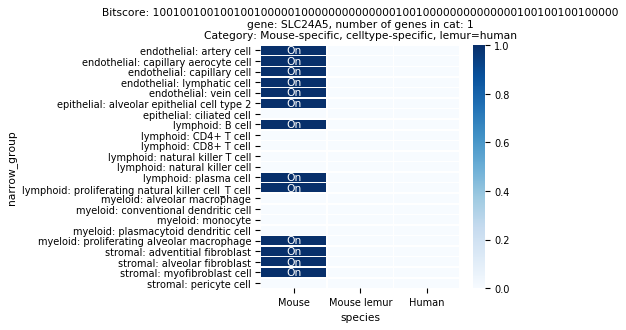

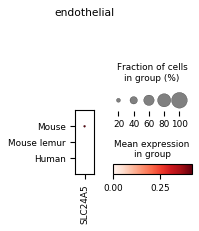


------- group: epithelial -------


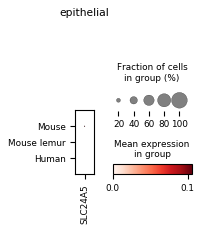


------- group: lymphoid -------


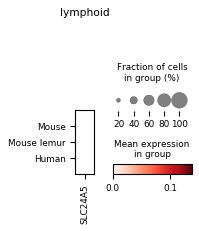


------- group: myeloid -------


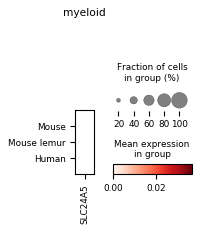


------- group: stromal -------


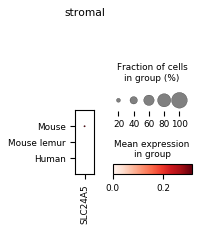

		--- bitscore: 100100100100100100100100000100100100100100100100100100000000100100100 ---
['AS3MT']
gene subset #1

------- group: endothelial -------


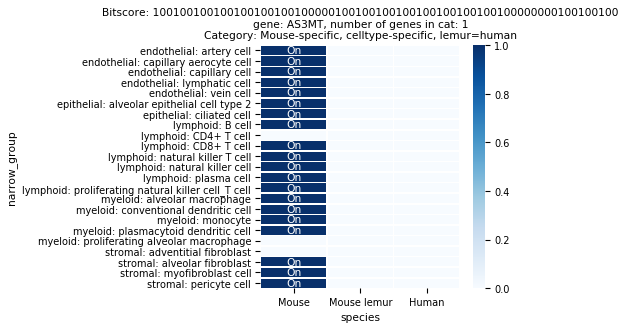

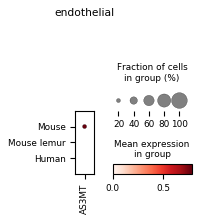


------- group: epithelial -------


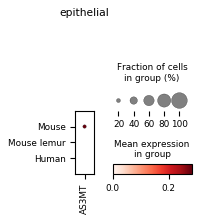


------- group: lymphoid -------


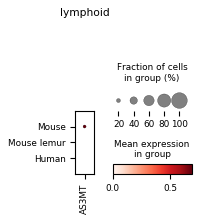


------- group: myeloid -------


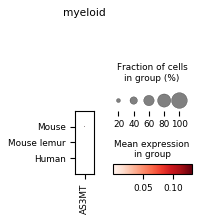


------- group: stromal -------


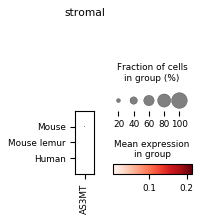

		--- bitscore: 100100100100100100100100100100100100100100000100000100100100100100100 ---
['MTCP1']
gene subset #1

------- group: endothelial -------


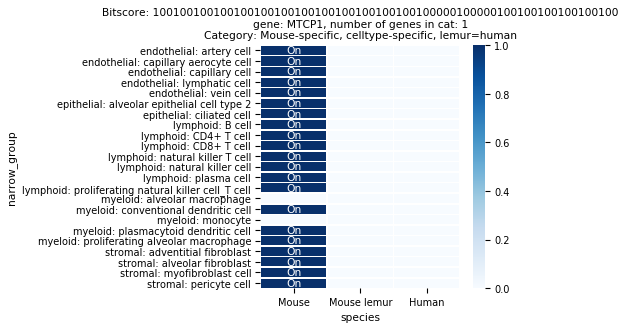

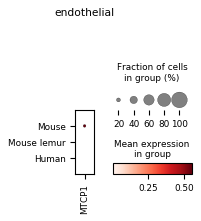


------- group: epithelial -------


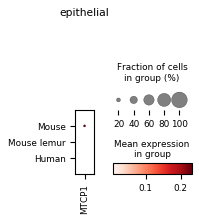


------- group: lymphoid -------


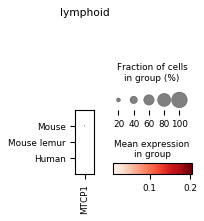


------- group: myeloid -------


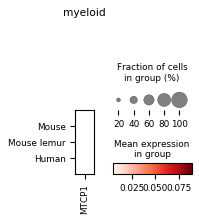


------- group: stromal -------


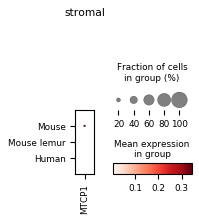

In [110]:
for gene_category, gene_category_df in lemur_eq_human__blood_lung_match.groupby(
    "gene_category"
):
    print(f"--- gene_category: {gene_category} ---")
    category_sanitized = xspecies.sanitize(gene_category)

    for tissue, tissue_df in gene_category_df.groupby("tissue"):
        print(f"\t--- tissue: {tissue} ---")
        cross_species = cross_species_compartment_objs[tissue]

        for bitscore, bitscore_df in tissue_df.groupby("bitscore"):
            print(f"\t\t--- bitscore: {bitscore} ---")
            gene_names = bitscore_df.gene_name.unique()

            binarized_df = binarized_dfs[tissue]

            fig, ax = plt.subplots(figsize=(4, 4))
            gene = gene_names[0]
            print(gene_names)
            binarized.plot_binarized_gene(gene, binarized_df, linewidth=0.5)
            ax.set(
                title=f"Bitscore: {bitscore}\ngene: {gene}, number of genes in cat: {len(bitscore_df)}\nCategory: {gene_category}"
            )
            #         compartment_narrow_col = narrow_to_compartment_narrrow[col_name]
            cross_species.dotplots(
                gene_names,
                #                 save=f"__binarized__{tissue}__{category_sanitized}__{bitscore}",
                #                 select_group=compartment_narrow_col,
                #                 save_format="pdf",
                max_genes=32,
                dot_min=0.05,
                dot_max=1,
            )
        #             break
#         break
#     break

In [104]:
%debug

> <ipython-input-78-0b45883a2f27>(18)<module>()
     16             binarized.plot_binarized_gene(gene_names[0], binarized_df, linewidth=0.5)
     17             ax.set(
---> 18                 title=f"Bitscore: {bitscore}\ngene: {gene}, number of genes in cat: {n_genes}\nCategory: {gene_category}"
     19             )
     20     #         compartment_narrow_col = narrow_to_compartment_narrrow[col_name]



ipdb>  q


In [18]:
lemur_eq_human__blood_lung_match.gene_name.nunique()

140